<span style="color:blue; font-weight:bold; font-size:24px;">IMDB DATASET - CAPSTONE PROJECT PHASE 3 & PHASE 4</span>

<span style="color:brown; font-weight:bold; font-size:20px;">By SATYA JYOTHI</span>

<span style="color:brown; font-weight:bold; font-size:16px;">Batch: DS0622, DATATRAINED</span>

**Phase 3**

1) Now make only 1 data frame of two CSV files using the join operation of pandas and start doing EDA.

2) Do the complete EDA in detail to explore the insights of data and write detailed observations of each analysis.

**Phase 4**

1) Write the complete Machine learning code to make predictions of votes and gross collection. Use appropriate models on their label basis. Remember you need to make 2 different predictions: vote and gross collection.

2) Apply all the best techniques of scaling, and hyperparameter tuning, and avoid underfitting or overfitting (bias/variance)

3) At the end save the best model and convey on which basis you have chosen that model.  

In [1]:
# importing required initial libraries
import numpy as np                 # Basic computation library
import pandas as pd                # for data wrangling purpose
import seaborn as sns              # For Visualization
import matplotlib.pyplot as plt    # For Plotting

import warnings
warnings.filterwarnings("ignore")  # Filtering warnings

In [2]:
# Reading csv file1
df_1=pd.read_csv("IMDB_1.csv", encoding='utf-8')
pd.set_option('display.max_columns', None)
df_1

,SNo.,Movie Name,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6
0,1,Spider-Man: Across the Spider-Verse,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,NaN,NaN,NaN
1,2,The Dark Knight,152,2008,9.0,84.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN
2,3,The Lord of the Rings: The Return of the King,201,2003,9.0,94.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN
3,4,Inception,148,2010,8.8,74.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN
4,5,The Lord of the Rings: The Fellowship of the Ring,178,2001,8.8,92.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1746,1747,Radhe,109,2021,1.9,NaN,Prabhu Deva,NaN,NaN,NaN,NaN,NaN
1747,1748,Race 3,160,2018,1.9,NaN,Remo D'Souza,NaN,NaN,NaN,NaN,NaN
1748,1749,Angels Apocalypse,85,2015,1.7,NaN,Sean Cain,Enzo Zelocchi,NaN,NaN,NaN,NaN
1749,1750,The Cost of Deception,125,2021,1.5,NaN,Keith English,NaN,NaN,NaN,NaN,NaN


In [3]:
# Reading csv file 2
df_2=pd.read_csv("IMDB_2.csv", encoding='utf-8')
df_2

,Movie Name,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity
0,Spider-Man: Across the Spider-Verse,38365,PG,NaN,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0
1,The Dark Knight,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0
2,The Lord of the Rings: The Return of the King,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0
3,Inception,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0
4,The Lord of the Rings: The Fellowship of the Ring,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1746,Radhe,178812,TV-MA,NaN,Salman Khan,Disha Patani,Randeep Hooda,Jackie Shroff,Action,Crime,Thriller,NaN
1747,Race 3,47590,Not Rated,1.69,Anil Kapoor,Salman Khan,Bobby Deol,Jacqueline Fernandez,Action,Crime,Thriller,NaN
1748,Angels Apocalypse,42911,NaN,NaN,Enzo Zelocchi,Jana Rochelle,Ryan C.F. Buckley,William Kirkham,Action,Fantasy,Sci-Fi,NaN
1749,The Cost of Deception,39491,NaN,NaN,Vivianne Bánovits,András Mózes,Barna Bokor,Gabriella Gubás,Action,Crime,Drama,NaN


In [4]:
# Perform the join operation on df_1 and df_2 to get single dataframe
df = pd.merge(df_1, df_2, on='Movie Name', how='inner')
df.to_csv('IMDB.csv', index=False)
df.head()

,SNo.,Movie Name,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity
0,1,Spider-Man: Across the Spider-Verse,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,NaN,NaN,NaN,38365,PG,NaN,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0
1,2,The Dark Knight,152,2008,9.0,84.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0
2,3,The Lord of the Rings: The Return of the King,201,2003,9.0,94.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0
3,4,Inception,148,2010,8.8,74.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0
4,5,The Lord of the Rings: The Fellowship of the Ring,178,2001,8.8,92.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0


<span style="color:blue; font-weight:bold; font-size:26px;">Dataset Understanding</span>


- **"SNo."** - This column contains a number that is assigned to each row to know the total no. of movies.


- **"Movie Name"** - This column contains all movie names availale in IMDb website


- **"Duration (min)"** - This columns contains the duration of movie in minutes


- **"Year"** - This column contains the release year of movie


- **"Ratings"** - This column contains the IMDb ratings for each movie. Ratings on IMDb represent the average score given by users  who have rated a particular movie. Users can rate movies on a scale of 1 to 10, with 10 being the highest rating. The IMDb rating is a way for viewers to express their opinion and evaluate the overall quality of a movie. It provides a general indication of how well-received a movie is among the IMDb user community.


- **"Metascore"** - This column contains the Metascore for each movie. The Metascore is a numerical value assigned to a movie based on aggregated reviews from professional critics. IMDb collects reviews from various trusted sources, calculates the average score, and assigns it as the Metascore. It provides a snapshot of the critical reception of a movie, helping viewers gauge its overall quality. The Metascore typically ranges from 0 to 100, with higher scores indicating more favorable reviews.


- **"Director1 to Director 6"** - There are 6 Director columns in the dataset. The no. of movie directors are varying for different movies, hence I noticed the null values in these columns for some movies where the no. of directors count is not equal to 6. "Director"plays a key role in the filmmaking process and plays a vital role in shaping the overall vision of the project


- **"Votes"** - This column contains the no. of votes for each movie. Votes on IMDb represent the number of users who have rated a particular movie. Users can rate movies on a scale of 1 to 10, with 10 being the highest rating. The vote count can provide an indication of the movie's popularity and the level of engagement it has generated among IMDb users. Movies with a higher number of votes often indicate greater viewer interest.


- **"Certification"** - This column contains Certification details provided by authority body for each movie. The certification of a movie refers to the content rating assigned to it by relevant authorities or film classification boards in different countries. It signifies the suitability of the movie for different age groups or audiences based on its content. For example, in the United States, movies can receive ratings such as G (General Audience), PG (Parental Guidance Suggested), PG-13 (Parents Strongly Cautioned), R (Restricted), or NC-17 (No One 17 and Under Admitted), among others. The certification information helps viewers understand the intended audience and content suitability for a movie. Below are the different certificaitions available in this dataset

1. 16+: Suitable for viewers aged 16 and above.
2. A: Appropriate for all audiences.
3. Approved: Indicating that the movie has been approved by a governing body or rating organization.
4. Certification: Referring to the overall rating or classification given to a movie.
5. G: General audience - suitable for all ages.
6. M: Suitable for mature audiences.
7. M/PG: A mixed rating indicating elements suitable for mature audiences but also suitable for parental guidance.
8. Not Rated: The movie has not received an official rating or certification.
9. Passed: Indicates that the movie has passed certain criteria or guidelines.
10. PG: Parental guidance suggested - some material may not be suitable for children.
11. PG-13: Parents strongly cautioned - some material may be inappropriate for children under 13.
12. R: Restricted - restricted to viewers above a certain age, usually 17 or 18.
13. TV-14: Suitable for viewers aged 14 and above for television shows.
14. TV-MA: Suitable for mature audiences only for television shows.
15. TV-PG: Parental guidance suggested for television shows.
16. U: Universal - suitable for all ages.
17. UA: Parental guidance suggested for children below the age of 12.

- **"Gross (USD millions)"** - This column contains the gross collection for each movie in US million dollars. Gross represents the total box office revenue generated by a movie. IMDb provides information on the financial success of movies by indicating their worldwide gross earnings. The gross figure reflects the total amount of money the movie has earned from ticket sales in theaters globally. This information can give viewers an idea of how commercially successful a movie has been, and it can also be used to compare the financial performance of different movies.


- **"Star 1 to Star 4** - There are 4 Star columns in the dataset. The no. of movie stars are varying for different movies, hence I noticed the null values in these columns for some movies where the no. of stars count is not equal to 4. "Star" refers to the actors or actresses who appear in movies, TV shows. The star information on IMDb allows users to discover movies or TV shows based on their favorite actors or actresses. The stars are typically well-known or prominent performers who play significant roles in the project.


- **"Genre 1 to Genre 3** - There are 3 Genre columns in the dataset. The no. of Genre cateogories are varying for different movies, hence I noticed the null values in these columns for some movies where the no. of Genres count is not equal to 3. "Genre" refers to the categorization of movies, TV shows. Genre classification helps to organize and classify titles into distinct categories, making it easier for users to find content that aligns with their interests. Below are the different Genres available in this dataset

1. Action: Movies involving exciting and dynamic physical feats, often including fighting, stunts, and high-intensity sequences.
2. Adventure: Films that revolve around exploration, travel, and exciting experiences in various settings.
3. Biography: Movies based on the life stories and achievements of real individuals, often focusing on historical or notable figures.
4. Comedy: Films that aim to entertain and amuse the audience through humor and light-hearted storytelling.
5. Crime: Movies centered around criminal activities, investigations, or the lives of individuals involved in illegal pursuits.
6. Drama: Films that portray realistic and emotionally-driven narratives, focusing on complex characters and their relationships.
7. Family: Movies intended for all members of the family, suitable for both children and adults to enjoy together.
8. Fantasy: Films set in imaginative or supernatural worlds, often featuring magical or mythical elements.
9. History: Movies that depict past events, historical figures, or significant periods in time, aiming to educate and inform.
10. Horror: Films that elicit feelings of fear, suspense, and terror through elements such as supernatural creatures, psychological thrillers, or gory scenes.
11. Music: Movies centered around music, musicians, or musical performances, often featuring original songs or famous artists.
12. Musical: Films where the storyline is interwoven with musical numbers and performances, often featuring singing and dancing.
13. Mystery: Movies that involve the investigation of a puzzling event, crime, or enigma, with an emphasis on uncovering the truth.
14. Romance: Films focused on love, relationships, and romantic encounters between characters.
15. Sci-Fi: Movies set in futuristic or speculative settings, often incorporating advanced technology, scientific concepts, or extraterrestrial elements.
16. Sport: Movies that revolve around sports activities, competitions, and the dedication of athletes.
17. Thriller: Films designed to create intense suspense and excitement, often involving fast-paced action, danger, and unexpected plot twists.
18. War: Movies set during wartime, depicting military conflicts, the experiences of soldiers, and the impact of war on individuals and societies.
19. Western: Films set in the American Old West or featuring themes, characters, and settings commonly associated with the Western genre.
20. Animation: Movies created using animation techniques, where the characters and environments are brought to life through drawings, computer-generated imagery (CGI), or stop-motion animation.


- **"Popularity"** - This column contains the popularity score for each movie. IMDb's popularity metric considers various factors like page views, user interactions, and search queries to determine the relative popularity of a movie within the IMDb platform. It takes into account the overall traffic and engagement associated with a movie's IMDb page. The popularity metric helps users identify movies that are currently trending or generating significant buzz.

In [5]:
# Checking the dimensions of the dataset
print('No. of Rows :',df.shape[0])
print('No. of Columns :', df.shape[1])

No. of Rows : 1751
No. of Columns : 23


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1751 entries, 0 to 1750
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   SNo.                  1751 non-null   int64  
 1   Movie Name            1751 non-null   object 
 2   Duration (min)        1751 non-null   int64  
 3   Year                  1751 non-null   int64  
 4   Ratings               1751 non-null   float64
 5   Metascore             1567 non-null   float64
 6   Director 1            1751 non-null   object 
 7   Director 2            113 non-null    object 
 8   Director 3            13 non-null     object 
 9   Director 4            6 non-null      object 
 10  Director 5            3 non-null      object 
 11  Director 6            1 non-null      object 
 12  Votes                 1751 non-null   int64  
 13  Certification         1741 non-null   object 
 14  Gross (USD millions)  1471 non-null   float64
 15  Star 1               

In [7]:
# Getting count of different datatypes of the dataframe
df.dtypes.value_counts()

object     15
int64       4
float64     4
dtype: int64

### Observations: ####
- **There are int, float and object data types available in the dataset**

In [8]:
# Sorting the columns based on the datatype
df.columns.to_series().groupby(df.dtypes).groups

{int64: ['SNo.', 'Duration (min)', 'Year', 'Votes'], float64: ['Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity'], object: ['Movie Name', 'Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', 'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']}

### Observations :
- **There are 1751 rows and 23 columns in the dataset.**
- **Out of 23 columns, there are 15 features with Object datatypes, 4 with int datatypes and rest are float datatypes**
- **Two Target Variables one is 'Votes' and 'Gross Collection'. Per problem statement, I need to develop two Regression models as target variable "Votes" is of 'int' datatype and "Gross Collection" is of float data type**

## Dropping insignificant columns

- **Dropping columns 'SNo.' and 'Movie Name' before further data processing.**
- **I assumed 'Movie Name' is insignificant here because the objective of developing ML models in this project is to predict 'Gross Collection' and 'Votes' in future with new data but the 'Movie Name' will keep changing and we can't use it as a input to predict in the future as new movie name will not be part of ML models. I assumed other factors like Directors, Stars etc. are more relevant in predicting 'Gross Collection' and 'Votes' with new data in future**

In [9]:
# Dropping insignificant columns 'SNo.' and 'Movie Name' 
df.drop(["SNo.","Movie Name"],axis=1,inplace=True)

In [10]:
df.head(2)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity
0,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,NaN,NaN,NaN,38365,PG,NaN,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0
1,152,2008,9.0,84.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0


<span style="color:blue; font-weight:bold; font-size:26px;">Data Integrity Check</span>

## Duplicate Values Check

In [11]:
df.duplicated().sum()

0

In [12]:
duplicate = df[df.duplicated()]
 
print("Duplicate Rows :")
 
# Print the resultant Dataframe
duplicate

Duplicate Rows :


,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity


#### Observations: 
- **No duplicate values present in the dataframe**

## Checking for the presense of any non-interpretable values 

- **I am checking all unique values in the dataset for each column and trying to identify any non-interpretable values, so that I can impute them with appropriate technique or I will take a decision to impute or not**
- **This also helps me to identify the empty columns**

In [13]:
# List of columns to compute value counts for
cols = df.columns

# Initialize an empty DataFrame for the value counts
vc = pd.DataFrame()

# Loop over the columns and compute value counts and look for white spaces
for col in cols:
    # I am excluding float and int data types because if any non-interpretable value is exists in any of these columns, 
    # then its datatype will be changed to "object"
    if df[col].dtype in ['float64', 'int64']: 
        continue
    if df[col].isin([' ']).any():
        print(f"\033[1m\"{col}\" column has white spaces\033[0m")
    vc_col = df[col].value_counts().to_frame().reset_index().rename(columns={'index': col, col: 'count'})
    # # Considering the values only if the count is > 10 as less than that probably indicates non-categorical feature 
    # but it is good to check once all the data by putting threshold of 0. I checked with threshold 0 and but displayed data
    # with threshold 10
    vc_col = vc_col[vc_col['count'] >= 10] 
    vc = pd.concat([vc, vc_col], axis=1).fillna('')

# Drop the 'count' column from the concatenated DataFrame
vc = vc.drop('count', axis=1)

# Store the final output in a DataFrame
vc_df = pd.DataFrame(vc)

# Display the value counts of the columns side by side
pd.set_option('display.max_rows', None)
display(vc_df)

,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Certification,Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3
0,Michael Bay,,,,,,R,Sylvester Stallone,Samuel L. Jackson,,,Action,Adventure,Drama
1,Tony Scott,,,,,,PG-13,Arnold Schwarzenegger,,,,Animation,Crime,Thriller
2,Robert Rodriguez,,,,,,PG,Bruce Willis,,,,,Comedy,Sci-Fi
3,Steven Spielberg,,,,,,Not Rated,Jason Statham,,,,,Drama,Crime
4,Antoine Fuqua,,,,,,TV-MA,Mel Gibson,,,,,Action,Comedy
5,Roland Emmerich,,,,,,UA,Nicolas Cage,,,,,Thriller,Fantasy
6,Paul W.S. Anderson,,,,,,G,Tom Cruise,,,,,Sci-Fi,Adventure
7,Zack Snyder,,,,,,,Dwayne Johnson,,,,,Horror,Horror
8,Guy Ritchie,,,,,,,Jackie Chan,,,,,Biography,History
9,Richard Donner,,,,,,,Vin Diesel,,,,,Mystery,Mystery


### Observations:
- **There are no non-interpretable values in the dataset**
- **However, I will check for null values in the next steps**

## Check Columns with Null Values, Empty Columns, Columns with One Unique Value and No. of Unique Value in each Column

In [14]:
# create an empty dataframe to store the number of unique values for each column
unique_values_df = pd.DataFrame(columns=['Column', 'Data_Type', 'Num_Unique_Values'])

for col in df.columns:
    # count the number of unique values for the current column
    if df[col].notna().any():
        num_unique_values = df[col].nunique()
        data_type = df[col].dtype
    else:
        num_unique_values = 0
        data_type = df[col].dtype
    
    # add the column name, data type and number of unique values to the unique_values_df dataframe
    unique_values_df = unique_values_df.append({'Column': col, 'Data_Type': data_type, 'Num_Unique_Values': num_unique_values}, ignore_index=True)

# print the dataframe showing the number of unique values for each column in the dataset
print("\033[1mNumber of unique values for each column in the dataset:\033[0m")
pd.set_option('display.max_rows', None)
display(unique_values_df)
# ------------------------------------------------------------------------------------------------------------------
# check for columns with only one unique value
unique_vals = df.nunique()
single_val_cols = unique_vals[unique_vals == 1].index
if len(single_val_cols) > 0:
    print("="*125)
    print("The columns with only one unique value: \033[1m'" + "', '".join(single_val_cols) + "'\033[0m")
    print("="*125)
# ------------------------------------------------------------------------------------------------------------------
# check for empty columns
empty_cols = df.columns[df.isnull().all()]
if len(empty_cols) > 0:
    print("The empty columns are: \033[1m'" + "', '".join(empty_cols) + "'\033[0m")
    print("="*125)
# ------------------------------------------------------------------------------------------------------------------
# check for NaN values in columns and print in order of data types
nan_cols = df.columns[df.isna().any()]
# separate columns based on their data type
int_cols = [col for col in nan_cols if df[col].dtype == 'int64']
float_cols = [col for col in nan_cols if df[col].dtype == 'float64']
object_cols = [col for col in nan_cols if df[col].dtype == 'object']
other_cols = [col for col in nan_cols if col not in int_cols + float_cols + object_cols]
# ------------------------------------------------------------------------------------------------------------------
# print the columns with NaN values in the order of their data type
if len(nan_cols) > 0:
    print("="*125)
    if len(int_cols) > 0:
        print("\033[1mInt data type columns with NaN values: \033[0m'" + "', '".join(int_cols) + "'")
    if len(float_cols) > 0:
        print("\033[1mFloat data type columns with NaN values: \033[0m'" + "', '".join(float_cols) + "'")
    if len(object_cols) > 0:
        print("\033[1mObject data type columns with NaN values: \033[0m'" + "', '".join(object_cols) + "'")
    if len(other_cols) > 0:
        print("\033[1mOther data type columns with NaN values: \033[0m'" + "', '".join(other_cols) + "'")
    print("="*125)

Number of unique values for each column in the dataset:


,Column,Data_Type,Num_Unique_Values
0,Duration (min),int64,119
1,Year,int64,74
2,Ratings,float64,67
3,Metascore,float64,86
4,Director 1,object,929
5,Director 2,object,89
6,Director 3,object,13
7,Director 4,object,6
8,Director 5,object,3
9,Director 6,object,1


The columns with only one unique value: 'Director 6'
Float data type columns with NaN values: 'Metascore', 'Gross (USD millions)', 'Popularity'
Object data type columns with NaN values: 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', 'Star 2', 'Star 3', 'Star 4', 'Genre2', 'Genre3'


### Observations:
- **There are no empty columns and there is one column 'Director 6' with only one unique value in the dataset**
- **There are many columns with NaN values with both float and object data types which I will perform imputation in the next steps**

## Enlisting Value Counts - Object Datatype

- **From the below step, I can understand different categories available in categorical data or object data and corresponding %of data in the column. This helps me to understand if any unknown category presents in a particular column. This also helps me to understand whether we have right balanced data in case of categorical features or more data is there only for few classes. Finally, this helps me to take right steps for EDA**

In [15]:
for col in df.columns:
    # get the data type of the column
    col_type = df[col].dtype
    
    # get the value counts for each value in the column
    value_counts = df[col].value_counts(dropna=False)
    
    # calculate the percentage of each value in the column with respect to the value_counts().sum()
    value_counts_pct = value_counts / value_counts.sum() * 100
    
    # exclude values with count less than 10 as less than that probably indicates non-categorical feature 
    # but it is good to check once all the data by putting threshold of 0. I checked with threshold 0 and but displayed data
    # with threshold 10
    value_counts_filtered = value_counts[value_counts > 10]
    
    # exclude float and int datatype columns
    if df[col].dtype in ['float64', 'int64', 'int32']: 
        continue
    
    # combine the value counts and percentages into a new dataframe
    value_counts_df = pd.concat([value_counts_filtered, value_counts_filtered / value_counts.sum() * 100], axis=1, keys=['count', '%count'])
    
    # reset the index and add it as a new column
    value_counts_df = value_counts_df.reset_index().rename(columns={'index': col})
    
    # print the dataframe for the current column
    print(f"\033[1m\"{col}\" unique values with data type \"{col_type}\":\033[0m")
    display(value_counts_df)
    print("="*100)

"Director 1" unique values with data type "object":


,Director 1,count,%count
0,Michael Bay,15,0.856653
1,Tony Scott,13,0.742433
2,Robert Rodriguez,13,0.742433
3,Steven Spielberg,13,0.742433
4,Antoine Fuqua,12,0.685323
5,Roland Emmerich,12,0.685323
6,Paul W.S. Anderson,11,0.628212
7,Zack Snyder,11,0.628212
8,Guy Ritchie,11,0.628212


"Director 2" unique values with data type "object":


,Director 2,count,%count
0,NaN,1638,93.546545


"Director 3" unique values with data type "object":


,Director 3,count,%count
0,NaN,1738,99.257567


"Director 4" unique values with data type "object":


,Director 4,count,%count
0,NaN,1745,99.657339


"Director 5" unique values with data type "object":


,Director 5,count,%count
0,NaN,1748,99.828669


"Director 6" unique values with data type "object":


,Director 6,count,%count
0,NaN,1750,99.94289


"Certification" unique values with data type "object":


,Certification,count,%count
0,R,704,40.205597
1,PG-13,636,36.322102
2,PG,188,10.736722
3,Not Rated,124,7.081668
4,TV-MA,39,2.227299
5,UA,15,0.856653
6,G,12,0.685323


"Star 1" unique values with data type "object":


,Star 1,count,%count
0,Sylvester Stallone,26,1.484866
1,Arnold Schwarzenegger,23,1.313535
2,Bruce Willis,21,1.199315
3,Jason Statham,21,1.199315
4,Mel Gibson,20,1.142204
5,Nicolas Cage,20,1.142204
6,Tom Cruise,20,1.142204
7,Dwayne Johnson,20,1.142204
8,Jackie Chan,19,1.085094
9,Vin Diesel,17,0.970874


"Star 2" unique values with data type "object":


,Star 2,count,%count
0,Samuel L. Jackson,14,0.799543


"Star 3" unique values with data type "object":


,Star 3,count,%count


"Star 4" unique values with data type "object":


,Star 4,count,%count


"Genre1" unique values with data type "object":


,Genre1,count,%count
0,Action,1681,96.002284
1,Animation,70,3.997716


"Genre2" unique values with data type "object":


,Genre2,count,%count
0,Adventure,637,36.379212
1,Crime,342,19.531696
2,Comedy,231,13.192461
3,Drama,207,11.821816
4,Action,70,3.997716
5,Thriller,65,3.712164
6,Sci-Fi,60,3.426613
7,Horror,49,2.798401
8,Biography,39,2.227299
9,Mystery,22,1.256425


"Genre3" unique values with data type "object":


,Genre3,count,%count
0,Drama,332,18.960594
1,Thriller,309,17.647059
2,Sci-Fi,225,12.849800
3,Crime,169,9.651628
4,NaN,144,8.223872
5,Comedy,140,7.995431
6,Fantasy,120,6.853227
7,Adventure,61,3.483724
8,Horror,61,3.483724
9,History,41,2.341519


### Observations:

- **"Certification", "Genre1", "Genre2" and "Genre3" columns have categorical data**
- **Didn't notice any unknown categories in these categorical features**
- **Remaining object datatype columns other than "Certification", "Genre1", "Genre2" and "Genre3" are not having categorical data however there is some repetition of values in some of those columns**

## Enlisting Value Counts - Int Datatype

- **From the below step, I can take a closer look at "int" datatype and figure out if there are any categorical features out of 'int' datatype. This is required for doing right EDA based on data type**

In [16]:
for col in df.columns:
    # get the data type of the column
    col_type = df[col].dtype
    
    # get the value counts for each value in the column
    value_counts = df[col].value_counts(dropna=False)
    
    # calculate the percentage of each value in the column with respect to the value_counts().sum()
    value_counts_pct = value_counts / value_counts.sum() * 100
    
    # exclude values with count less than 30 
    value_counts_filtered = value_counts[value_counts >= 30]
    
    # exclude float and int datatype columns
    if df[col].dtype in ['float64', 'object']: 
        continue
    
    # combine the value counts and percentages into a new dataframe
    value_counts_df = pd.concat([value_counts_filtered, value_counts_filtered / value_counts.sum() * 100], axis=1, keys=['count', '%count'])
    
    # reset the index and add it as a new column
    value_counts_df = value_counts_df.reset_index().rename(columns={'index': col})
    
    # print the dataframe for the current column
    print(f"\033[1m\"{col}\" unique values with data type \"{col_type}\":\033[0m")
    display(value_counts_df)
    print("="*100)

"Duration (min)" unique values with data type "int64":


,Duration (min),count,%count
0,107,48,2.741291
1,109,42,2.398629
2,100,42,2.398629
3,110,41,2.341519
4,102,40,2.284409
5,98,39,2.227299
6,104,39,2.227299
7,105,39,2.227299
8,96,38,2.170188
9,99,38,2.170188


"Year" unique values with data type "int64":


,Year,count,%count
0,2016,78,4.454597
1,2014,76,4.340377
2,2018,70,3.997716
3,2011,69,3.940605
4,2019,67,3.826385
5,2013,67,3.826385
6,2022,63,3.597944
7,2008,63,3.597944
8,2010,62,3.540834
9,2017,61,3.483724


"Votes" unique values with data type "int64":


,Votes,count,%count


### Observations:
- **There are no features with "int" datatype has categorical data**

### Check for Null Values and Percentage

In [17]:
df.isnull().sum().sum() # Checking the sum of null values for all columns

9810

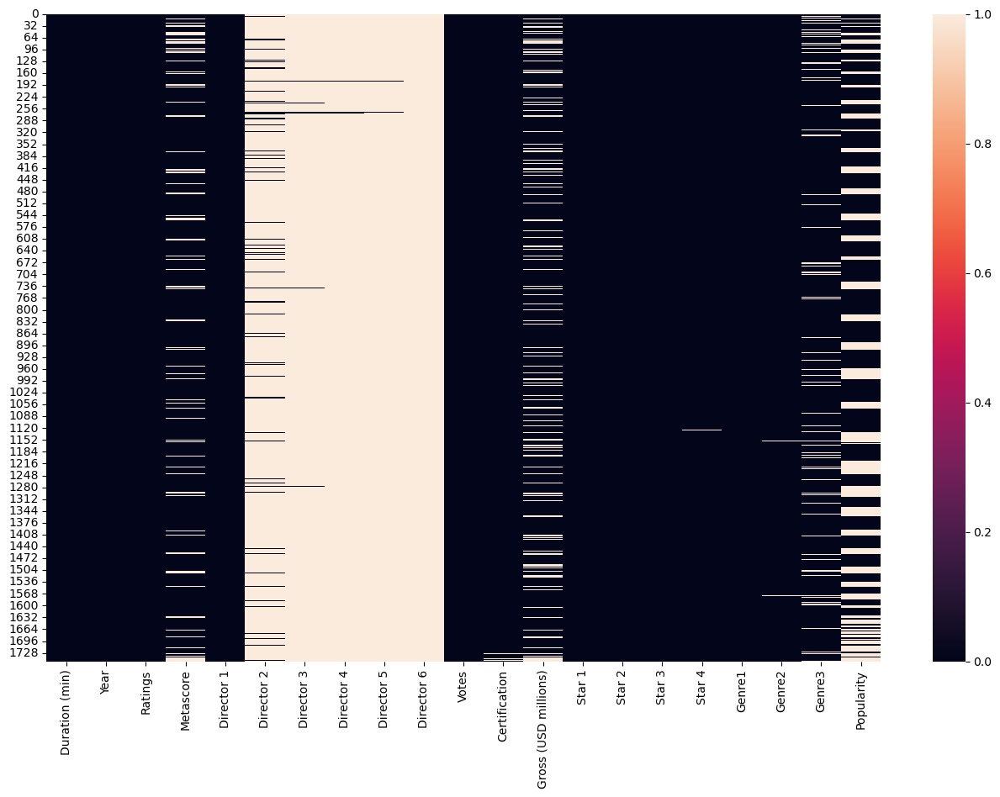

In [18]:
# Heatmap plot with null values
sns.set_palette('coolwarm_r')
plt.figure(figsize = (16,10))
sns.heatmap(df.isnull())
plt.show()

In [19]:
#Finding the percentage of data missing from the dataset
pd.set_option('display.max_rows',None) 
missing_values = df.isnull().sum()
percentage_missing_values =round((missing_values/len(df))*100,1)
dtyp=df.dtypes
null_values=pd.concat([dtyp,missing_values, percentage_missing_values], axis =1, keys =['Data Type','Missing Values', '% Missing data'])
print("Missing Values")
df_null=null_values.sort_values(by=["% Missing data"],ascending=False)
df_null=df_null.reset_index(drop=False)
df_null

Missing Values


,index,Data Type,Missing Values,% Missing data
0,Director 6,object,1750,99.9
1,Director 5,object,1748,99.8
2,Director 4,object,1745,99.7
3,Director 3,object,1738,99.3
4,Director 2,object,1638,93.5
5,Popularity,float64,567,32.4
6,Gross (USD millions),float64,280,16.0
7,Metascore,float64,184,10.5
8,Genre3,object,144,8.2
9,Certification,object,10,0.6


## <u>Observations and Imputation Strategy:<u>

- **<u>"Director 2 to Director 6":<u>** **There are many missing values in the columns "Director 2 to Director 6" with missing values percentage is more than 90%. However, I will not drop these columns as the "Director" plays a key role in the filmmaking process and plays a vital role in shaping the overall vision of the project. Instead of removing these columns, I will replace the null values with "Others" in these director columns. I am not using "mode" imputation here as I am assuming that the missing director names can be different and not similar to the most frequent name. Replacing missing values with "Others" will help me to consider the importance of known Directors in these columns on overall "Gross-Collection" and "Votes" prediction. I will also do feature engineering by creating other columns with "No. of Directors" which will help me to consider the importance of no. of directors on movie success**


- **<u>"Gross (USD millions)":<u>** **There is 16% missing data for Gross Collection. This is target variable for regression model predicting "Gross Collection". Imputing missing values in the target variable is a challenging problem as it directly affects the modeling of the problem. In most cases, imputing the target variable is not recommended as it can introduce bias and reduce the accuracy of the model. It is not recommended to perform the imputation on target variable with this significant missing data (16%). Hence, I will drop these 16% rows for the regression model where "Gross (USD millions)" is a target variable however I will not drop any rows in "Gross (USD millions)" for another regression model where the target variable is "Votes" as "Votes" columns don't have any missing values, hence overall I will create two data frames 1. By deleting rows with missing data in "Gross (USD millions)" and use this data frame for building regression model to predict "Gross Collection" 2. By imputing the missing data in "Gross (USD millions)" and use this data frame for building regression model to predict "Votes"**


- **<u>"Popularity" & "Metascore":<u>** **There is 32.4% missing data for "Popularity" and 10.5% missing data for "Metascore". As there is significant missing data in these columns, I will impute them however I don't want to consider only "simple imputer" to get the imputed dataset. Instead, I will apply various imputation techniques (1. Simple Imputer 2. KNN Imputer 3. Multiple Iterative Imputer (MICE)) to impute the data for these columns.**	


- **<u>"Genre2" & "Genre3":<u>** **There is 0.1% missing data for "Genre2" and 8.2% missing data for "Genre3". I will use "Others" to replace missing values for these two columns. I am not using "mode" imputation here as I am assuming that the missing "Genre" categories can be different and not similar to the most frequent category. Replacing missing values with "Others" will help me to consider the importance of known "Genre" categories in these columns on overall "Gross-Collection" and "Votes" prediction. I will also do feature engineering by creating other columns with "No. of Genres" which will help me to consider the importance of no. of Genres considered on movie success**


- **<u>"Star2", "Star3" & "Star4":<u>** **There is 0.1% missing data for "Star2", "Star3" & "Star4". I will use "Others" to replace missing values for these three columns. I am not using "mode" imputation here as I am assuming that the missing "Star" names can be different and not similar to the most frequent name. Replacing missing values with "Others" will help me to consider the importance of known "Star" names in these columns on overall "Gross-Collection" and "Votes" prediction. I will also do feature engineering by creating other columns with "No. of Stars" which will help me to consider the importance of no. of Stars on movie success**


- **<u>"Certification":<u>** **There is 0.6% of missing data for "Certification". I will use "mode" imputation here as the missing values are expected to have a strong tendency to occur with a particular value of different Certification categories (16+,A.,Approved,Certification,G,M,M/PG,Not Rated,Passed,PG,PG-13,R,TV-14,TV-MA,TV-PG,U,UA). Here I am assuming that the missing values are likely to have the same value as the mode**

<span style="color:blue; font-weight:bold; font-size:26px;">Feature Engineering</span>

In [20]:
# Creating new column "No. of Directors" from all the "Director" columns
df['No. of Directors'] = df.apply(lambda col: sum(0 if pd.isnull(row) else 1 for row in col[4:10]), axis=1)

# Creating new column "No. of Stars" from all the "Star" columns
df['No. of Stars'] = df.apply(lambda col: sum(0 if pd.isnull(row) else 1 for row in col[13:17]), axis=1)

# Creating new column "No. of Genres" from all the "Genre" columns
df['No. of Genres'] = df.apply(lambda col: sum(0 if pd.isnull(row) else 1 for row in col[17:20]), axis=1)

df.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
0,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,NaN,NaN,NaN,38365,PG,NaN,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0,3,4,3
1,152,2008,9.0,84.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0,1,4,3
2,201,2003,9.0,94.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0,1,4,3
3,148,2010,8.8,74.0,Christopher Nolan,NaN,NaN,NaN,NaN,NaN,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0,1,4,3
4,178,2001,8.8,92.0,Peter Jackson,NaN,NaN,NaN,NaN,NaN,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0,1,4,3


In [21]:
df["No. of Directors"].max()

6

In [22]:
df["No. of Directors"].min()

1

In [23]:
df["No. of Stars"].max()

4

In [24]:
df["No. of Stars"].min()

1

In [25]:
df["No. of Genres"].max()

3

In [26]:
df["No. of Genres"].min()

1

<span style="color:blue; font-weight:bold; font-size:26px;">Imputation of columns with "Object" datatype</span>

### "Director 1 to Director 6" columns - Replace missing values with "Others"

In [27]:
# Checking whether the missing values are there in "Director" columns or not
df[['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6']].isnull().any() 

Director 1    False
Director 2     True
Director 3     True
Director 4     True
Director 5     True
Director 6     True
dtype: bool

In [28]:
# Replace missing values in columns ("Director 2 to Director 6") with "Others"
df[['Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6']] = \
df[['Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6']].fillna('Others')

### "Star 1 to Star 4" columns - Replace missing values with "Others"

In [29]:
# Checking whether the missing values are there in "Star" columns or not
df[['Star 1', 'Star 2', 'Star 3', 'Star 4']].isnull().any() 

Star 1    False
Star 2     True
Star 3     True
Star 4     True
dtype: bool

In [30]:
# Replace missing values in columns ("Star 2 to Star 4") with "Others"
df[['Star 2', 'Star 3', 'Star 4']] = df[['Star 2', 'Star 3', 'Star 4']].fillna('Others')

### "Genre 1 to Genre 3" columns - Replace missing values with "Others"

In [31]:
# Checking whether the missing values are there in "Genre" columns or not
df[['Genre1', 'Genre2', 'Genre3']].isnull().any() 

Genre1    False
Genre2     True
Genre3     True
dtype: bool

In [32]:
# Replace missing values in columns ("Genre2 to Genre3") with "Others"
df[['Genre2', 'Genre3']] = df[['Genre2', 'Genre3']].fillna('Others')

### "Certification" Imputation using "mode"

In [33]:
# Checking whether the missing values are there in "Certification" column or not
df[['Certification']].isnull().any() 

Certification    True
dtype: bool

In [34]:
# Imputing using "mode" for "Certification" column
df['Certification']=df['Certification'].fillna(df['Certification'].mode()[0]) 

<span style="color:blue; font-weight:bold; font-size:26px;">Creating two dataframes for building two Regression models</span>

## (for predicting "Gross Collection" and "Votes")

- **Gross (USD millions): There is 16% missing data for Gross Collection. This is target variable for regression model predicting "Gross Collection". Imputing missing values in the target variable is a challenging problem as it directly affects the modeling of the problem. In most cases, imputing the target variable is not recommended as it can introduce bias and reduce the accuracy of the model. It is not recommended to perform the imputation on target variable with this significant missing data (16%). Hence, I will drop these 16% rows for the regression model where "Gross (USD millions)" is a target variable however I will not drop any rows in "Gross (USD millions)" for another regression model where the target variable is "Votes" as "Votes" columns don't have any missing values, hence overall I will create two data frames 1. By deleting rows with missing data in "Gross (USD millions)" and use this data frame for building regression model to predict "Gross Collection" 2. By imputing the missing data in "Gross (USD millions)" as X feature and use this data frame for building regression model to predict "Votes"**

### Dataframe for "Gross Collection" prediction

In [35]:
df.shape

(1751, 24)

In [36]:
# Remove rows with missing data in 'Gross (USD millions)' column
dfg_0 = df.dropna(subset=['Gross (USD millions)'])

In [37]:
dfg_0.shape

(1471, 24)

In [38]:
dfg_1=dfg_0.copy()

### Dataframe for "Votes" prediction

In [39]:
dfv_0=df.copy()  # Dataframe for Votes prediction

In [40]:
dfv_0.shape

(1751, 24)

In [41]:
dfv_1=dfv_0.copy()

<span style="color:blue; font-weight:bold; font-size:26px;">Imputation of columns with "Int" and "Float" datatypes</span>

### Notes before Imputating "Int" and "Float" data:

- **Here, I am trying 3 imputation techniques. I will choose the best one out of these 3 techniques (Simple Imputer, KNN Imputer, Multiple Iterative Imputer) by checking the score from each model**
- **I will encode categorical/object data into numerical data as KNN and MICE works with only numerical data**
- **Before imputation, I am splitting the data into train and test data. Then I am doing imputation on both train and test data. I am doing this splitting to make sure that the same set of train and test data goes into all three ML models after imputation.**
- **Comparison of model scores make more sense with splitting of the data before imputation and again I am using same algorithm on all 3 imputed datasets such that the comparison is right**
- **In this project, I need to develop two regression models with using two data frames. 1. Predicting "Gross Collection" by removing the rows corresponds to missing values of 'Gross (USD millions)' 2. Predicting "Votes" by having all the rows of 'Gross (USD millions)' including missing data. Hence I am going to perform all the above steps for both data frames as the target variables and size of the dataset are different.**

<span style="color:brown; font-weight:bold; font-size:22px;">Imputation of dataset features with "Gross (USD millions)" as target variable</span>

In [42]:
# Sorting the columns based on the datatype
dfg_0.columns.to_series().groupby(dfg_0.dtypes).groups

{int64: ['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres'], float64: ['Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity'], object: ['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', 'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']}

In [43]:
# Checking whether the missing values are there in "Int" and "Float" datatype columns or not
dfg_0[['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres','Ratings', 'Metascore', \
    'Gross (USD millions)','Popularity']].isnull().any() 

Duration (min)          False
Year                    False
Votes                   False
No. of Directors        False
No. of Stars            False
No. of Genres           False
Ratings                 False
Metascore                True
Gross (USD millions)    False
Popularity               True
dtype: bool

### Checking the distribution of "Metascore" and "Popularity"

In [44]:
print("Mean of Metascore:",df['Metascore'].mean())
print("Median of Metascore:",df['Metascore'].median())

Mean of Metascore: 53.36566687938736
Median of Metascore: 53.0


### Observations:

- **Mean closely matching with Median for "Metascore"**

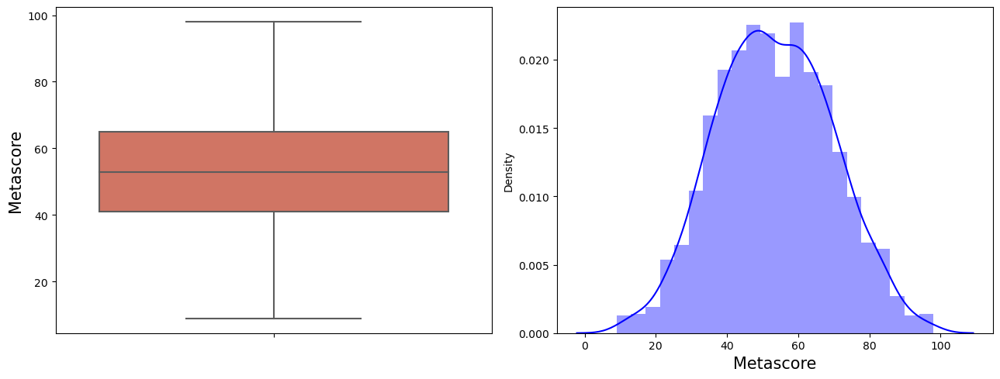

In [45]:
plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
sns.boxplot(y='Metascore', data=df)
plt.ylabel('Metascore',fontsize=15)
plt.subplot(1,2,2)
sns.distplot(df['Metascore'], color='b')
plt.xlabel('Metascore',fontsize=15)
plt.tight_layout()
plt.show()

### Observations:

- **we can see that the plot is close to normal distribution (slightly skewed)**
- **If the data is normally distributed with no outliers, using the mean to impute missing values is a reasonable approach.**
- **However, if the data is skewed or contains outliers, it is better to use the median to impute missing values**

In [46]:
print("Mean of Popularity:",df['Popularity'].mean())
print("Median of Popularity:",df['Popularity'].median())

Mean of Popularity: 2190.6199324324325
Median of Popularity: 2050.0


#### Observations:

- **As Mean > Median for "Popularity", the data is right skewed**

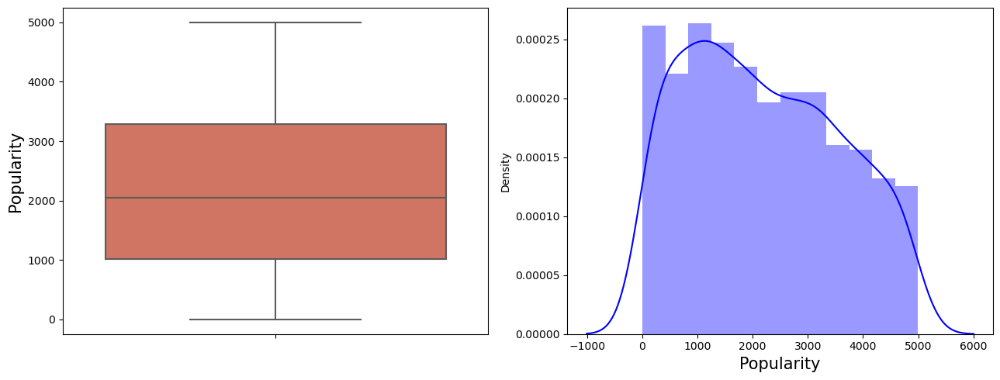

In [47]:
plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
sns.boxplot(y='Popularity', data=df)
plt.ylabel('Popularity',fontsize=15)
plt.subplot(1,2,2)
sns.distplot(df['Popularity'], color='b')
plt.xlabel('Popularity',fontsize=15)
plt.tight_layout()
plt.show()

### Observations:

- **we can see that the plot is right skewed as mean is greater than median**
- **If the data is normally distributed with no outliers, using the mean to impute missing values is a reasonable approach.**
- **However, if the data is skewed or contains outliers, it is better to use the median to impute missing values**

### Encoding of Categorical Features

- **Encode categorical/object data into numerical data as KNN and MICE imputers works with only numerical data**

In [48]:
df_categorical=['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', \
                'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']

# Using Label Encoder on categorical variable/object data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder() # Initiate LabelEncoder

for i in df_categorical:
    dfg_1[i] = le.fit_transform(dfg_1[i])
    
dfg_1.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
1,152,2008,9.0,84.0,114,50,6,5,2,1,2719626,5,534.86,95,332,2,757,0,4,4,117.0,1,4,3
2,201,2003,9.0,94.0,553,50,6,5,2,1,1887925,5,377.85,157,916,401,856,0,1,4,407.0,1,4,3
3,148,2010,8.8,74.0,114,50,6,5,2,1,2414206,5,292.58,342,468,301,612,0,1,12,103.0,1,4,3
4,178,2001,8.8,92.0,553,50,6,5,2,1,1916545,5,315.54,157,349,809,1026,0,1,4,184.0,1,4,3
5,179,2002,8.8,87.0,553,50,6,5,2,1,1704008,5,342.55,157,349,1064,856,0,1,4,788.0,1,4,3


### Missing values Imputation - Simple Imputer

In [49]:
# Importing required libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import r2_score, accuracy_score

#############################################################################################################

# Simple Imputation for REGRESSION Task
reg_target=['Gross (USD millions)']

regression_imputed_data = {}  # Creating a dictionary to store the data for all 3 imputation techniques

# Split dataset into training and testing sets for regression task
train_reg, test_reg = train_test_split(dfg_1, test_size=0.2, random_state=42, stratify=None, shuffle=True)
train_reg_X = train_reg.drop(columns=['Gross (USD millions)'])
train_reg_y = train_reg['Gross (USD millions)']
test_reg_X = test_reg.drop(columns=['Gross (USD millions)'])
test_reg_y = test_reg['Gross (USD millions)']

# create list for numerical columns where the imputation is needed
median_cols = ['Metascore', 'Popularity']

# apply simple imputer with median strategy to median_cols for both train and test data
median_imputer = SimpleImputer(strategy='median')
train_reg_X[median_cols] = median_imputer.fit_transform(train_reg_X[median_cols])
test_reg_X[median_cols] = median_imputer.transform(test_reg_X[median_cols])

train_reg_X_imputed=train_reg_X
test_reg_X_imputed=test_reg_X

# Store imputed data in a single dataframe
train_test_reg_X_imputed = np.concatenate((train_reg_X_imputed, test_reg_X_imputed), axis=0)
train_test_reg_y_imputed = np.concatenate((train_reg_y, test_reg_y), axis=0)
regression_imputed_data["Simple Imputer"] = pd.DataFrame(np.concatenate((train_test_reg_X_imputed, train_test_reg_y_imputed.reshape(-1,1)), axis=1),
                                                  columns=train_reg_X_imputed.columns.tolist() + reg_target)

# Train regression model on imputed training data and evaluate on imputed testing data
regressor = RandomForestRegressor(random_state=42)
regressor.fit(train_reg_X_imputed, train_reg_y)
r2_sir = r2_score(regressor.predict(test_reg_X_imputed), test_reg_y)
cv_scores_sir = cross_val_score(regressor, train_reg_X_imputed, train_reg_y, cv=5, scoring='r2')
print("Simple Imputer", 'Regression Test R2 score:', round(r2_sir,2),",", 'CV R2 score:', round(np.mean(cv_scores_sir),2))

Simple Imputer Regression Test R2 score: 0.55 , CV R2 score: 0.65


### Missing values Imputation - KNN and Multi Iterative Imputer

In [50]:
# Define imputation techniques 
imputation_techniques = [
    ('KNN Imputer', KNNImputer(n_neighbors=5)),
    ('Multiple Iterative Imputer', IterativeImputer(estimator=RandomForestRegressor(n_estimators=10, random_state=42), max_iter=10))
]  # Used Random Forest Regressor for Multiple Iterative Imputer

print("Simple Imputer", 'Regression Test R2 score:', round(r2_sir,2),",", 'CV R2 score:', round(np.mean(cv_scores_sir),2))

# Impute both train and test data for REGRESSION task

for name, imputer in imputation_techniques:
    # Apply imputation technique to training and testing data
    imputer.fit(train_reg_X)
    train_reg_X_imputed = imputer.transform(train_reg_X)
    test_reg_X_imputed = imputer.transform(test_reg_X)

    # Store imputed data in a single dataframe
    train_test_reg_X_imputed = np.concatenate((train_reg_X_imputed, test_reg_X_imputed), axis=0)
    train_test_reg_y_imputed = np.concatenate((train_reg_y, test_reg_y), axis=0)
    regression_imputed_data[name] = pd.DataFrame(np.concatenate((train_test_reg_X_imputed, train_test_reg_y_imputed.reshape(-1,1)), axis=1),
                                                  columns=train_reg_X.columns.tolist() + reg_target)

    # Train regression model on imputed training data and evaluate on imputed testing data
    regressor = RandomForestRegressor(random_state=42)
    regressor.fit(train_reg_X_imputed, train_reg_y)
    r2 = r2_score(regressor.predict(test_reg_X_imputed), test_reg_y)
    cv_scores = cross_val_score(regressor, train_reg_X_imputed, train_reg_y, cv=5, scoring='r2')
    print(name, 'Regression Test R2 score:', round(r2,2),",", 'CV R2 score:', round(np.mean(cv_scores),2))

Simple Imputer Regression Test R2 score: 0.55 , CV R2 score: 0.65
KNN Imputer Regression Test R2 score: 0.55 , CV R2 score: 0.65
Multiple Iterative Imputer Regression Test R2 score: 0.55 , CV R2 score: 0.65


### Observations of Imputation:

- **Simple Imputer Regression Test R2 score: 0.55, CV R2 score: 0.65**
- **KNN Imputer Regression Test R2 score: 0.55, CV R2 score: 0.65**
- **Multiple Iterative Imputer Regression Test R2 score: 0.55, CV R2 score: 0.65**
- **-----------------------------------------------------------------------------------------------------------------------**
- **All the imputation techniques gave same R2 score and CV scores. Hence, I have chosen Imputed dataset from Simple Imputer for further processing**

In [51]:
# As I have decided to use simple imputer, copying the imputed dataset into dfg_2 for further processing
dfg_2=regression_imputed_data["Simple Imputer"].copy()
dfg_2.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres,Gross (USD millions)
0,126.0,2014.0,6.1,35.0,532.0,50.0,6.0,5.0,2.0,1.0,187818.0,5.0,526.0,392.0,485.0,64.0,0.0,1.0,14.0,2300.0,1.0,4.0,3.0,39.32
1,128.0,2016.0,7.3,51.0,243.0,50.0,6.0,5.0,2.0,1.0,305541.0,7.0,38.0,53.0,415.0,547.0,0.0,13.0,17.0,370.0,1.0,4.0,2.0,86.26
2,104.0,2008.0,6.0,51.0,524.0,50.0,6.0,5.0,2.0,1.0,171553.0,5.0,242.0,776.0,781.0,347.0,0.0,1.0,14.0,4481.0,1.0,4.0,3.0,31.72
3,104.0,2003.0,6.6,59.0,548.0,50.0,6.0,5.0,2.0,1.0,110187.0,5.0,145.0,833.0,184.0,980.0,0.0,1.0,2.0,1912.0,1.0,4.0,3.0,47.73
4,90.0,2011.0,4.0,22.0,162.0,50.0,6.0,5.0,2.0,1.0,26627.0,5.0,488.0,236.0,166.0,598.0,0.0,1.0,8.0,1977.0,1.0,4.0,3.0,18.87


In [52]:
dfg_2.isnull().sum().sum() # Checking the sum of null values for all columns

0

- **Before imputing the dataset with multiple imputation techniques, data is splitted into train and test and then completed the imputation on both train and test data. This splitting has been done to make sure that the same set of train and test data goes into all three ML models after the imputation for checking the accuracy of the models (Simple Imputer, KNN Imputer, MICE Imputer). However, due to this splitting into train and test data, the rows are reshuffled. For EDA plotting, I need to remap categorical names to encoded numbers. As I have decided to use "Simple Imputation" data, I have done the simple imputation again on the original numerical data before splitting, so that I can avoid remapping of categorical names to encoded numbers. This is just done for EDA plotting purpose in the below step.**

In [53]:
# Using Simple Imputer by filling null values of numerical columns with 'median' 
df_numerical=['Metascore', 'Popularity']
for i in df_numerical:
    
        dfg_0[i]=dfg_0[i].fillna(dfg_0[i].median())

print(dfg_0.isnull().sum().sum())

0


In [54]:
dfg_0.shape

(1471, 24)

In [55]:
dfg_0.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
1,152,2008,9.0,84.0,Christopher Nolan,Others,Others,Others,Others,Others,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0,1,4,3
2,201,2003,9.0,94.0,Peter Jackson,Others,Others,Others,Others,Others,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0,1,4,3
3,148,2010,8.8,74.0,Christopher Nolan,Others,Others,Others,Others,Others,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0,1,4,3
4,178,2001,8.8,92.0,Peter Jackson,Others,Others,Others,Others,Others,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0,1,4,3
5,179,2002,8.8,87.0,Peter Jackson,Others,Others,Others,Others,Others,1704008,PG-13,342.55,Elijah Wood,Ian McKellen,Viggo Mortensen,Orlando Bloom,Action,Adventure,Drama,788.0,1,4,3


## ** Imputation is completed for the dataframe with "Gross Collection" as target variable **

<span style="color:brown; font-weight:bold; font-size:22px;">Imputation of dataset with "Votes" as target variable</span>

In [56]:
# Checking whether the missing values are there in "Int" and "Float" datatype columns or not
dfv_0[['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres','Ratings', 'Metascore', \
    'Gross (USD millions)','Popularity']].isnull().any() 

Duration (min)          False
Year                    False
Votes                   False
No. of Directors        False
No. of Stars            False
No. of Genres           False
Ratings                 False
Metascore                True
Gross (USD millions)     True
Popularity               True
dtype: bool

### Checking the distribution of "Gross Collection"

In [57]:
print("Mean of Gross (USD millions):",df['Gross (USD millions)'].mean())
print("Median of Gross (USD millions):",df['Gross (USD millions)'].median())

Mean of Gross (USD millions): 77.15802175390901
Median of Gross (USD millions): 43.06


- **As Mean > Median for "Gross Collection", the data is right skewed**

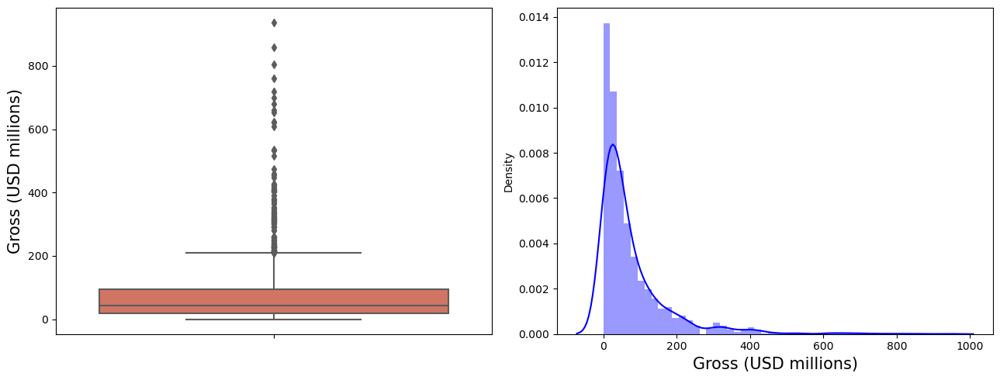

In [58]:
plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
sns.boxplot(y='Gross (USD millions)', data=df)
plt.ylabel('Gross (USD millions)',fontsize=15)
plt.subplot(1,2,2)
sns.distplot(df['Gross (USD millions)'], color='b')
plt.xlabel('Gross (USD millions)',fontsize=15)
plt.tight_layout()
plt.show()

### Observations:

- **we can see that the plot is right skewed as mean is greater than median**
- **If the data is normally distributed with no outliers, using the mean to impute missing values is a reasonable approach.**
- **However, if the data is skewed or contains outliers, it is better to use the median to impute missing values**

### Encoding of Categorical Features

- **Encode categorical/object data into numerical data as KNN and MICE imputers works with only numerical data**

In [59]:
df_categorical=['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', \
                'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']

# Using Label Encoder on categorical variable
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder() # Initiate LabelEncoder

for i in df_categorical:
    dfv_1[i] = le.fit_transform(dfv_1[i])
    
dfv_1.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
0,140,2023,9.1,86.0,400,48,6,5,2,1,38365,7,NaN,609,399,942,826,1,0,0,23.0,3,4,3
1,152,2008,9.0,84.0,146,59,8,5,2,1,2719626,8,534.86,119,410,2,900,0,4,4,117.0,1,4,3
2,201,2003,9.0,94.0,671,59,8,5,2,1,1887925,8,377.85,184,1102,465,1018,0,1,4,407.0,1,4,3
3,148,2010,8.8,74.0,146,59,8,5,2,1,2414206,8,292.58,409,564,353,722,0,1,13,103.0,1,4,3
4,178,2001,8.8,92.0,671,59,8,5,2,1,1916545,8,315.54,184,428,941,1227,0,1,4,184.0,1,4,3


### Missing values Imputation - Simple Imputer

In [60]:
# Importing required libraries

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import r2_score, accuracy_score

#############################################################################################################

# Simple Imputation for REGRESSION Task
reg_target=['Votes']

regression_imputed_data = {}  # Creating a dictionary to store the data for all 3 imputation techniques

# Split dataset into training and testing sets for regression task
train_reg, test_reg = train_test_split(dfv_1, test_size=0.2, random_state=42, stratify=None, shuffle=True)
train_reg_X = train_reg.drop(columns=['Votes'])
train_reg_y = train_reg['Votes']
test_reg_X = test_reg.drop(columns=['Votes'])
test_reg_y = test_reg['Votes']

# create list for numerical columns where the imputation is needed
median_cols = ['Metascore', 'Popularity', 'Gross (USD millions)']

# apply simple imputer with median strategy to median_cols for both train and test data
median_imputer = SimpleImputer(strategy='median')
train_reg_X[median_cols] = median_imputer.fit_transform(train_reg_X[median_cols])
test_reg_X[median_cols] = median_imputer.transform(test_reg_X[median_cols])

train_reg_X_imputed=train_reg_X
test_reg_X_imputed=test_reg_X

# Store imputed data in a single dataframe
train_test_reg_X_imputed = np.concatenate((train_reg_X_imputed, test_reg_X_imputed), axis=0)
train_test_reg_y_imputed = np.concatenate((train_reg_y, test_reg_y), axis=0)
regression_imputed_data["Simple Imputer"] = pd.DataFrame(np.concatenate((train_test_reg_X_imputed, train_test_reg_y_imputed.reshape(-1,1)), axis=1),
                                                  columns=train_reg_X_imputed.columns.tolist() + reg_target)

# Train regression model on imputed training data and evaluate on imputed testing data
regressor = RandomForestRegressor(random_state=42)
regressor.fit(train_reg_X_imputed, train_reg_y)
r2_sir = r2_score(regressor.predict(test_reg_X_imputed), test_reg_y)
cv_scores_sir = cross_val_score(regressor, train_reg_X_imputed, train_reg_y, cv=5, scoring='r2')
print("Simple Imputer", 'Regression Test R2 score:', round(r2_sir,2),",", 'CV R2 score:', round(np.mean(cv_scores_sir),2))

Simple Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8


### Missing values Imputation - KNN and Multi Iterative Imputer

In [61]:
# Define imputation techniques 
imputation_techniques = [
    ('KNN Imputer', KNNImputer(n_neighbors=5)),
    ('Multiple Iterative Imputer', IterativeImputer(estimator=RandomForestRegressor(n_estimators=10, random_state=42), max_iter=10))
]  # Used Random Forest Regressor for Multiple Iterative Imputer

print("Simple Imputer", 'Regression Test R2 score:', round(r2_sir,2),",", 'CV R2 score:', round(np.mean(cv_scores_sir),2))
# Impute both train and test data for REGRESSION task

for name, imputer in imputation_techniques:
    # Apply imputation technique to training and testing data
    imputer.fit(train_reg_X)
    train_reg_X_imputed = imputer.transform(train_reg_X)
    test_reg_X_imputed = imputer.transform(test_reg_X)

    # Store imputed data in a single dataframe
    train_test_reg_X_imputed = np.concatenate((train_reg_X_imputed, test_reg_X_imputed), axis=0)
    train_test_reg_y_imputed = np.concatenate((train_reg_y, test_reg_y), axis=0)
    regression_imputed_data[name] = pd.DataFrame(np.concatenate((train_test_reg_X_imputed, train_test_reg_y_imputed.reshape(-1,1)), axis=1),
                                                  columns=train_reg_X.columns.tolist() + reg_target)

    # Train regression model on imputed training data and evaluate on imputed testing data
    regressor = RandomForestRegressor(random_state=42)
    regressor.fit(train_reg_X_imputed, train_reg_y)
    r2 = r2_score(regressor.predict(test_reg_X_imputed), test_reg_y)
    cv_scores = cross_val_score(regressor, train_reg_X_imputed, train_reg_y, cv=5, scoring='r2')
    print(name, 'Regression Test R2 score:', round(r2,2),",", 'CV R2 score:', round(np.mean(cv_scores),2))

Simple Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8
KNN Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8
Multiple Iterative Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8


### Observations of Imputation:

- **Simple Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8**
- **KNN Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8**
- **Multiple Iterative Imputer Regression Test R2 score: 0.78 , CV R2 score: 0.8**
- **-----------------------------------------------------------------------------------------------------------------------**
- **All the imputation techniques gave same R2 score and CV scores. Hence I have chosen Imputed dataset from Simple Imputer for further processing** 

In [62]:
# As I have decided to use simple imputer, copying the imputed dataset into dfv_2 for further processing
dfv_2=regression_imputed_data["Simple Imputer"].copy()
dfv_2.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres,Votes
0,138.0,2018.0,7.7,53.0,574.0,59.0,8.0,5.0,2.0,1.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,0.0,5.0,15.0,2026.0,1.0,4.0,3.0,32297.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,8.0,5.0,2.0,1.0,11.0,43.775,250.0,639.0,760.0,412.0,0.0,1.0,4.0,2320.0,1.0,4.0,3.0,44661.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,8.0,5.0,2.0,1.0,10.0,67.640,125.0,1022.0,953.0,130.0,0.0,4.0,15.0,3521.0,1.0,4.0,3.0,46842.0
3,111.0,1998.0,6.1,37.0,326.0,59.0,8.0,5.0,2.0,1.0,10.0,32.940,87.0,788.0,29.0,195.0,0.0,4.0,4.0,2026.0,1.0,4.0,3.0,76092.0
4,95.0,2012.0,5.4,51.0,696.0,59.0,8.0,5.0,2.0,1.0,10.0,15.630,570.0,223.0,746.0,1082.0,0.0,15.0,18.0,2026.0,1.0,4.0,1.0,63535.0


In [63]:
dfv_2.isnull().sum().sum() # Checking the sum of null values for all columns

0

- **Before imputing the dataset with multiple imputation techniques, data is splitted into train and test and then completed the imputation on both train and test data. This splitting has been done to make sure that the same set of train and test data goes into all three ML models after the imputation for checking the accuracy of the models (Simple Imputer, KNN Imputer, MICE Imputer). However, due to this splitting into train and test data, the rows are reshuffled. For EDA plotting, I need to remap categorical names to encoded numbers. As I have decided to use "Simple Imputation" data, I have done the simple imputation again on the original numerical data before splitting, so that I can avoid remapping of categorical names to encoded numbers. This is just done for EDA plotting purpose in the below step.**

In [64]:
# Using Simple Imputer by filling null values of numerical columns with 'median' 
df_numerical=['Metascore', 'Popularity', 'Gross (USD millions)']
for i in df_numerical:
    
        dfv_0[i]=dfv_0[i].fillna(dfv_0[i].median())

print(dfv_0.isnull().sum().sum())

0


In [65]:
dfv_0.shape

(1751, 24)

In [66]:
dfv_0.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
0,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,Others,Others,Others,38365,PG,43.06,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0,3,4,3
1,152,2008,9.0,84.0,Christopher Nolan,Others,Others,Others,Others,Others,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0,1,4,3
2,201,2003,9.0,94.0,Peter Jackson,Others,Others,Others,Others,Others,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0,1,4,3
3,148,2010,8.8,74.0,Christopher Nolan,Others,Others,Others,Others,Others,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0,1,4,3
4,178,2001,8.8,92.0,Peter Jackson,Others,Others,Others,Others,Others,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0,1,4,3


## ** Imputation is completed for the dataframe with "Votes" as target variable **

# Segregating columns based on data type for better EDA

In [67]:
# Sorting the columns based on the datatype
dfv_0.columns.to_series().groupby(dfv_0.dtypes).groups

{int64: ['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres'], float64: ['Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity'], object: ['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', 'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']}

In [68]:
df_numerical=['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres','Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity']
df_categorical=['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6', 'Certification', 'Star 1', 'Star 2', 'Star 3', 'Star 4', 'Genre1', 'Genre2', 'Genre3']

In [69]:
df_numerical=dfv_0[df_numerical]
df_categorical=dfv_0[df_categorical]

# Statistical Summary:
(for the dataframe with "Votes" as target variable)

In [70]:
# Statistical summary for numerical data
pd.set_option('display.max_rows', None)
df_numerical.describe().T

,count,mean,std,min,25%,50%,75%,max
Duration (min),1751.0,115.311251,21.733232,45.0,100.00,111.00,126.50,321.00
Year,1751.0,2006.097658,13.253707,1924.0,2000.00,2009.00,2016.00,2023.00
Votes,1751.0,180728.316962,236436.912064,25027.0,47268.50,96118.00,211624.00,2719626.00
No. of Directors,1751.0,1.077670,0.339274,1.0,1.00,1.00,1.00,6.00
No. of Stars,1751.0,3.997716,0.075558,1.0,4.00,4.00,4.00,4.00
No. of Genres,1751.0,2.916619,0.280638,1.0,3.00,3.00,3.00,3.00
Ratings,1751.0,6.480925,0.996412,1.2,5.90,6.50,7.10,9.10
Metascore,1751.0,53.327242,15.366671,9.0,43.00,53.00,64.00,98.00
Gross (USD millions),1751.0,71.705454,95.216216,0.0,22.15,43.06,79.06,936.66
Popularity,1751.0,2145.085094,1138.711001,2.0,1473.50,2050.00,2708.00,4997.00


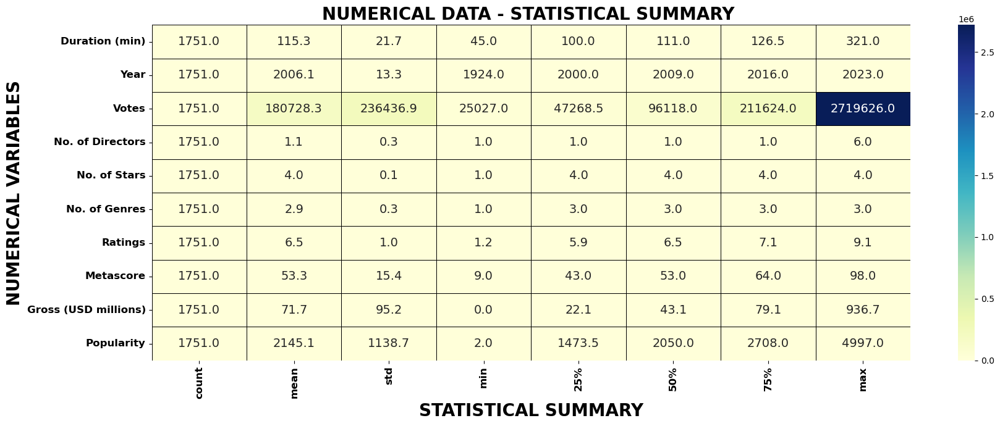

In [71]:
# Visualizing the Statistical summary for numerical data using heatmap.
plt.figure(figsize=(18,7))
sns.heatmap(df_numerical.describe().T,linewidths = 0.5,linecolor='black',fmt='0.1f',annot = True,cmap="YlGnBu",annot_kws={"size": 14})
plt.title("NUMERICAL DATA - STATISTICAL SUMMARY ",fontsize=20, fontweight='bold')
plt.xlabel("STATISTICAL SUMMARY", fontsize=20,fontweight='bold')
plt.ylabel("NUMERICAL VARIABLES", fontsize=20,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **Count: Same for all columns. Hence no null values are present**
- **Some columns are left skewed (Mean < Median) and some columns are right skewed (Mean > Median)**
- **Large differences between 75 percentile and max for columns Duration (min), Gross (USD millions), Popularity; this indicates the presence of outliers**
- **Large differences between 25 percentile and min for columns Duration (min), Votes, Popularity; this indicates the presence of outliers**
- **Standard deviation is high for columns Votes, Gross (USD millions), Popularity; hence data spread is high**

In [72]:
# Statistical summary for object data type
df_categorical.describe(include='O').T

,count,unique,top,freq
Director 1,1751,929,Michael Bay,15
Director 2,1751,90,Others,1638
Director 3,1751,14,Others,1738
Director 4,1751,7,Others,1745
Director 5,1751,4,Others,1748
Director 6,1751,2,Others,1750
Certification,1751,16,R,714
Star 1,1751,723,Sylvester Stallone,26
Star 2,1751,1163,Samuel L. Jackson,14
Star 3,1751,1328,Willem Dafoe,7


<span style="color:blue; font-weight:bold; font-size:30px;">Visualization of data</span>

In [73]:
dfv_0.head()

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres
0,140,2023,9.1,86.0,Joaquim Dos Santos,Kemp Powers,Justin K. Thompson,Others,Others,Others,38365,PG,43.06,Shameik Moore,Hailee Steinfeld,Oscar Isaac,Luna Lauren Velez,Animation,Action,Adventure,23.0,3,4,3
1,152,2008,9.0,84.0,Christopher Nolan,Others,Others,Others,Others,Others,2719626,PG-13,534.86,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,Action,Crime,Drama,117.0,1,4,3
2,201,2003,9.0,94.0,Peter Jackson,Others,Others,Others,Others,Others,1887925,PG-13,377.85,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,Action,Adventure,Drama,407.0,1,4,3
3,148,2010,8.8,74.0,Christopher Nolan,Others,Others,Others,Others,Others,2414206,PG-13,292.58,Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot Page,Ken Watanabe,Action,Adventure,Sci-Fi,103.0,1,4,3
4,178,2001,8.8,92.0,Peter Jackson,Others,Others,Others,Others,Others,1916545,PG-13,315.54,Elijah Wood,Ian McKellen,Orlando Bloom,Sean Bean,Action,Adventure,Drama,184.0,1,4,3


<span style="color:brown; font-weight:bold; font-size:24px;">Univariate Graphical Analysis for Categorical data</span>

In [74]:
df_categorical.shape

(1751, 14)

In [75]:
df_categorical=['Director 1','Director 2','Director 3','Director 4','Director 5','Director 6','Certification','Star 1','Star 2','Star 3','Star 4','Genre1','Genre2','Genre3']

### TOP 20 DIRECTORS WITH MAX NO. OF MOVIES IN "DIRECTOR 1" COLUMN

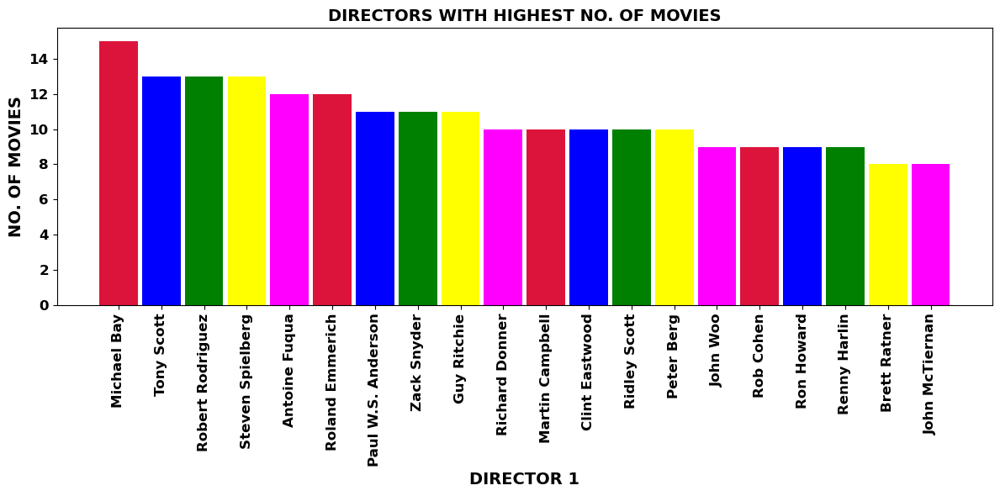

Observations for Directors in 'Director 1' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies directed by MICHAEL BAY
- The least number of movies directed by MAHESH BHATT
------------------------------------------------------------------------------------------------------------------------------


In [77]:
plot_data = dfv_0['Director 1'].value_counts()

#  top 20 directors based on their count in the 'Director 1' column
data = plot_data[:20]
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTORS WITH HIGHEST NO. OF MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR 1", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for Directors in 'Director 1' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies directed by "+ plot_data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least number of movies directed by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations
- **Plotted top 20 directors based on their count in "Director 1" column**
- **Michael Bay is the director who directed more films out of all IMDb rated movies, then followed by Tony Scott, Robert Rodriguez and Steven Spielberg based on "Director 1" column**

### TOP 20 DIRECTORS WITH MAX NO. OF MOVIES IN ALL DIRECTOR COLUMNS

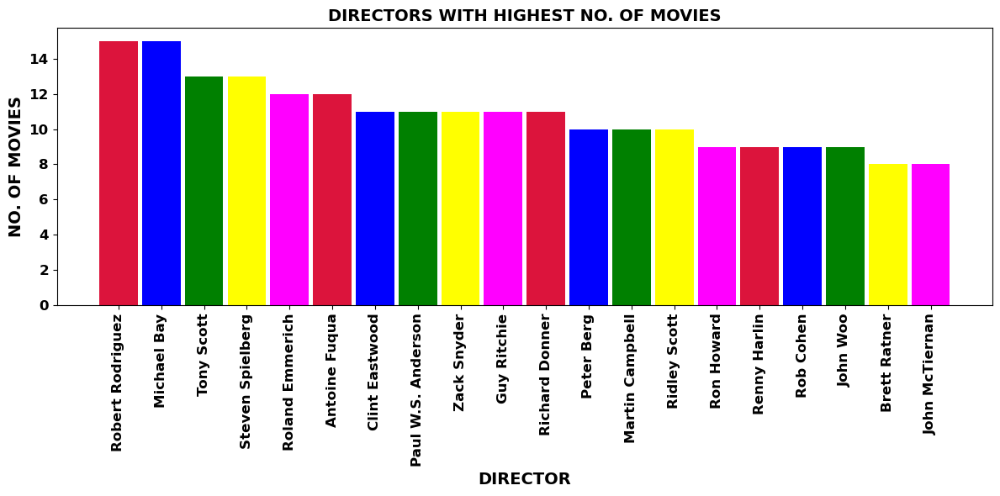

Observations for Directors in all 'Director' columns:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies directed by ROBERT RODRIGUEZ
- The least number of movies directed by BRUCE TIMM
------------------------------------------------------------------------------------------------------------------------------


In [78]:
directors_combined = pd.concat([df['Director 1'], df['Director 2'], df['Director 3'], df['Director 4'], df['Director 5'], df['Director 6']], ignore_index=True)

# Count the occurrences of each director
plot_data = directors_combined.value_counts()

# Get the top 20 directors
data = plot_data[plot_data.index != 'Others'].head(20)
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTORS WITH HIGHEST NO. OF MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for Directors in all 'Director' columns:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies directed by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least number of movies directed by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations

- **Combined all the director columns to check the top 20 directors who directed more movies rated in IMDb site**
- **Robert Rodriguez, Michael Bay, Tony Scott are the directors who directed more number of movies rated in IMDb site**

### TOP CERTIFICATIONS WITH HIGHEST NO. OF MOVIES

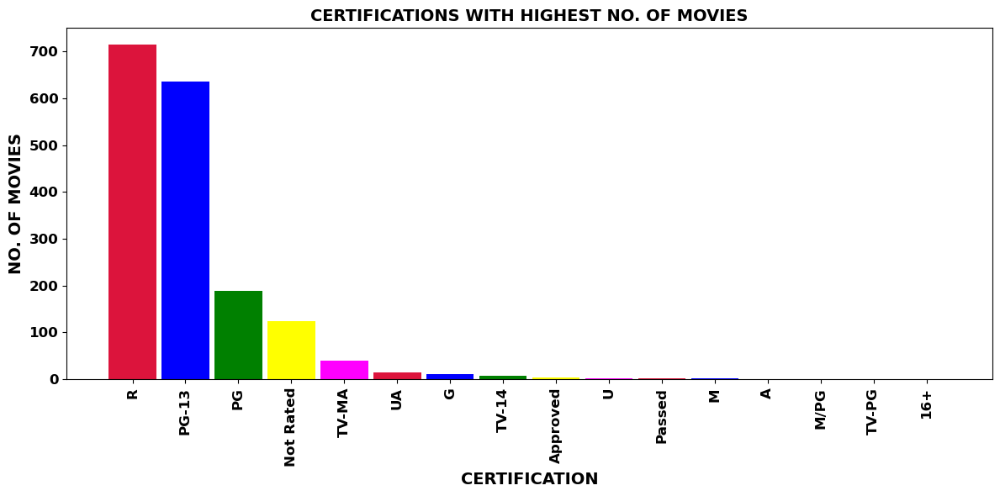

Observations for Certification's:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies certified with R
- The least number of movies certified with 16+
------------------------------------------------------------------------------------------------------------------------------


In [79]:
plot_data = dfv_0['Certification'].value_counts()
data= plot_data

plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("CERTIFICATIONS WITH HIGHEST NO. OF MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("CERTIFICATION", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for Certification's:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies certified with "+ plot_data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least number of movies certified with "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations:

- **The highest number of IMDb rated movies Certified with "R" certification and followed by "PG-13"**
- **The least number of IMDb rated movies Certified with "16+" certification**
- **This indicates that audience interest is more towards "R" and "PG-13" certified movies, hence directors are taking more of these catergory films that could generate more revenue for them**
- **Interesting obeservation is that there are very few films with 16+ certification; this indicates that the most of the audience are under 16 years of age eventhough highest number of movies certified with "R" and "PG-13"**

**Abbreviations**
- **R: Restricted (Under 17 requires accompanying parent or adult guardian)**
- **PG-13: Parents Strongly Cautioned (Some material may be inappropriate for children under 13)**
- **16+: Suitable for viewers aged 16 and above**

### TOP 20 STARS WITH MAX NO. OF MOVIES ACTED IN ALL START COLUMNS DATA

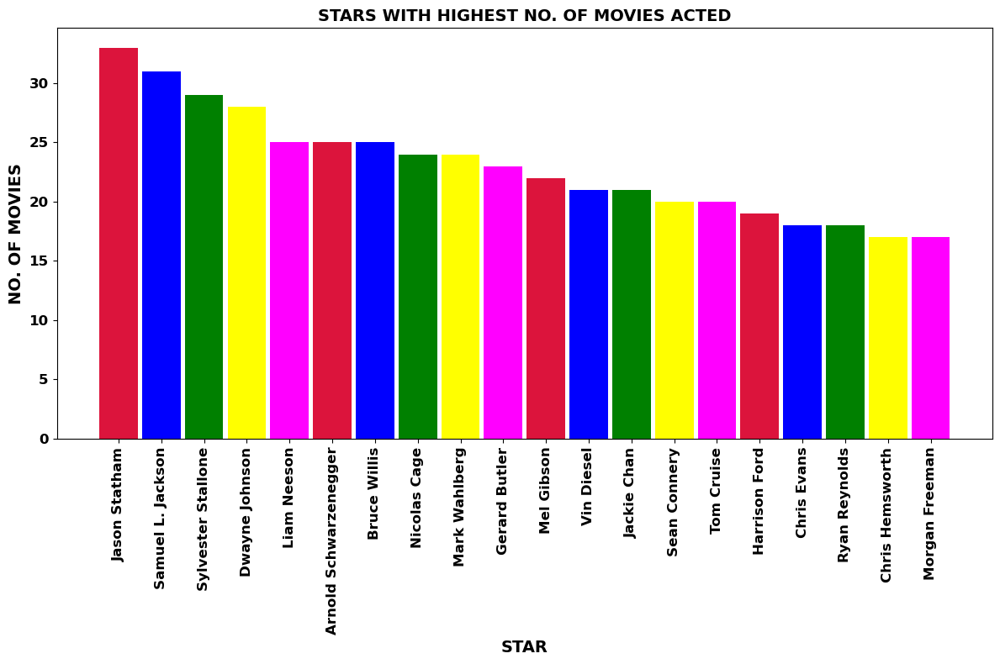

Observations for Stars in all 'Star' columns:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies acted by JASON STATHAM
- The least number of movies acted by ADITYA ROY KAPOOR
------------------------------------------------------------------------------------------------------------------------------


In [80]:
stars_combined = pd.concat([df['Star 1'], df['Star 2'], df['Star 3'], df['Star 4']], ignore_index=True)

# Count the occurrences of each Star
plot_data = stars_combined.value_counts()

# Get the top 20 stars
data = plot_data[plot_data.index != 'Others'].head(20)
plt.figure(figsize=(12,8))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST NO. OF MOVIES ACTED",fontsize=14, fontweight='bold')
plt.xlabel("STAR", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for Stars in all 'Star' columns:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies acted by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least number of movies acted by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations

- **Combined all the star columns to check the top 20 stars who acted in more movies that are rated in IMDb site**
- **Jason Statham, Samuel L.Jackson, Sylvester Stallone are the stars who acted in more number of movies that are rated in IMDb site**

### TOP 20 GENRES WITH MAX NO. OF MOVIES IN ALL GENRES COLUMNS DATA

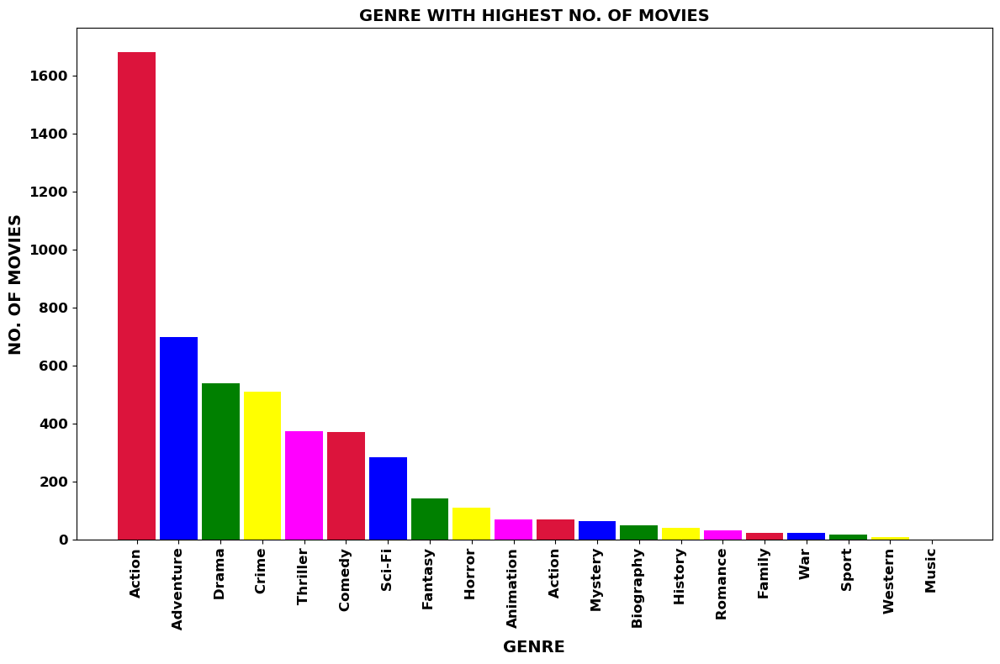

Observations for Genres in all 'Genre' columns:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies have Genre ACTION
- The least number of movies have Genre  MUSICAL
------------------------------------------------------------------------------------------------------------------------------


In [81]:
Genre_combined = pd.concat([df['Genre1'], df['Genre2'], df['Genre3']], ignore_index=True)

# Count the occurrences of each Genre
plot_data = Genre_combined.value_counts()

# Get the top 20 genres
data = plot_data[plot_data.index != 'Others'].head(20)
plt.figure(figsize=(12,8))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST NO. OF MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("GENRE", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for Genres in all 'Genre' columns:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies have Genre "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least number of movies have Genre "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations:

- **The highest number of IMDb rated movies have Genre "ACTION" followed by "Adventure" and "Drama" however the difference is huge that means that the audience are more interested in watching "Action" movies hence film makers are taking more "Action" movies that could generate more revenue for them**

- **The least number of IMDb rated movies have Genre "MUSICAL", that means that the audience are not very interested or less audience are interested in watching only "MUSICAL" films, hence film makers are taking less "Musical" films**

<span style="color:brown; font-weight:bold; font-size:24px;">Univariate Graphical Analysis for Numerical data</span>

In [82]:
df_numerical.shape

(1751, 10)

### YEARS WITH MAX NO. OF MOVIES RELEASED

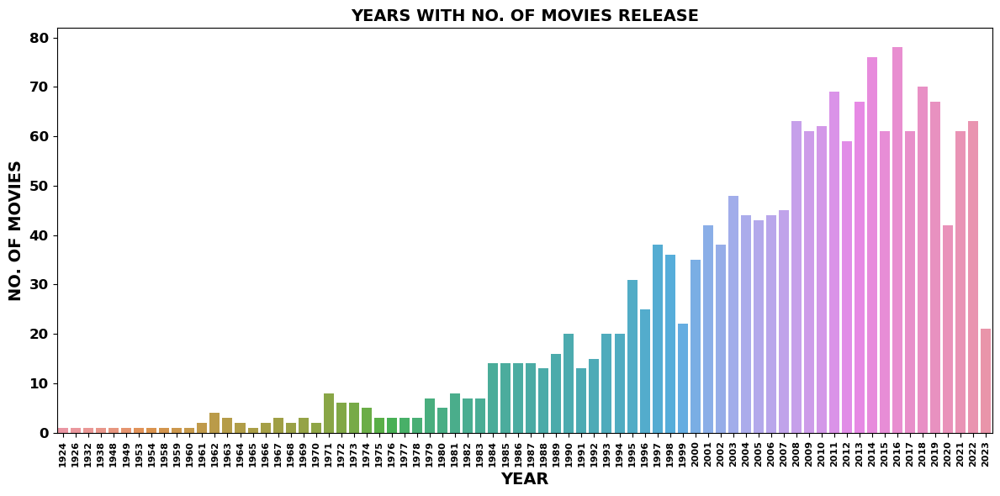

Observations for 'YEAR' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies released in the year 2016
- The least number of movies released in the year 1965
------------------------------------------------------------------------------------------------------------------------------


In [83]:
plot_data = dfv_0['Year'].value_counts()
data = plot_data
plt.figure(figsize=(12,6))
sns.barplot(x=data.index, y=data.values)
plt.title("YEARS WITH NO. OF MOVIES RELEASE",fontsize=14, fontweight='bold')
plt.xlabel("YEAR", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=8,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for 'YEAR' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies released in the year "+ str(plot_data.index[0]) +'\033[0m')
print('\033[1m'+ "- The least number of movies released in the year "+ str(plot_data.iloc[-1:].index[0]) +'\033[0m')
print("--"*63)

### Observations:

- **The highest number of IMDb rated movies released in the year "2016" and next highest no. of movies released in the year "2014"**
- **The least number of IMDb rated movies released in the year "1965"**

### NO. OF DIRECTORS WITH MORE NO. OF MOVIES DIRECTED

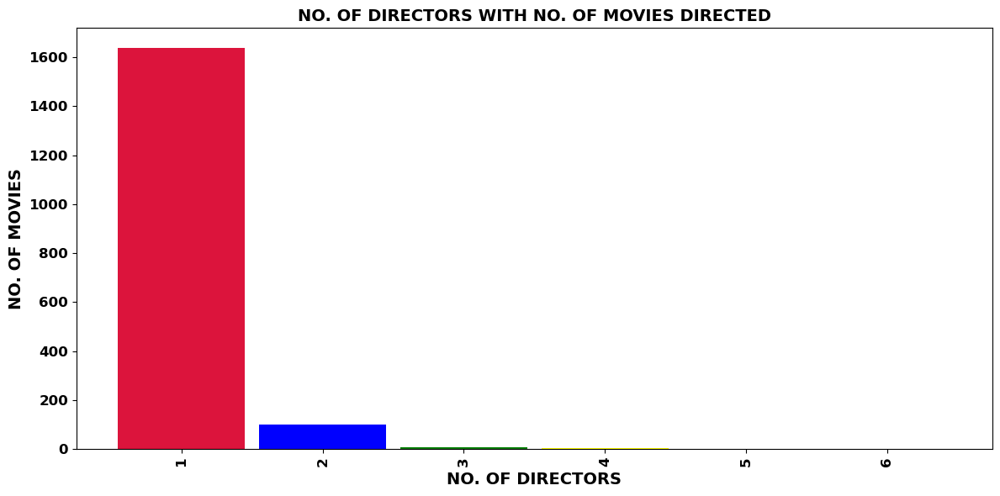

Observations for 'No of Directors' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies directed by 1 director(s)
- The least number of movies directed by 6 director(s)
------------------------------------------------------------------------------------------------------------------------------


In [84]:
plot_data = dfv_0['No. of Directors'].value_counts()
data = plot_data
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("NO. OF DIRECTORS WITH NO. OF MOVIES DIRECTED",fontsize=14, fontweight='bold')
plt.xlabel("NO. OF DIRECTORS", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for 'No of Directors' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies directed by "+ str(plot_data.index[0])+ " director(s)" +'\033[0m')
print('\033[1m'+ "- The least number of movies directed by "+ str(plot_data.iloc[-1:].index[0])+ " director(s)" +'\033[0m')
print("--"*63)

### Observations

- **More number of movies are directed by only single director**
- **Less number of movies are directed by 6 directors**
- **This indicates that movie success rate may be more if the movie is directed by one director rather than more than one director or collaboration may not be good if the number of directors are more**

### NO. OF GENRES WITH MORE NO. OF MOVIES

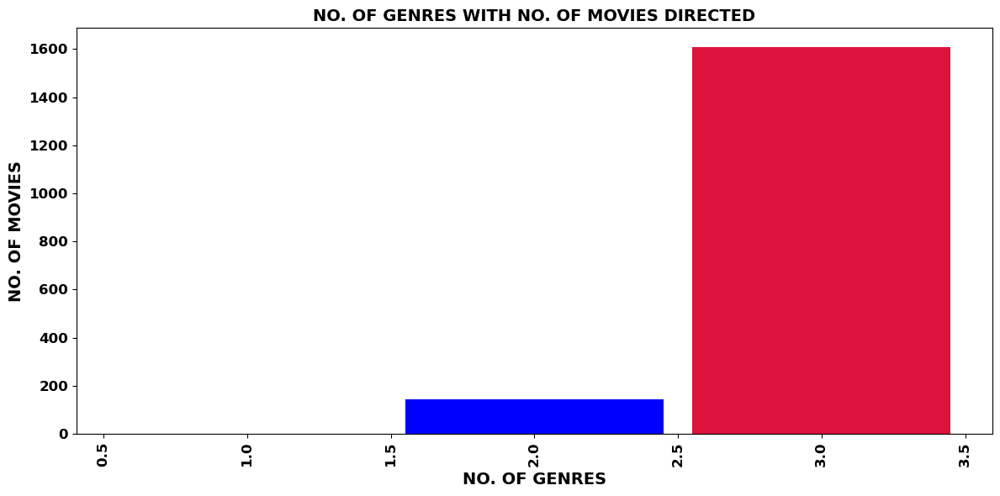

Observations for 'No. of Genres' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies have 3 genre(s)
- The least number of movies have 1 genre(s)
------------------------------------------------------------------------------------------------------------------------------


In [85]:
plot_data = dfv_0['No. of Genres'].value_counts()
data = plot_data
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("NO. OF GENRES WITH NO. OF MOVIES DIRECTED",fontsize=14, fontweight='bold')
plt.xlabel("NO. OF GENRES", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for 'No. of Genres' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies have "+ str(plot_data.index[0])+ " genre(s)" +'\033[0m')
print('\033[1m'+ "- The least number of movies have "+ str(plot_data.iloc[-1:].index[0])+ " genre(s)" +'\033[0m')
print("--"*63)

### Observations

- **More number of movies are having 3 genres**
- **Less number of movies are having 1 genre**
- **This indicates that movie success rate may be more if the no. of genres are more than one. This could be true as there will be more elements in the movie to watch for audience if the no. of genres are more that could create more interest**

### RATINGS VS NO. OF MOVIES

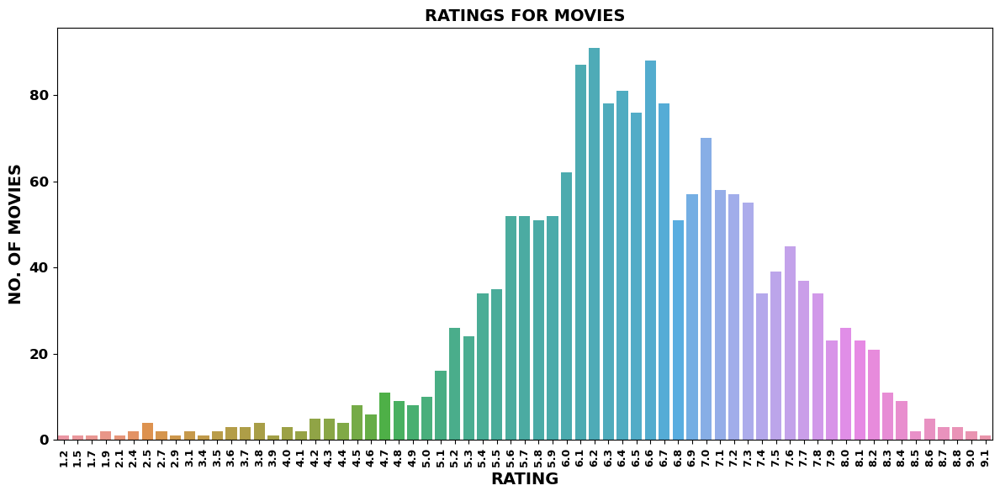

Observations for 'Ratings' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies have rating  6.2
- The least number of movies have rating 1.2
------------------------------------------------------------------------------------------------------------------------------


In [86]:
plot_data = dfv_0['Ratings'].value_counts()
data = plot_data
plt.figure(figsize=(12,6))
sns.barplot(x=data.index, y=data.values)
plt.title("RATINGS FOR MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("RATING", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=9,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for 'Ratings' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies have rating  "+ str(plot_data.index[0]) +'\033[0m')
print('\033[1m'+ "- The least number of movies have rating "+ str(plot_data.iloc[-1:].index[0]) +'\033[0m')
print("--"*63)

### Observations

- **More number of movies are having rating 6.2**
- **Less number of movies are having rating 1.2**
- **Highest rating around 9 is noticed only for few movies, this means that getting highest rating in IMDb needs an excellent quality movie**

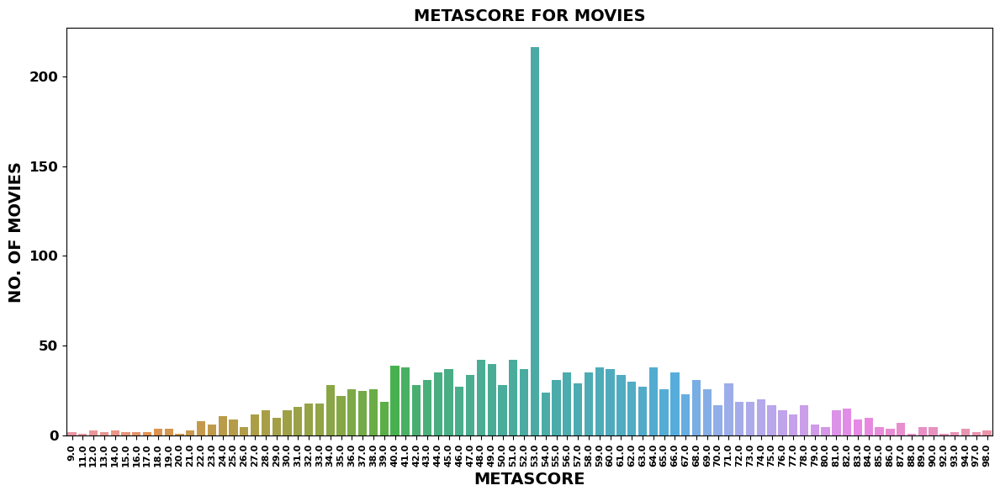

Observations for 'Metascore' column:
------------------------------------------------------------------------------------------------------------------------------
- The highest number of movies have Metascore  53.0
- The least number of movies have Metascore 92.0
------------------------------------------------------------------------------------------------------------------------------


In [87]:
plot_data = dfv_0['Metascore'].value_counts()
data = plot_data
plt.figure(figsize=(12,6))
sns.barplot(x=data.index, y=data.values)
plt.title("METASCORE FOR MOVIES",fontsize=14, fontweight='bold')
plt.xlabel("METASCORE", fontsize=14,fontweight='bold')
plt.ylabel('NO. OF MOVIES', fontsize=14,fontweight='bold')
plt.xticks(fontsize=8,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations for 'Metascore' column:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest number of movies have Metascore  "+ str(plot_data.index[0]) +'\033[0m')
print('\033[1m'+ "- The least number of movies have Metascore "+ str(plot_data.iloc[-1:].index[0]) +'\033[0m')
print("--"*63)

### Observations

- **More number of movies are having Metascore  53.0. Interestingly, this indicates that neutral score is given for majority of the movies**
- **Less number of movies are having Metascore 92.0**
- **Highest metascore around 90 is noticed only for few movies, this means that getting highest Metascore in IMDb needs an excellent quality movie**

<span style="color:brown; font-weight:bold; font-size:24px;">Bivariate Graphical Analysis for Categorical data</span>

In [88]:
df_categorical=['Director 1','Director 2','Director 3','Director 4','Director 5','Director 6','Certification','Star 1','Star 2','Star 3','Star 4','Genre1','Genre2','Genre3']

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR" VS "VOTES") IN ENTIRE DATASET

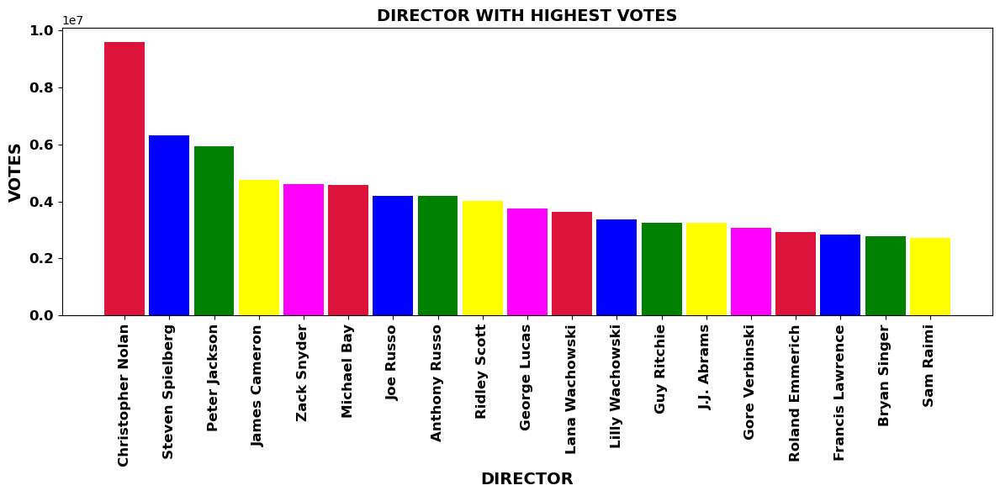

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by CHRISTOPHER NOLAN
- The less total number of votes received for movies that are directed by PARK HOON-JUNG
------------------------------------------------------------------------------------------------------------------------------


In [89]:
# As Director has 6 columns, combining Director 1 to Director 6 columns using melt function so that
# I can plot Votes Vs Director Name for the entire dataset

# Reshape the dataframe using melt to combine Director 1 to Director 6 columns
melted_df = df.melt(value_vars=['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6'],
                    id_vars='Votes',
                    value_name='Director').dropna()

# Group the data by unique director names and sum the votes for each director
plot_data = melted_df.groupby('Director')['Votes'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Director')['Votes'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Director" Vs "Votes":

- **The highest total number of votes received for movies that are directed by CHRISTOPHER NOLAN in entire dataset**
- **The less total number of votes received for movies that are directed by PARK HOON-JUNG in entire dataset**
- **This means that CHRISTOPHER NOLAN movies have more popularity or having greater viewer interest where as PARK HOON-JUNG movies are least popular in the overall dataset**

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR 1" VS "VOTES")

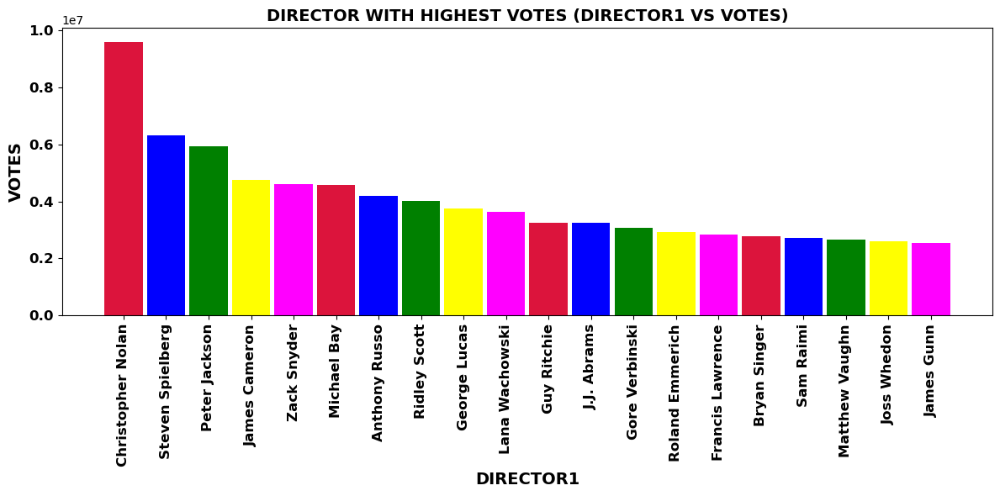

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by CHRISTOPHER NOLAN in Director 1 column
- The less total number of votes received for movies that are directed by PARK HOON-JUNG in Director 1 column
------------------------------------------------------------------------------------------------------------------------------


In [90]:
plot_data= dfv_0.groupby(['Director 1'])["Votes"].sum().sort_values(ascending =False)
data = dfv_0.groupby(['Director 1'])["Votes"].sum().sort_values(ascending =False)[:20]
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES (DIRECTOR1 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR1", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ plot_data.index[0].upper()+ " in Director 1 column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in Director 1 column" +'\033[0m')
print("--"*63)

### Observations with "Director 1" Vs "Votes":

- **The highest total number of votes received for movies that are directed by CHRISTOPHER NOLAN in "Director 1" column**
- **The less total number of votes received for movies that are directed by PARK HOON-JUNG in "Director 1" column**
- **This means that CHRISTOPHER NOLAN movies have more popularity or having greater viewer interest where as PARK HOON-JUNG movies are least popular**

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR 2" VS "VOTES")

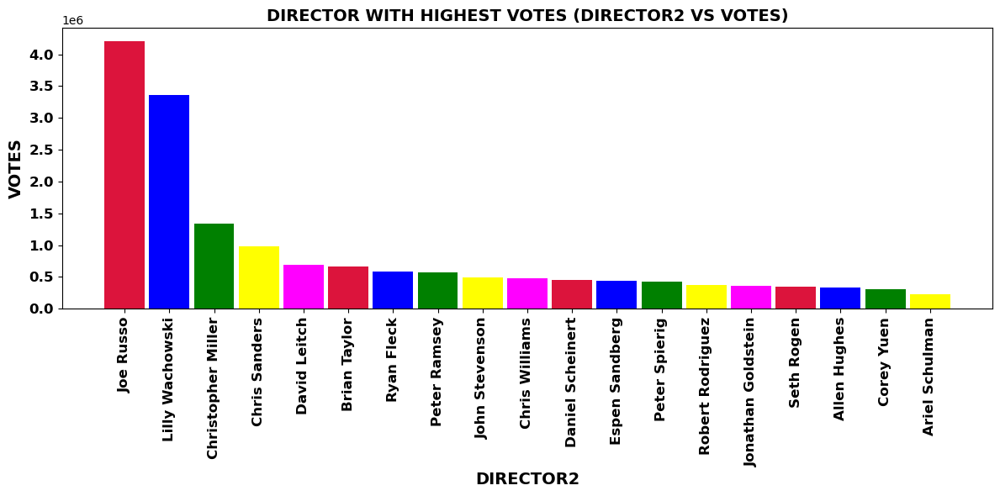

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by JOE RUSSO in Director 2 column
- The less total number of votes received for movies that are directed by DAVID LANE in Director 2 column
------------------------------------------------------------------------------------------------------------------------------


In [91]:
plot_data= dfv_0.groupby(['Director 2'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Director 2'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES (DIRECTOR2 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR2", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ data.index[0].upper() + " in Director 2 column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in Director 2 column" +'\033[0m')
print("--"*63)

### Observations with "Director 2" Vs "Votes":

- **The highest total number of votes received for movies that are directed by JOE RUSSO in "Director 2" column**
- **The less total number of votes received for movies that are directed by DAVID LANE in "Director 2" column**
- **This means that JOE RUSSO movies have more popularity or having greater viewer interest where as DAVID LANE movies are least popular**

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR 3" VS "VOTES")

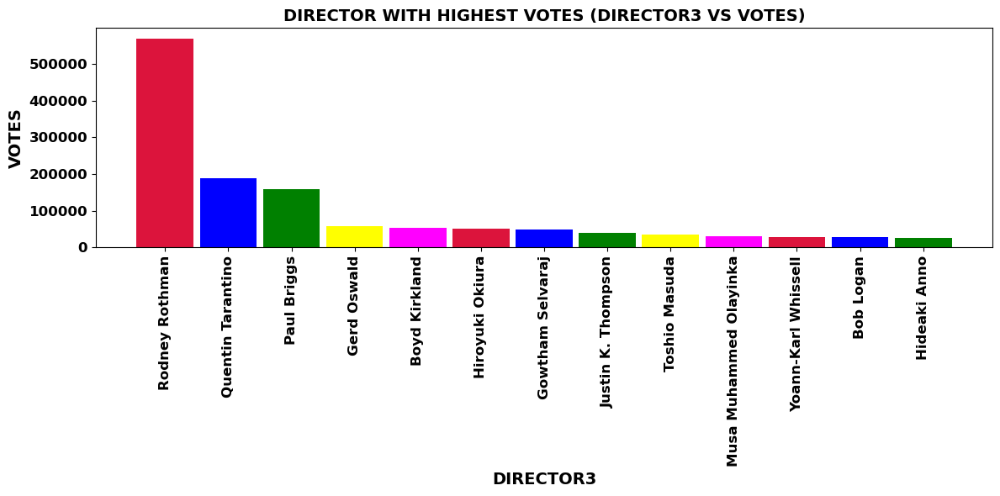

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by RODNEY ROTHMAN in Director 3 column
- The less total number of votes received for movies that are directed by HIDEAKI ANNO in Director 3 column
------------------------------------------------------------------------------------------------------------------------------


In [92]:
plot_data= dfv_0.groupby(['Director 3'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Director 3'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES (DIRECTOR3 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR3", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ data.index[0].upper() + " in Director 3 column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in Director 3 column" +'\033[0m')
print("--"*63)

### Observations with "Director 3" Vs "Votes":

- **The highest total number of votes received for movies that are directed by RODNEY ROTHMAN in "Director 3" column**
- **The less total number of votes received for movies that are directed by HIDEAKI ANNO in "Director 3" column**
- **This means that RODNEY ROTHMAN movies have more popularity or having greater viewer interest where as HIDEAKI ANNO movies are least popular**

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR 4" VS "VOTES")

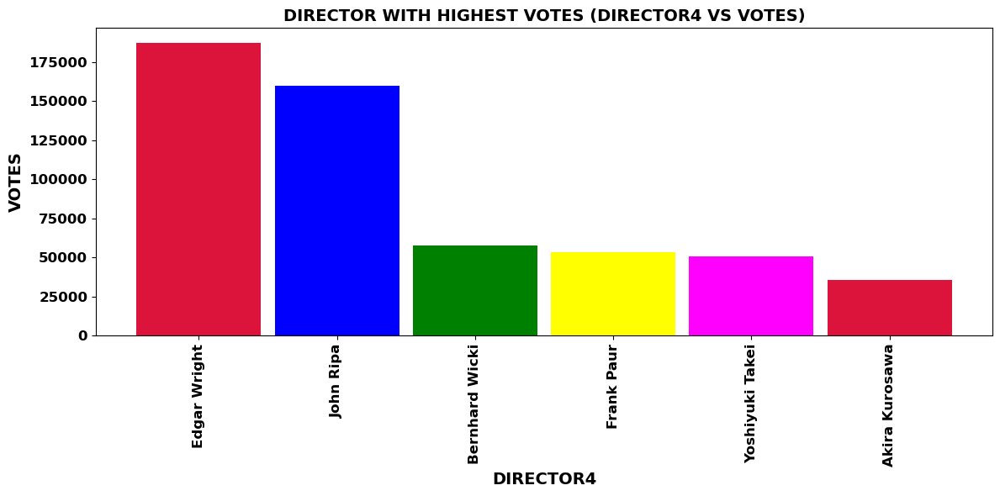

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by EDGAR WRIGHT in Director 4 column
- The less total number of votes received for movies that are directed by AKIRA KUROSAWA in Director 4 column
------------------------------------------------------------------------------------------------------------------------------


In [93]:
plot_data= dfv_0.groupby(['Director 4'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Director 4'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES (DIRECTOR4 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR4", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ data.index[0].upper() + " in Director 4 column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in Director 4 column" +'\033[0m')
print("--"*63)

### Observations with "Director 4" Vs "Votes":

- **The highest total number of votes received for movies that are directed by EDGAR WRIGHT in "Director 4" column**
- **The less total number of votes received for movies that are directed by AKIRA KUROSAWA in "Director 4" column**
- **This means that EDGAR WRIGHT movies have more popularity or having greater viewer interest where as AKIRA KUROSAWA movies are least popular**

### DIRECTORS WITH HIGHEST NO. OF TOTAL VOTES ("DIRECTOR 5" VS "VOTES")

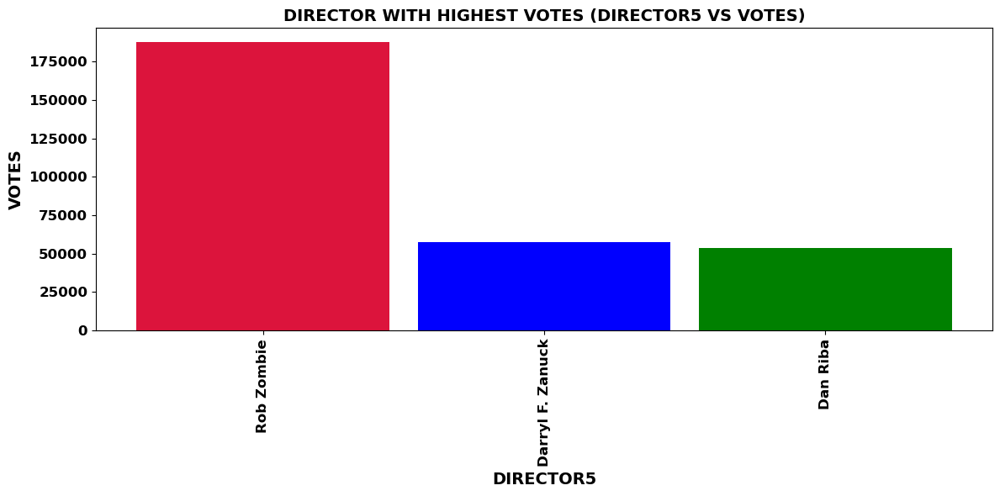

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are directed by ROB ZOMBIE in Director 5 column
- The less total number of votes received for movies that are directed by DAN RIBA in Director 5 column
------------------------------------------------------------------------------------------------------------------------------


In [94]:
plot_data= dfv_0.groupby(['Director 5'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Director 5'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST VOTES (DIRECTOR5 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR5", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are directed by "+ data.index[0].upper() + " in Director 5 column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in Director 5 column" +'\033[0m')
print("--"*63)

### Observations with "Director 5" Vs "Votes":

- **The highest total number of votes received for movies that are directed by ROB ZOMBIE in "Director 5" column**
- **The less total number of votes received for movies that are directed by DAN RIBA in "Director 5" column**
- **This means that ROB ZOMBIE movies have more popularity or having greater viewer interest where as DAN RIBA movies are least popular**

### CERTIFICATIONS WITH HIGHEST NO. OF TOTAL VOTES

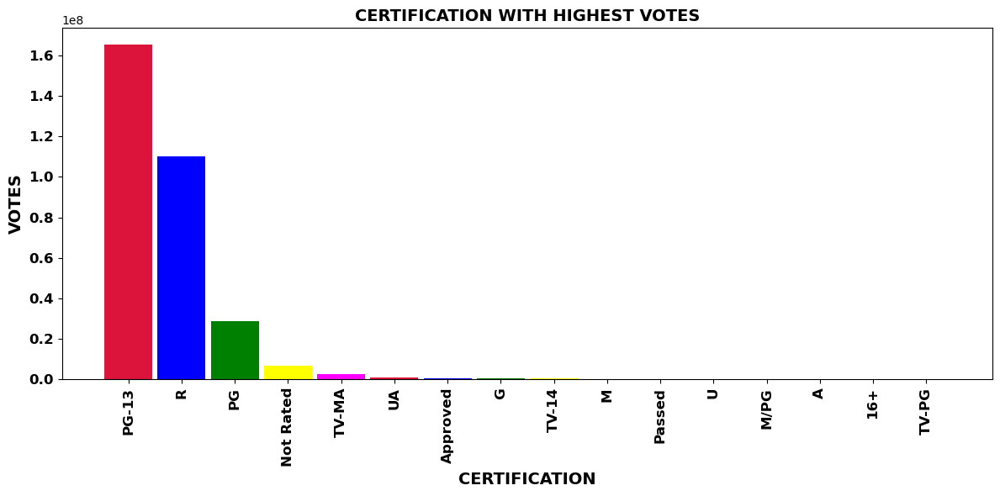

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies with certification PG-13
- The less total number of votes received for movies with certification TV-PG
------------------------------------------------------------------------------------------------------------------------------


In [95]:
plot_data= dfv_0.groupby(['Certification'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Certification'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("CERTIFICATION WITH HIGHEST VOTES",fontsize=14, fontweight='bold')
plt.xlabel("CERTIFICATION", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies with certification "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies with certification "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Certification" Vs "Votes":

- **The highest total number of votes received for movies with certification PG-13**
- **The less total number of votes received for movies with certification TV-PG**
- **This means that PG-13 certified movies have more popularity or having greater viewer interest where as TV-PG certified movies are least popular**

### STARS WITH HIGHEST NO. OF TOTAL VOTES ("STAR" VS "VOTES") IN ENTIRE DATASET

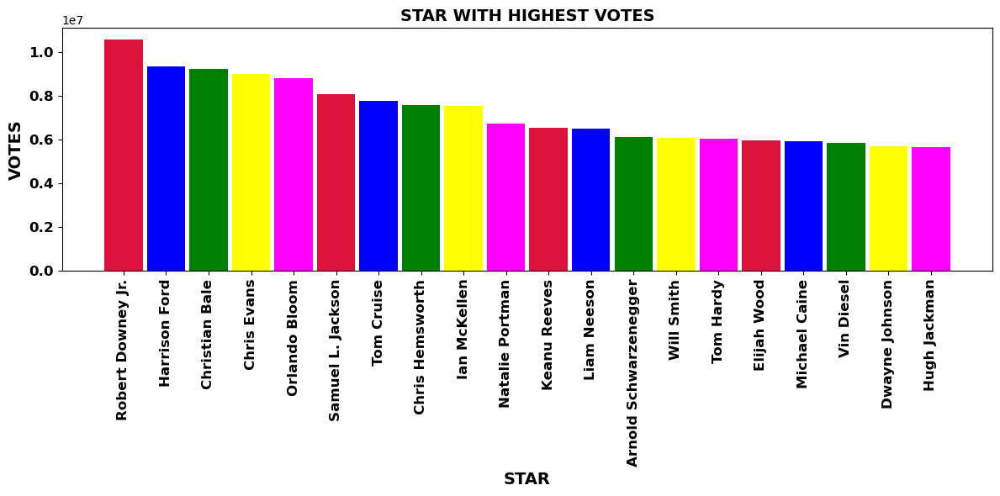

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are acted by ROBERT DOWNEY JR.
- The less total number of votes received for movies that are acted by PARK SUNG-WOONG
------------------------------------------------------------------------------------------------------------------------------


In [96]:
# As Star has 4 columns, combining Star 1 to Star 4 columns using melt function so that
# I can plot Votes Vs Star Name for the entire dataset

# Reshape the dataframe using melt to combine Star 1 to Star 4 columns
melted_df = df.melt(value_vars=['Star 1', 'Star 2', 'Star 3', 'Star 4'],
                    id_vars='Votes',
                    value_name='Star').dropna()

# Group the data by unique Star names and sum the votes for each Star
plot_data = melted_df.groupby('Star')['Votes'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Star')['Votes'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STAR WITH HIGHEST VOTES",fontsize=14, fontweight='bold')
plt.xlabel("STAR", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are acted by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Star" Vs "Votes":

- **The highest total number of votes received for movies that are acted by ROBERT DOWNEY JR. in the entire dataset**
- **The less total number of votes received for movies that are acted by PARK SUNG-WOONG in the entire dataset**
- **This means that ROBERT DOWNEY JR. movies have more popularity or having greater viewer interest where as PARK SUNG-WOONG movies are least popular in the entire dataset**

### STARS WITH HIGHEST NO. OF TOTAL VOTES ("STAR1" VS "VOTES")

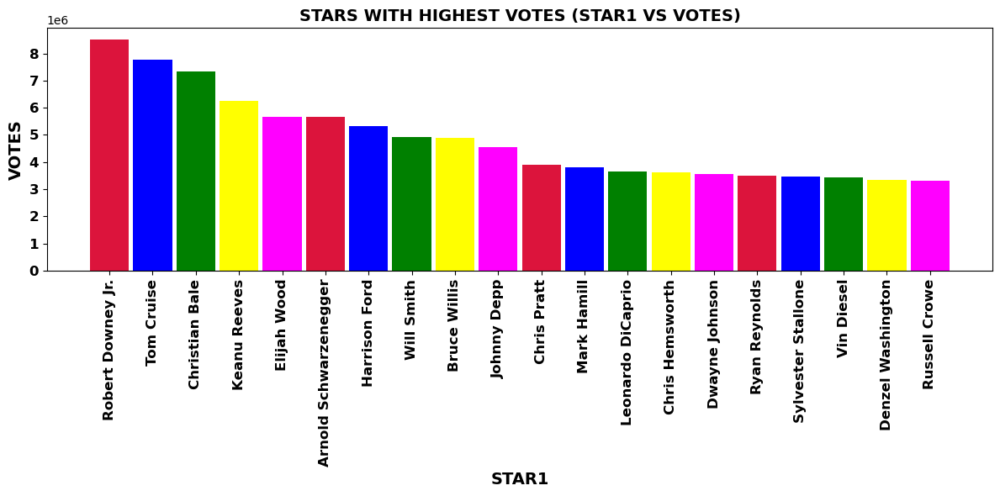

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are acted by ROBERT DOWNEY JR. in 'Star 1' column
- The less total number of votes received for movies that are acted by LEE JUNG-JAE in 'Star 1' column
------------------------------------------------------------------------------------------------------------------------------


In [97]:
plot_data= dfv_0.groupby(['Star 1'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 1'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST VOTES (STAR1 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("STAR1", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are acted by "+ data.index[0].upper() + " in 'Star 1' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 1' column" +'\033[0m')
print("--"*63)

### Observations with "Star 1" Vs "Votes":

- **The highest total number of votes received for movies that are acted by ROBERT DOWNEY JR. in "Star 1" column**
- **The less total number of votes received for movies that are acted by LEE JUNG-JAE in "Star 1" column**
- **This means that ROBERT DOWNEY JR. movies have more popularity or having greater viewer interest where as LEE JUNG-JAE movies are least popular**

### STARS WITH HIGHEST NO. OF TOTAL VOTES ("STAR2" VS "VOTES")

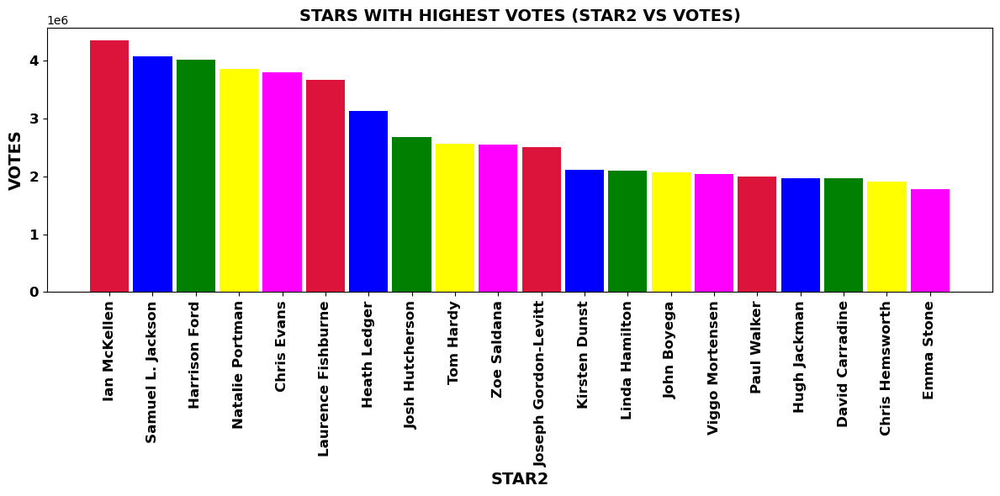

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are acted by IAN MCKELLEN in 'Star 2' column
- The less total number of votes received for movies that are acted by RAMÓN RODRÍGUEZ in 'Star 2' column
------------------------------------------------------------------------------------------------------------------------------


In [98]:
plot_data= dfv_0.groupby(['Star 2'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 2'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST VOTES (STAR2 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("STAR2", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are acted by "+ data.index[0].upper() + " in 'Star 2' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 2' column" +'\033[0m')
print("--"*63)

### Observations with "Star 2" Vs "Votes":

- **The highest total number of votes received for movies that are acted by IAN MCKELLEN in "Star 2" column**
- **The less total number of votes received for movies that are acted by RAMÓN RODRÍGUEZ in "Star 2" column**
- **This means that IAN MCKELLEN movies have more popularity or having greater viewer interest where as RAMÓN RODRÍGUEZ movies are least popular**

### STARS WITH HIGHEST NO. OF TOTAL VOTES ("STAR3" VS "VOTES")

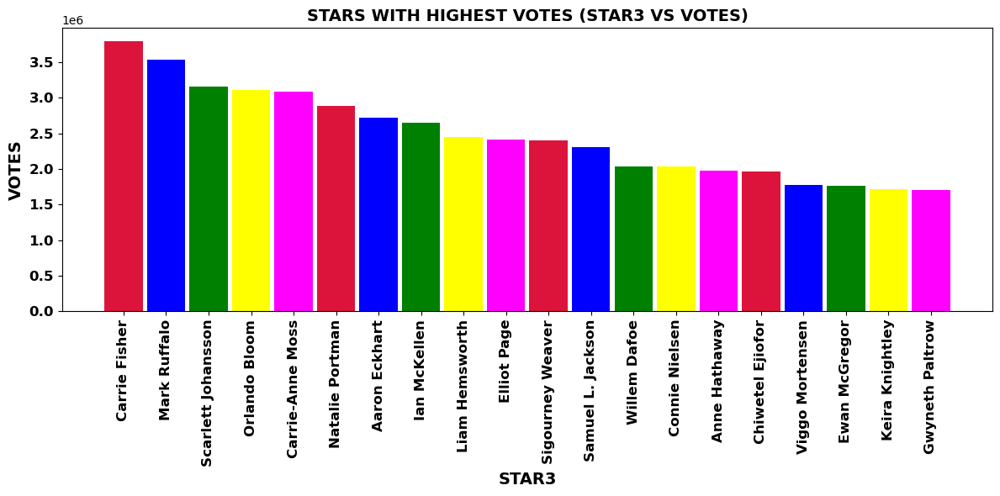

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are acted by CARRIE FISHER in 'Star 3' column
- The less total number of votes received for movies that are acted by HWANG JUNG-MIN in 'Star 3' column
------------------------------------------------------------------------------------------------------------------------------


In [99]:
plot_data= dfv_0.groupby(['Star 3'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 3'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST VOTES (STAR3 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("STAR3", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are acted by "+ data.index[0].upper() + " in 'Star 3' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 3' column" +'\033[0m')
print("--"*63)

### Observations with "Star 3" Vs "Votes":

- **The highest total number of votes received for movies that are acted by CARRIE FISHER in "Star 3" column**
- **The less total number of votes received for movies that are acted by LEE HWANG JUNG-MIN in "Star 3" column**
- **This means that CARRIE FISHER movies have more popularity or having greater viewer interest where as HWANG JUNG-MIN movies are least popular**

### STARS WITH HIGHEST NO. OF TOTAL VOTES ("STAR4" VS "VOTES")

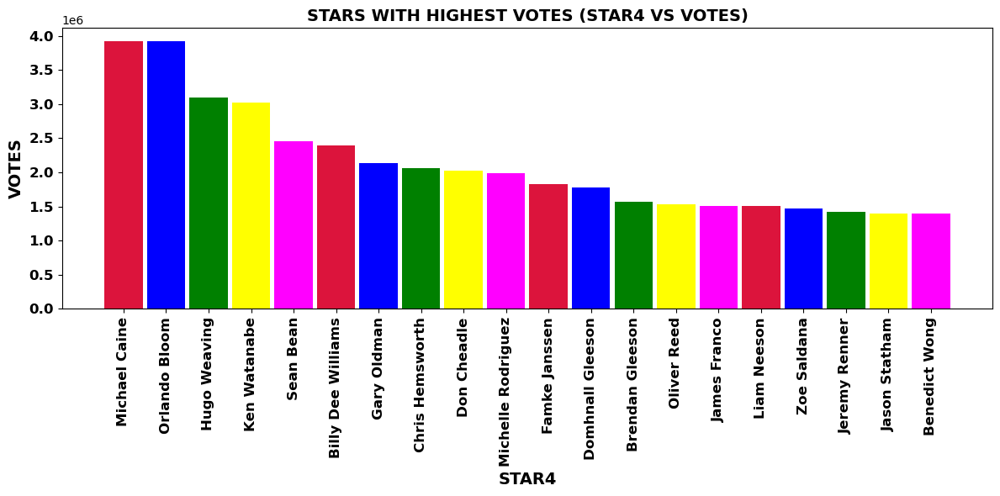

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies that are acted by MICHAEL CAINE in 'Star 4' column
- The less total number of votes received for movies that are acted by PARK SUNG-WOONG in 'Star 4' column
------------------------------------------------------------------------------------------------------------------------------


In [100]:
plot_data= dfv_0.groupby(['Star 4'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 4'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST VOTES (STAR4 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("STAR4", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies that are acted by "+ data.index[0].upper() + " in 'Star 4' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 4' column" +'\033[0m')
print("--"*63)

### Observations with "Star 4" Vs "Votes":

- **The highest total number of votes received for movies that are acted by MICHAEL CAINE in "Star 4" column**
- **The less total number of votes received for movies that are acted by SUNG-WOONG in "Star 4" column**
- **This means that MICHAEL CAINE movies have more popularity or having greater viewer interest where as SUNG-WOONG movies are least popular**

### GENRES WITH HIGHEST NO. OF TOTAL VOTES ("GENRE" VS "VOTES") IN ENTIRE DATASET

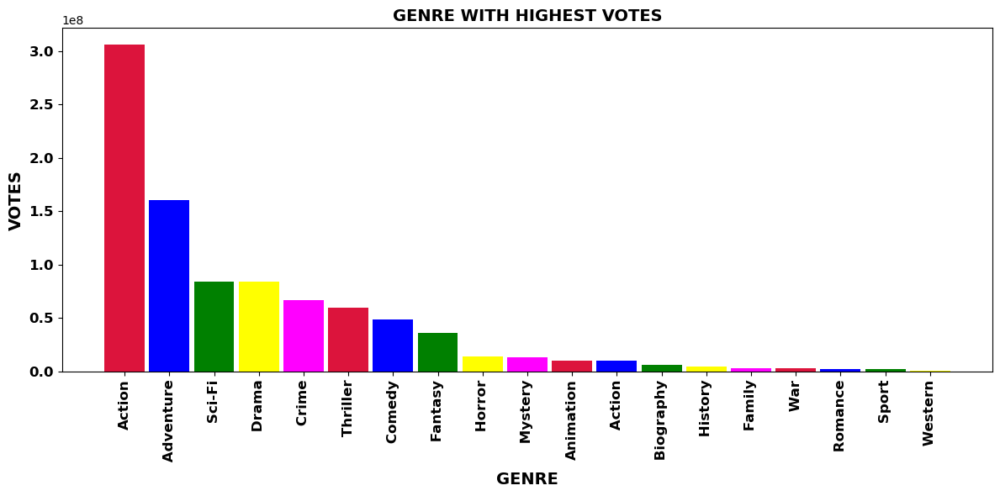

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies with genre ACTION
- The less total number of votes received for movies with genre  MUSICAL
------------------------------------------------------------------------------------------------------------------------------


In [101]:
# As Genre has 3 columns, combining Genre1 to Genre 3 columns using melt function so that
# I can plot Votes Vs Genre for the entire dataset

# Reshape the dataframe using melt to combine Genre1 to Genre3 columns
melted_df = df.melt(value_vars=['Genre1', 'Genre2', 'Genre3'],
                    id_vars='Votes',
                    value_name='Genre').dropna()

# Group the data by unique Genrenames and sum the votes for each Genre
plot_data = melted_df.groupby('Genre')['Votes'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Genre')['Votes'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST VOTES",fontsize=14, fontweight='bold')
plt.xlabel("GENRE", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies with genre "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+'\033[0m')
print("--"*63)

### Observations with "Genre" Vs "Votes":

- **The highest total number of votes received for movies with Genre ACTION in the entire dataset**
- **The less total number of votes received for movies with Genre MUSICAL in the entire dataset**
- **This means that movies with genre ACTION have more popularity or having greater viewer interest where as movies with genre MUSICAL are least popular in the entire dataset**

### GENRES WITH HIGHEST NO. OF TOTAL VOTES ("GENRE1" VS "VOTES")

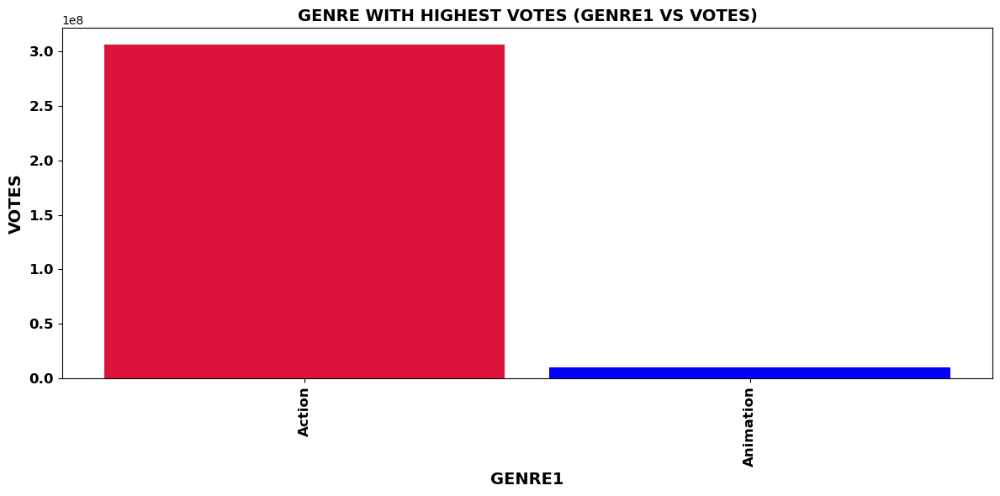

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies with genre ACTION in 'Genre1' column
- The less total number of votes received for movies with genre ANIMATION in 'Genre1' column
------------------------------------------------------------------------------------------------------------------------------


In [102]:
plot_data= dfv_0.groupby(['Genre1'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Genre1'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST VOTES (GENRE1 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE1", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies with genre "+ data.index[0].upper() + " in 'Genre1' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre1' column" +'\033[0m')
print("--"*63)

### Observations with "Genre1" Vs "Votes":

- **The highest total number of votes received for movies with Genre ACTION in "Genre1" column**
- **The less total number of votes received for movies with Genre ANIMATION in "Genre1" column**
- **This means that movies with genre ACTION have more popularity or having greater viewer interest where as movies with genre ANIMATION are least popular**

### GENRES WITH HIGHEST NO. OF TOTAL VOTES ("GENRE2" VS "VOTES")

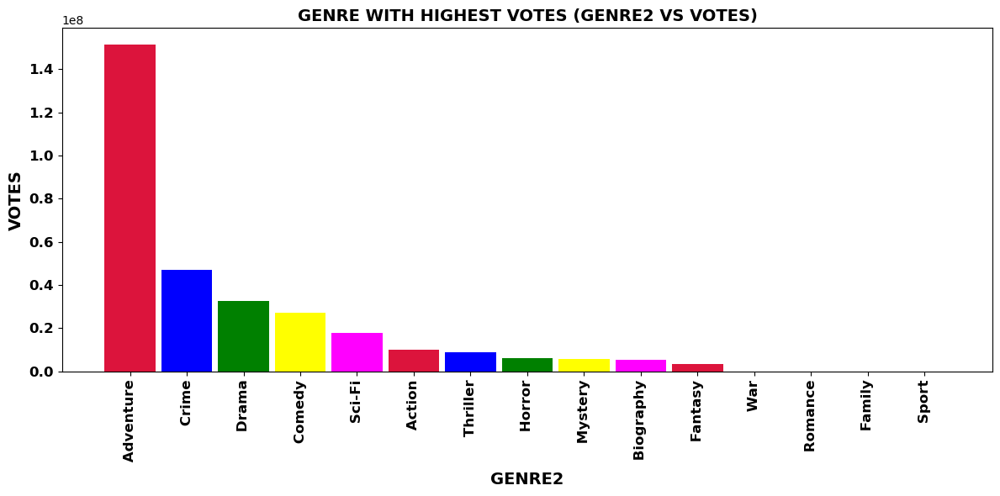

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies wigh genre  ADVENTURE in 'Genre2' column
- The less total number of votes received for movies with genre  SPORT in 'Genre2' column
------------------------------------------------------------------------------------------------------------------------------


In [103]:
plot_data= dfv_0.groupby(['Genre2'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Genre2'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST VOTES (GENRE2 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE2", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies wigh genre "+ data.index[0].upper() + " in 'Genre2' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre2' column" +'\033[0m')
print("--"*63)

### Observations with "Genre2" Vs "Votes":

- **The highest total number of votes received for movies with Genre ADVENTURE in "Genre2" column**
- **The less total number of votes received for movies with Genre SPORT in "Genre2" column**
- **This means that movies with genre ADVENTURE have more popularity or having greater viewer interest where as movies with genre SPORT are least popular**

### GENRES WITH HIGHEST NO. OF TOTAL VOTES ("GENRE3" VS "VOTES")

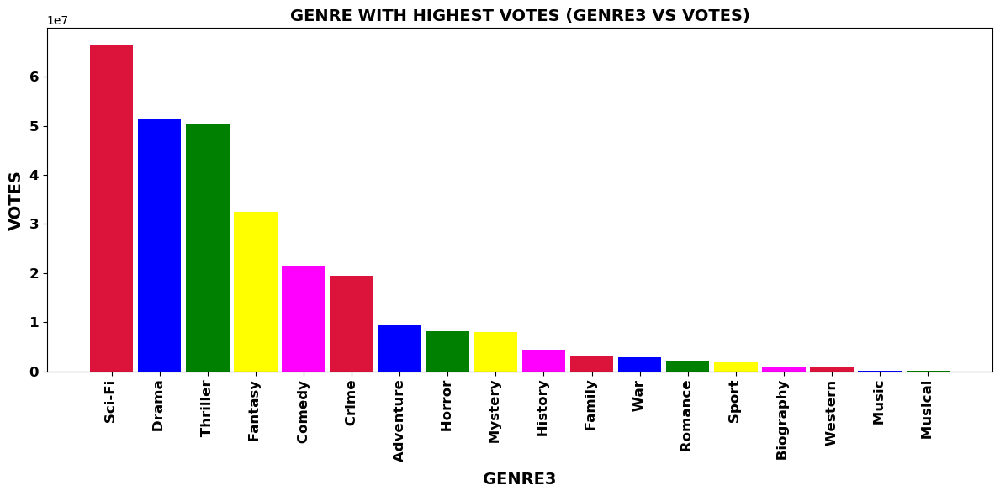

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of votes received for movies wigh genre  SCI-FI in 'Genre3' column
- The less total number of votes received for movies with genre  MUSICAL in 'Genre3' column
------------------------------------------------------------------------------------------------------------------------------


In [104]:
plot_data= dfv_0.groupby(['Genre3'])["Votes"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Genre3'])["Votes"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST VOTES (GENRE3 VS VOTES)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE3", fontsize=14,fontweight='bold')
plt.ylabel("VOTES", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of votes received for movies wigh genre "+ data.index[0].upper() + " in 'Genre3' column" +'\033[0m')
print('\033[1m'+ "- The less total number of votes received for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre3' column" +'\033[0m')
print("--"*63)

### Observations with "Genre3" Vs "Votes":

- **The highest total number of votes received for movies with Genre SCI-FI in "Genre3" column**
- **The less total number of votes received for movies with Genre MUSICAL in "Genre3" column**
- **This means that movies with genre SCI-FI have more popularity or having greater viewer interest where as movies with genre MUSICAL are least popular**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR" VS "GROSS") IN ENTIRE DATASET

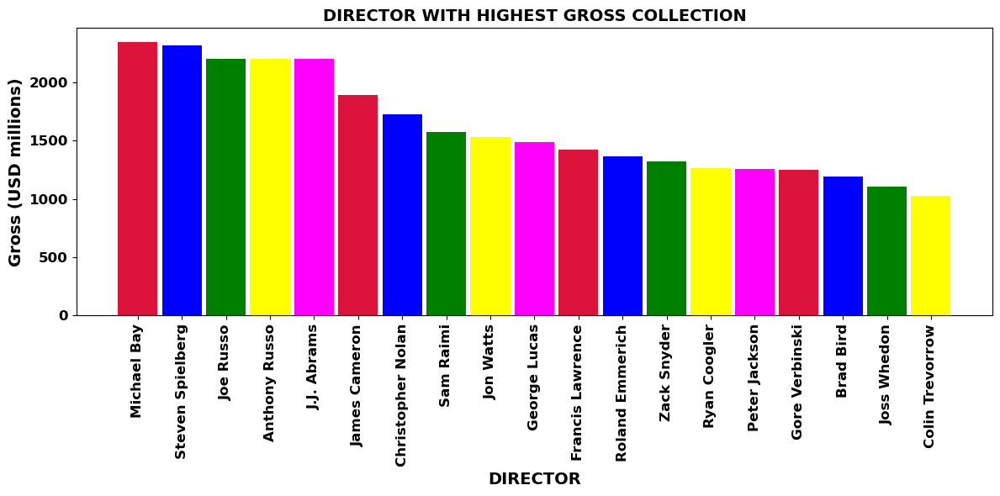

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of Gross (USD millions) received for movies that are directed by MICHAEL BAY
- The less total number of Gross (USD millions) received for movies that are directed by THOMAS JAHN
------------------------------------------------------------------------------------------------------------------------------


In [105]:
# As Director has 6 columns, combining Director 1 to Director 6 columns using melt function so that
# I can plot Gross (USD millions) Vs Director Name for the entire dataset

# Reshape the dataframe using melt to combine Director 1 to Director 6 columns
melted_df = df.melt(value_vars=['Director 1', 'Director 2', 'Director 3', 'Director 4', 'Director 5', 'Director 6'],
                    id_vars='Gross (USD millions)',
                    value_name='Director').dropna()

# Group the data by unique director names and sum the Gross (USD millions) for each director
plot_data = melted_df.groupby('Director')['Gross (USD millions)'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Director')['Gross (USD millions)'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of Gross (USD millions) received for movies that are directed by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of Gross (USD millions) received for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Director" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by MICHAEL BAY in the entire dataset**
- **The least Gross (USD millions) collected for movies that are directed by THOMAS JAHN in the entire dataset**
- **This means that MICHAEL BAY movies have more commerical success or has more total box office revenue where as THOMAS JAHN movies are having least commercial success or has least total box office revenue in the entire dataset**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR 1" VS "GROSS COLLECTION")

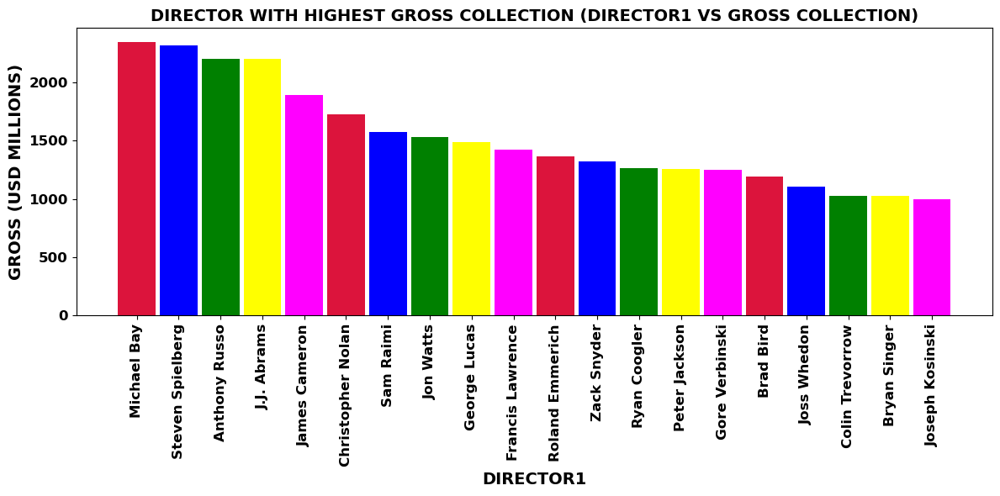

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest Gross (USD millions) collected for movies that are directed by MICHAEL BAY in 'Director 1' column
- The least Gross (USD millions) collected for movies that are directed by THOMAS JAHN in 'Director 1' column
------------------------------------------------------------------------------------------------------------------------------


In [106]:
plot_data= dfg_0.groupby(['Director 1'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data = dfg_0.groupby(['Director 1'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION (DIRECTOR1 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR1", fontsize=14,fontweight='bold')
plt.ylabel("GROSS (USD MILLIONS)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest Gross (USD millions) collected for movies that are directed by "+ plot_data.index[0].upper()+ " in 'Director 1' column" +'\033[0m')
print('\033[1m'+ "- The least Gross (USD millions) collected for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Director 1' column" +'\033[0m')
print("--"*63)

### Observations with "Director 1" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by MICHAEL BAY in 'Director 1' column**
- **The least Gross (USD millions) collected for movies that are directed by THOMAS JAHN in 'Director 1' column**
- **This means that MICHAEL BAY movies have more commerical success or has more total box office revenue where as THOMAS JAHN movies are having least commercial success or has least total box office revenue**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR 2" VS "GROSS COLLECTION")

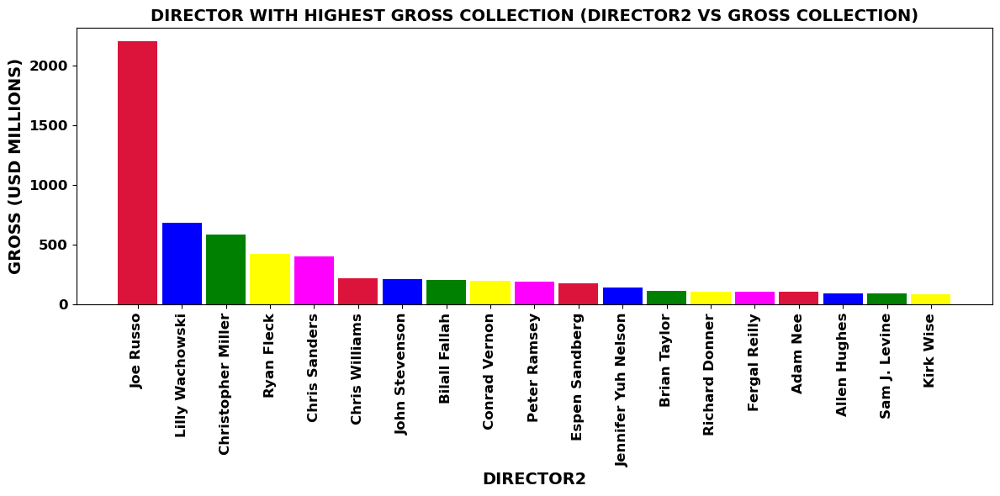

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest Gross (USD millions) collected for movies that are directed by JOE RUSSO in 'Director 2' column
- The least Gross (USD millions) collected for movies that are directed by CHIA-HSIANG WU in 'Director 2' column
------------------------------------------------------------------------------------------------------------------------------


In [107]:
plot_data= dfg_0.groupby(['Director 2'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Director 2'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION (DIRECTOR2 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR2", fontsize=14,fontweight='bold')
plt.ylabel("GROSS (USD MILLIONS)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest Gross (USD millions) collected for movies that are directed by "+ data.index[0].upper()+ " in 'Director 2' column" +'\033[0m')
print('\033[1m'+ "- The least Gross (USD millions) collected for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Director 2' column" +'\033[0m')
print("--"*63)

### Observations with "Director 2" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by JOE RUSSO in 'Director 2' column**
- **The least Gross (USD millions) collected for movies that are directed by CHIA-HSIANG WU in 'Director 2' column**
- **This means that JOE RUSSO movies have more commerical success or has more total box office revenue where as CHIA-HSIANG WU movies are having least commercial success or has least total box office revenue**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR 3" VS "GROSS COLLECTION")

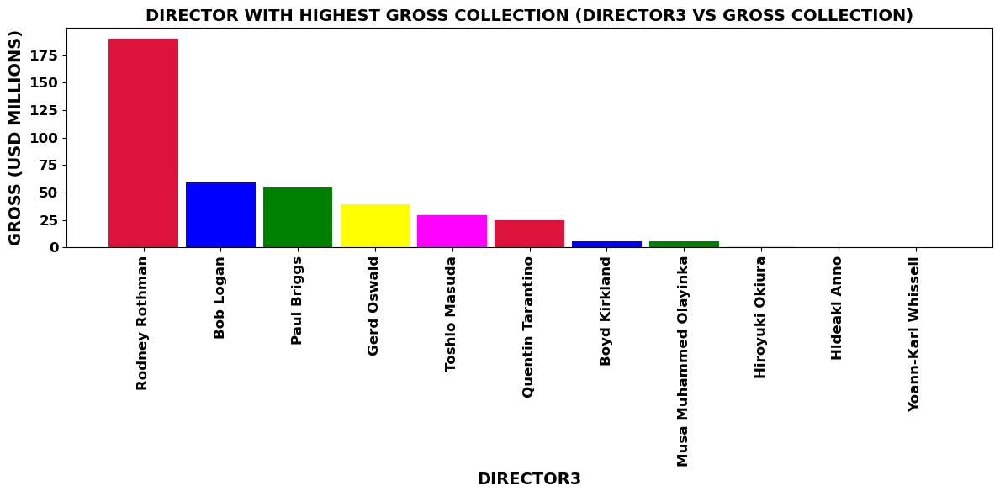

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest Gross (USD millions) collected for movies that are directed by RODNEY ROTHMAN in 'Director 3' column
- The least Gross (USD millions) collected for movies that are directed by YOANN-KARL WHISSELL in 'Director 3' column
------------------------------------------------------------------------------------------------------------------------------


In [108]:
plot_data= dfg_0.groupby(['Director 3'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Director 3'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION (DIRECTOR3 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR3", fontsize=14,fontweight='bold')
plt.ylabel("GROSS (USD MILLIONS)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest Gross (USD millions) collected for movies that are directed by "+ data.index[0].upper()+ " in 'Director 3' column" +'\033[0m')
print('\033[1m'+ "- The least Gross (USD millions) collected for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Director 3' column" +'\033[0m')
print("--"*63)

### Observations with "Director 3" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by RODNEY ROTHMAN in 'Director 3' column**
- **The least Gross (USD millions) collected for movies that are directed by YOANN-KARL WHISSELL in 'Director 3' column**
- **This means that RODNEY ROTHMAN movies have more commerical success or has more total box office revenue where as YOANN-KARL WHISSELL movies are having least commercial success or has least total box office revenue**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR 4" VS "GROSS COLLECTION")

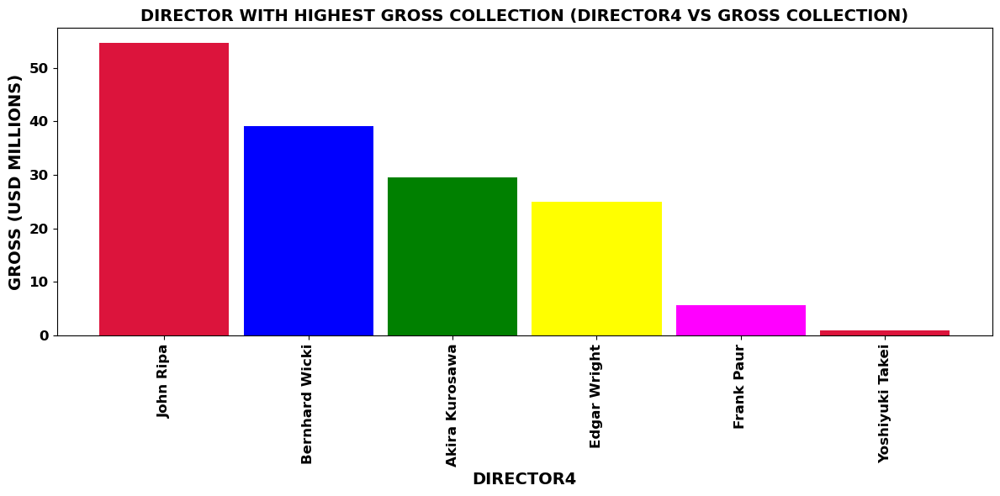

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest Gross (USD millions) collected for movies that are directed by JOHN RIPA in 'Director 4' column
- The least Gross (USD millions) collected for movies that are directed by YOSHIYUKI TAKEI in 'Director 4' column
------------------------------------------------------------------------------------------------------------------------------


In [109]:
plot_data= dfg_0.groupby(['Director 4'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Director 4'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION (DIRECTOR4 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR4", fontsize=14,fontweight='bold')
plt.ylabel("GROSS (USD MILLIONS)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest Gross (USD millions) collected for movies that are directed by "+ data.index[0].upper()+ " in 'Director 4' column" +'\033[0m')
print('\033[1m'+ "- The least Gross (USD millions) collected for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Director 4' column" +'\033[0m')
print("--"*63)

### Observations with "Director 4" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by JOHN RIPA in 'Director 4' column**
- **The least Gross (USD millions) collected for movies that are directed by YOSHIYUKI TAKEI in 'Director 4' column**
- **This means that JOHN RIPA movies have more commerical success or has more total box office revenue where as YOSHIYUKI TAKEI movies are having least commercial success or has least total box office revenue**

### DIRECTORS WITH HIGHEST GROSS COLLECTION ("DIRECTOR 5" VS "GROSS COLLECTION")

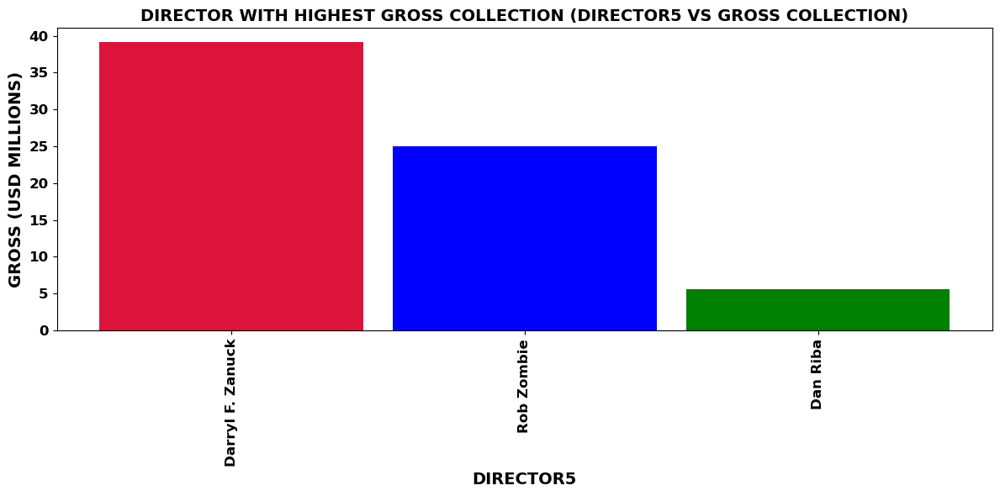

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest Gross (USD millions) collected for movies that are directed by DARRYL F. ZANUCK in 'Director 5' column
- The least Gross (USD millions) collected for movies that are directed by DAN RIBA in 'Director 5' column
------------------------------------------------------------------------------------------------------------------------------


In [110]:
plot_data= dfg_0.groupby(['Director 5'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Director 5'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("DIRECTOR WITH HIGHEST GROSS COLLECTION (DIRECTOR5 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("DIRECTOR5", fontsize=14,fontweight='bold')
plt.ylabel("GROSS (USD MILLIONS)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest Gross (USD millions) collected for movies that are directed by "+ data.index[0].upper()+ " in 'Director 5' column" +'\033[0m')
print('\033[1m'+ "- The least Gross (USD millions) collected for movies that are directed by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Director 5' column" +'\033[0m')
print("--"*63)

### Observations with "Director 5" Vs "Gross Collection":

- **The highest Gross (USD millions) collected for movies that are directed by DARRYL F. ZANUCK in 'Director 5' column**
- **The least Gross (USD millions) collected for movies that are directed by DAN RIBA in 'Director 5' column**
- **This means that DARRYL F. ZANUCK movies have more commerical success or has more total box office revenue where as DAN RIBA movies are having least commercial success or has least total box office revenue**

### CERTIFICATIONS WITH HIGHEST GROSS COLLECTION

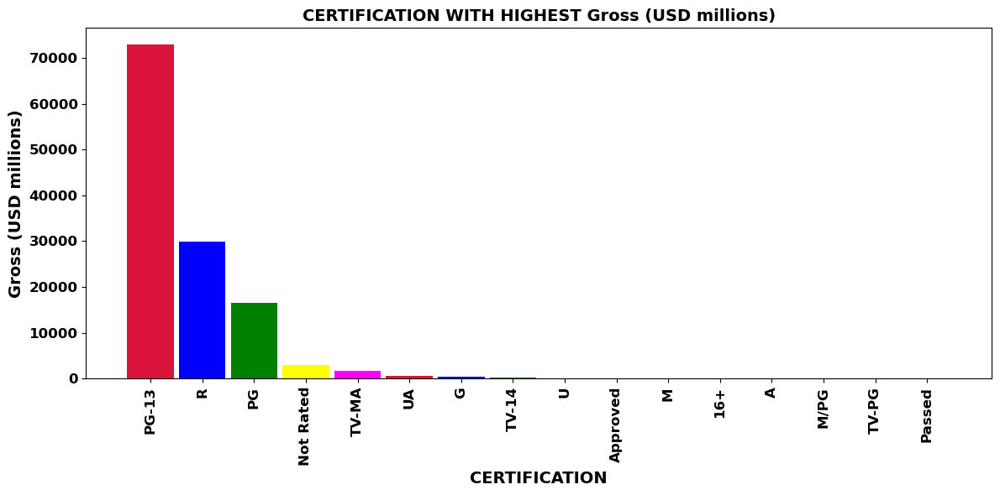

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross colleced for movies with certification PG-13
- The least gross collected for movies with certification PASSED
------------------------------------------------------------------------------------------------------------------------------


In [111]:
plot_data= dfv_0.groupby(['Certification'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Certification'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("CERTIFICATION WITH HIGHEST Gross (USD millions)",fontsize=14, fontweight='bold')
plt.xlabel("CERTIFICATION", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross colleced for movies with certification "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies with certification "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Certification" Vs "Gross Collection":

- **The highest gross colleced for movies with certification PG-13**
- **The least gross collected for movies with certification PASSED**
- **This means that PG-13 certified movies have more commerical success or has more total box office revenue where as PASSED certified movies are having least commercial success or has least total box office revenue**

### STARS WITH HIGHEST GROSS COLLECTION ("STAR" VS "GROSS COLLECTION") IN ENTIRE DATASET

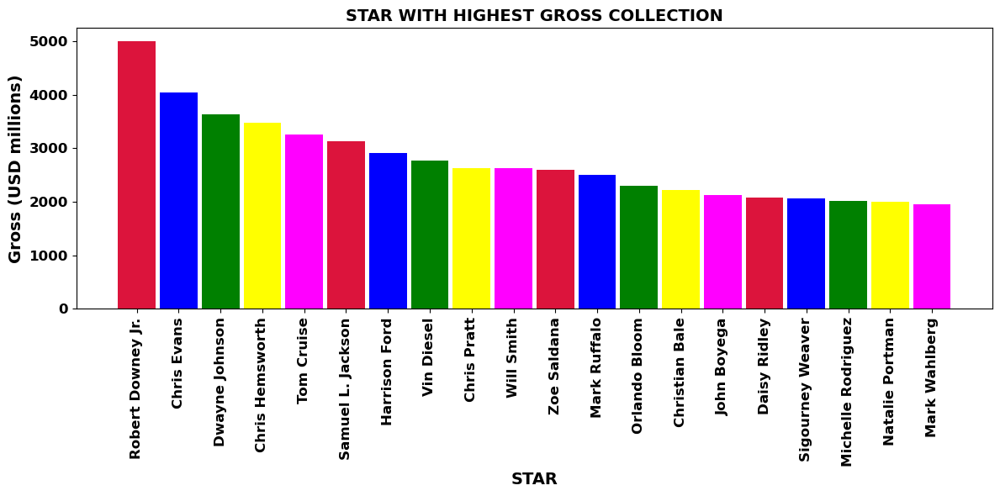

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of Gross (USD millions) received for movies that are acted by ROBERT DOWNEY JR.
- The less total number of Gross (USD millions) received for movies that are acted by JAN JOSEF LIEFERS
------------------------------------------------------------------------------------------------------------------------------


In [112]:
# As Star has 4 columns, combining Star 1 to Star 4 columns using melt function so that
# I can plot Gross (USD millions) Vs Star Name for the entire dataset

# Reshape the dataframe using melt to combine Star 1 to Star 4 columns
melted_df = df.melt(value_vars=['Star 1', 'Star 2', 'Star 3', 'Star 4'],
                    id_vars='Gross (USD millions)',
                    value_name='Star').dropna()

# Group the data by unique Star names and sum the Gross (USD millions) for each Star
plot_data = melted_df.groupby('Star')['Gross (USD millions)'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Star')['Gross (USD millions)'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STAR WITH HIGHEST GROSS COLLECTION",fontsize=14, fontweight='bold')
plt.xlabel("STAR", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of Gross (USD millions) received for movies that are acted by "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of Gross (USD millions) received for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper() +'\033[0m')
print("--"*63)

### Observations with "Star" Vs "Gross Collection":

- **The highest gross collected for movies that are acted by ROBERT DOWNEY JR. in the entire dataset**
- **The least gross collected for movies that are acted by JAN JOSEF LIEFERS in 'Star 1' column in the entire dataset**
- **This means that ROBERT DOWNEY JR. movies have more commerical success or has more total box office revenue where as JAN JOSEF LIEFERS movies are having least commercial success or has least total box office revenue in the entire dataset**

### STARS WITH HIGHEST GROSS COLLECTION ("STAR1" VS "GROSS COLLECTION")

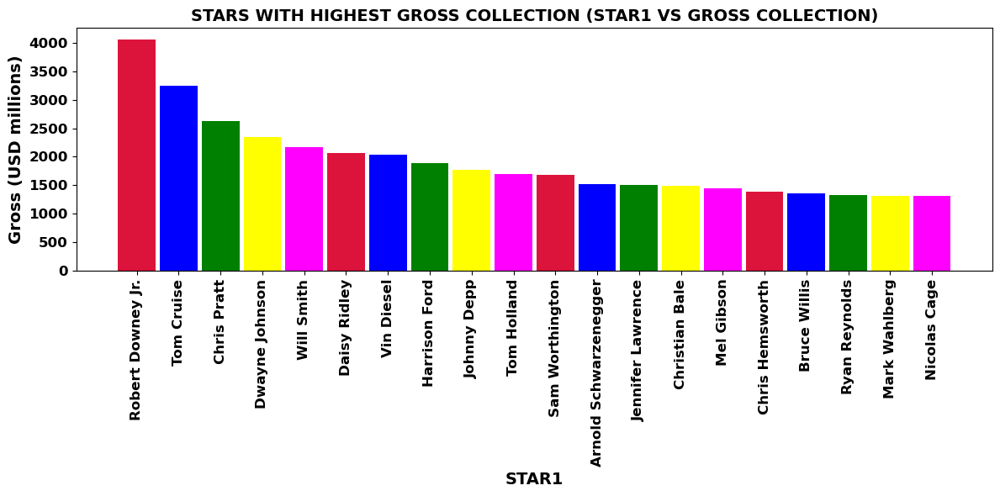

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies that are acted by ROBERT DOWNEY JR. in 'Star 1' column
- The least gross collected for movies that are acted by STEVE AUSTIN in 'Star 1' column
------------------------------------------------------------------------------------------------------------------------------


In [113]:
plot_data= dfv_0.groupby(['Star 1'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 1'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST GROSS COLLECTION (STAR1 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("STAR1", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies that are acted by "+ data.index[0].upper() + " in 'Star 1' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 1' column" +'\033[0m')
print("--"*63)

### Observations with "Star 1" Vs "Gross Collection":

- **The highest gross collected for movies that are acted by ROBERT DOWNEY JR. in 'Star 1' column**
- **The least gross collected for movies that are acted by STEVE AUSTIN in 'Star 1' column**
- **This means that ROBERT DOWNEY JR. movies have more commerical success or has more total box office revenue where as STEVE AUSTIN movies are having least commercial success or has least total box office revenue**

### STARS WITH HIGHEST GROSS COLLECTION ("STAR2" VS "GROSS COLLECTION")

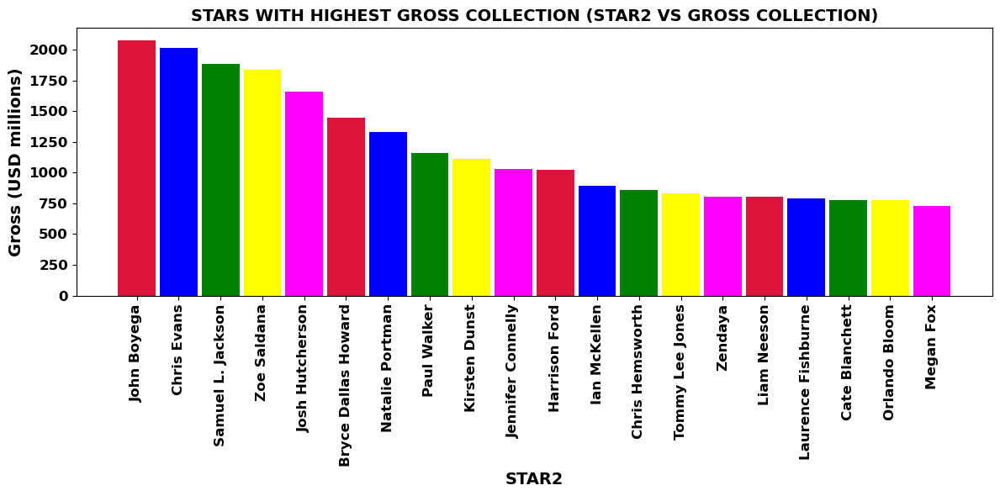

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies that are acted by JOHN BOYEGA in 'Star 2' column
- The least gross collected for movies that are acted by MICHAEL ANGARANO in 'Star 2' column
------------------------------------------------------------------------------------------------------------------------------


In [114]:
plot_data= dfv_0.groupby(['Star 2'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 2'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST GROSS COLLECTION (STAR2 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("STAR2", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies that are acted by "+ data.index[0].upper() + " in 'Star 2' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 2' column" +'\033[0m')
print("--"*63)

### Observations with "Star 2" Vs "Gross Collection":

- **The highest gross collected for movies that are acted by JOHN BOYEGA in 'Star 2' column**
- **The least gross collected for movies that are acted by MICHAEL ANGARANO in 'Star 2' column**
- **This means that JOHN BOYEGA movies have more commerical success or has more total box office revenue where as MICHAEL ANGARANO movies are having least commercial success or has least total box office revenue**

### STARS WITH HIGHEST GROSS COLLECTION ("STAR3" VS "GROSS COLLECTION")

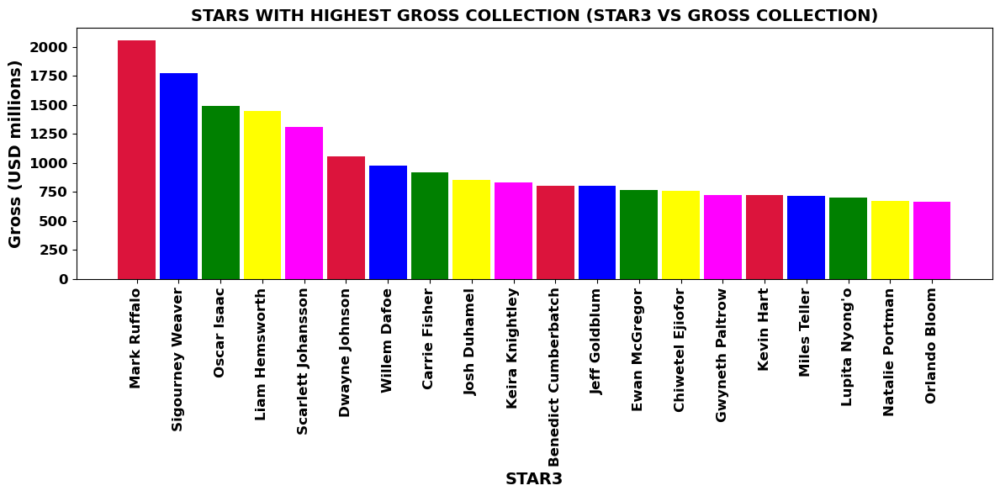

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies that are acted by MARK RUFFALO in 'Star 3' column
- The least gross collected for movies that are acted by THIERRY VAN WERVEKE in 'Star 3' column
------------------------------------------------------------------------------------------------------------------------------


In [115]:
plot_data= dfv_0.groupby(['Star 3'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 3'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST GROSS COLLECTION (STAR3 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("STAR3", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies that are acted by "+ data.index[0].upper() + " in 'Star 3' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 3' column" +'\033[0m')
print("--"*63)

### Observations with "Star 3" Vs "Gross Collection":

- **The highest gross collected for movies that are acted by MARK RUFFALO in 'Star 3' column**
- **The least gross collected for movies that are acted by THIERRY VAN WERVEKE in 'Star 3' column**
- **This means that MARK RUFFALO movies have more commerical success or has more total box office revenue where as THIERRY VAN WERVEKE movies are having least commercial success or has least total box office revenue**

### STARS WITH HIGHEST GROSS COLLECTION ("STAR4" VS "GROSS COLLECTION")

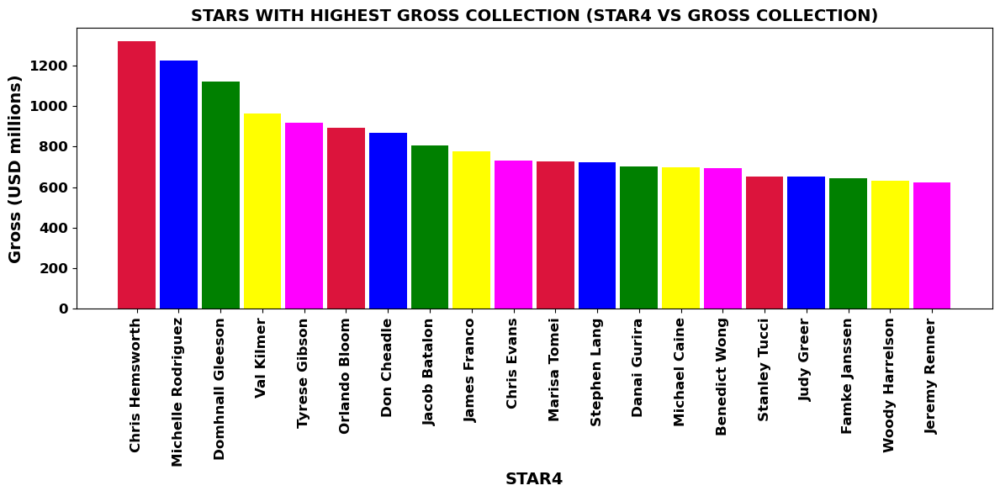

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies that are acted by CHRIS HEMSWORTH in 'Star 4' column
- The least gross collected for movies that are acted by ROBERT MAMMONE in 'Star 4' column
------------------------------------------------------------------------------------------------------------------------------


In [116]:
plot_data= dfv_0.groupby(['Star 4'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfv_0.groupby(['Star 4'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("STARS WITH HIGHEST GROSS COLLECTION (STAR4 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("STAR4", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies that are acted by "+ data.index[0].upper() + " in 'Star 4' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies that are acted by "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Star 4' column" +'\033[0m')
print("--"*63)

### Observations with "Star 4" Vs "Gross Collection":

- **The highest gross collected for movies that are acted by CHRIS HEMSWORTH in 'Star 4' column**
- **The least gross collected for movies that are acted by ROBERT MAMMONE in 'Star 4' column**
- **This means that CHRIS HEMSWORTH movies have more commerical success or has more total box office revenue where as ROBERT MAMMONE movies are having least commercial success or has least total box office revenue**

### GENRES WITH HIGHEST GROSS COLLECTION ("GENRE" VS "GROSS COLLECTION") IN ENTIRE DATASET

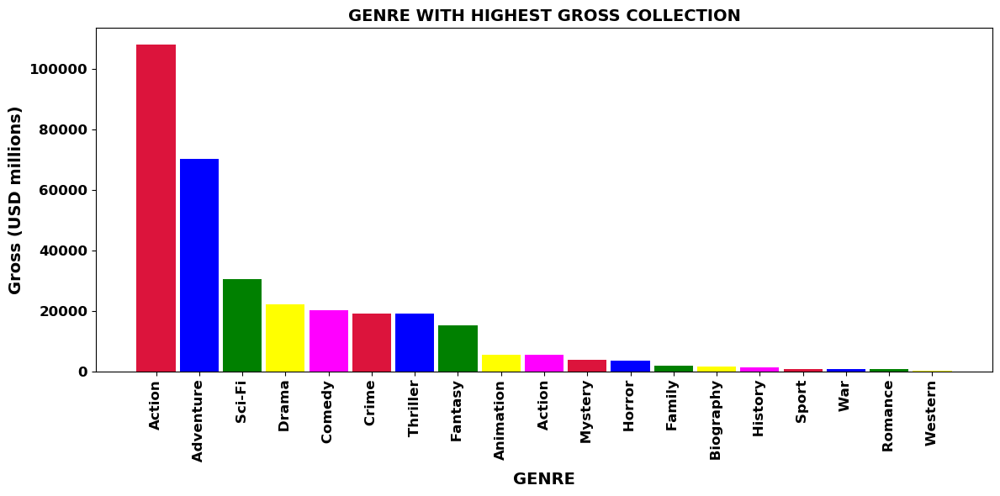

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest total number of Gross (USD millions) received for movies with genre ACTION
- The less total number of Gross (USD millions) received for movies with genre  MUSIC
------------------------------------------------------------------------------------------------------------------------------


In [117]:
# As Genre has 3 columns, combining Genre1 to Genre 3 columns using melt function so that
# I can plot Gross (USD millions) Vs Genre for the entire dataset

# Reshape the dataframe using melt to combine Genre1 to Genre3 columns
melted_df = df.melt(value_vars=['Genre1', 'Genre2', 'Genre3'],
                    id_vars='Gross (USD millions)',
                    value_name='Genre').dropna()

# Group the data by unique Genrenames and sum the Gross (USD millions) for each Genre
plot_data = melted_df.groupby('Genre')['Gross (USD millions)'].sum().sort_values(ascending=False)
data1 = melted_df.groupby('Genre')['Gross (USD millions)'].sum().sort_values(ascending=False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST GROSS COLLECTION",fontsize=14, fontweight='bold')
plt.xlabel("GENRE", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest total number of Gross (USD millions) received for movies with genre "+ data.index[0].upper() +'\033[0m')
print('\033[1m'+ "- The less total number of Gross (USD millions) received for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+'\033[0m')
print("--"*63)

### Observations with "Genre1" Vs Gross Collection":

- **The highest gross collected for movies wigh genre ACTION in the entire dataset**
- **The least gross collected for movies with genre MUSIC in the entire dataset**
- **This means that movies with genre ACTION have more commerical success or has more total box office revenue where as movies with genre MUSIC are having least commercial success or has least total box office revenue in the entire dataset**

### GENRES WITH HIGHEST GROSS COLLECTION ("GENRE1" VS "GROSS COLLECTION")

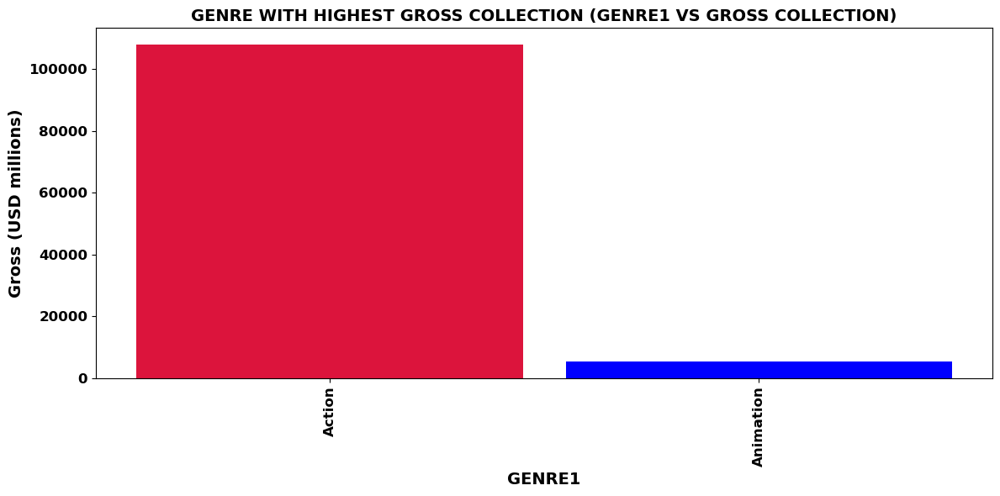

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies wigh genre ACTION in 'Genre1' column
- The least gross collected for movies with genre ANIMATION in 'Genre1' column
------------------------------------------------------------------------------------------------------------------------------


In [118]:
plot_data= dfg_0.groupby(['Genre1'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Genre1'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST GROSS COLLECTION (GENRE1 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE1", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies wigh genre "+ data.index[0].upper() + " in 'Genre1' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre1' column" +'\033[0m')
print("--"*63)

### Observations with "Genre1" Vs Gross Collection":

- **The highest gross collected for movies wigh genre ACTION in 'Genre1' column**
- **The least gross collected for movies with genre ANIMATION in 'Genre1' column**
- **This means that movies with genre ACTION have more commerical success or has more total box office revenue where as movies with genre ANIMATION are having least commercial success or has least total box office revenue**

### GENRES WITH HIGHEST GROSS COLLECTION ("GENRE2" VS "GROSS COLLECTION")

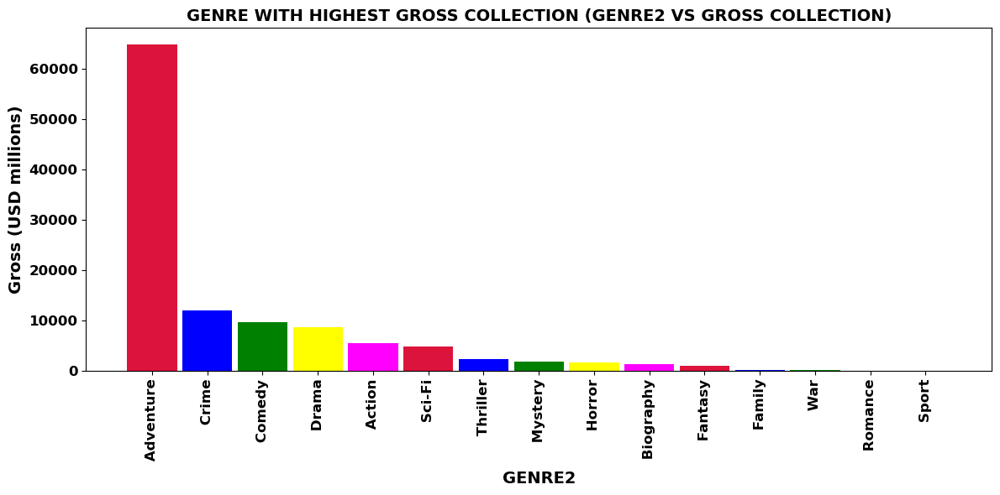

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies wigh genre  ADVENTURE in 'Genre2' column
- The least gross collected for movies with genre  SPORT in 'Genre2' column
------------------------------------------------------------------------------------------------------------------------------


In [119]:
plot_data= dfg_0.groupby(['Genre2'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Genre2'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST GROSS COLLECTION (GENRE2 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE2", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies wigh genre "+ data.index[0].upper() + " in 'Genre2' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre2' column" +'\033[0m')
print("--"*63)

### Observations with "Genre2" Vs Gross Collection":

- **The highest gross collected for movies wigh genre ADVENTURE in 'Genre2' column**
- **The least gross collected for movies with genre  SPORT in 'Genre2' column**
- **This means that movies with genre ADVENTURE have more commerical success or has more total box office revenue where as movies with genre  SPORT are having least commercial success or has least total box office revenue**

### GENRES WITH HIGHEST GROSS COLLECTION ("GENRE3" VS "GROSS COLLECTION")

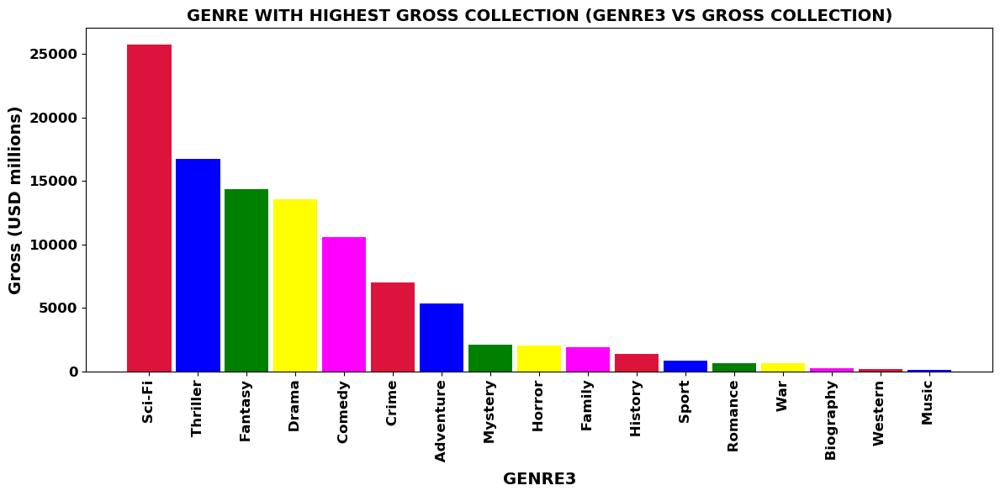

Observations:
------------------------------------------------------------------------------------------------------------------------------
- The highest gross collected for movies wigh genre  SCI-FI in 'Genre3' column
- The least gross collected for movies with genre  MUSIC in 'Genre3' column
------------------------------------------------------------------------------------------------------------------------------


In [120]:
plot_data= dfg_0.groupby(['Genre3'])["Gross (USD millions)"].sum().sort_values(ascending =False)
data1 = dfg_0.groupby(['Genre3'])["Gross (USD millions)"].sum().sort_values(ascending =False)[:20]
data = data1[data1.index != 'Others']
plt.figure(figsize=(12,6))
plt.bar(data=data ,x = data.index , height = data.values, width=0.9, color = ['crimson','blue','green', 'yellow', 'magenta'])
plt.title("GENRE WITH HIGHEST GROSS COLLECTION (GENRE3 VS GROSS COLLECTION)",fontsize=14, fontweight='bold')
plt.xlabel("GENRE3", fontsize=14,fontweight='bold')
plt.ylabel("Gross (USD millions)", fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()
    
print('\033[1m'+ "Observations:" +'\033[0m')
print("--"*63)
print('\033[1m'+ "- The highest gross collected for movies wigh genre "+ data.index[0].upper() + " in 'Genre3' column" +'\033[0m')
print('\033[1m'+ "- The least gross collected for movies with genre "+ plot_data.iloc[-1:].index[0].upper()+ " in 'Genre3' column" +'\033[0m')
print("--"*63)

### Observations with "Genre3" Vs Gross Collection":

- **The highest gross collected for movies wigh genre SCI-FI in 'Genre3' column**
- **The least gross collected for movies with genre MUSIC in 'Genre3' column**
- **This means that movies with genre SCI-FI have more commerical success or has more total box office revenue where as movies with genre MUSIC are having least commercial success or has least total box office revenue**

In [121]:
#df_numerical=['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres','Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity']

<span style="color:brown; font-weight:bold; font-size:24px;">Bivariate Graphical Analysis for Numerical data</span>

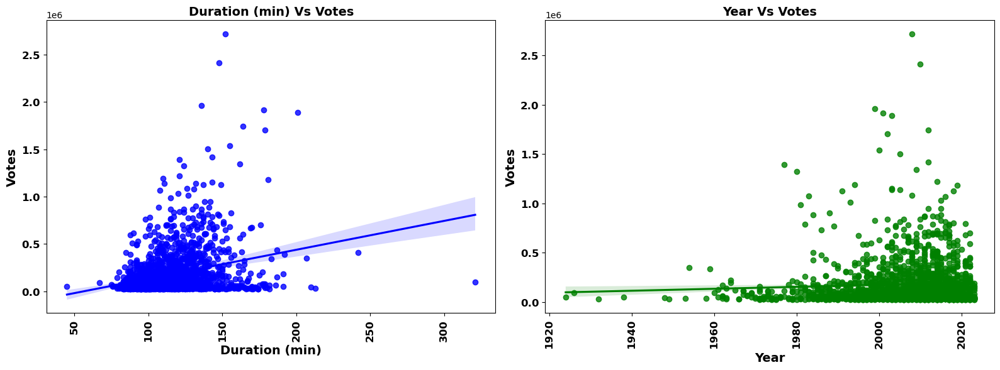

In [122]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Duration (min)', y='Votes',color='b')
plt.title('Duration (min) Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Duration (min)', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Year', y='Votes',color='g')
plt.title('Year Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are increasing with increase in duration however max no. of votes are noticed between 100 to 160 min duration**
- **No. of votes are increasing with increase in year however max no. of votes are noticed between years 2000 to 2022; this also indicates that more no. of movies are made in the recent years hence we had more data on the votes and this also could tell that there is easy way for audience to give Vote due to more approachability towards internet in recent years**

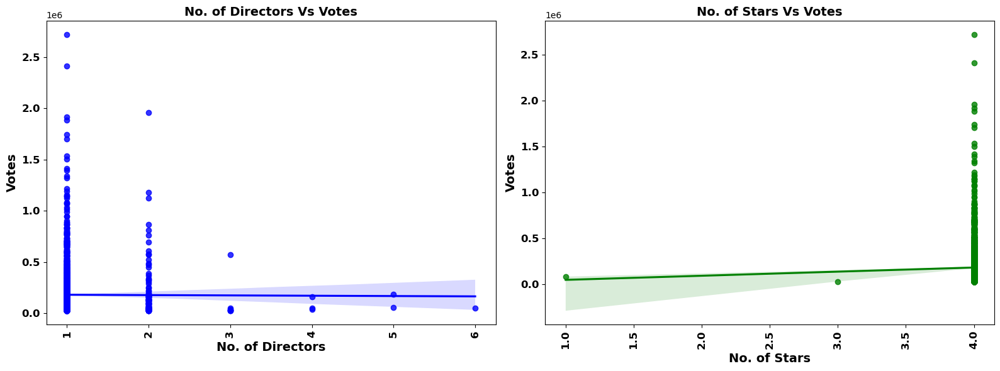

In [123]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='No. of Directors', y='Votes',color='b')
plt.title('No. of Directors Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('No. of Directors', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='No. of Stars', y='Votes',color='g')
plt.title('No. of Stars Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('No. of Stars', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are more when the movie was made with 1 or 2 directors; this make more sense as there will be no multiple thougths coming into picture when movie was made with less no. of directors**
- **No. of votes are more when the no. of starts 4; this clearly indicates that there is more movie popularity if the no. of stars are increasing**

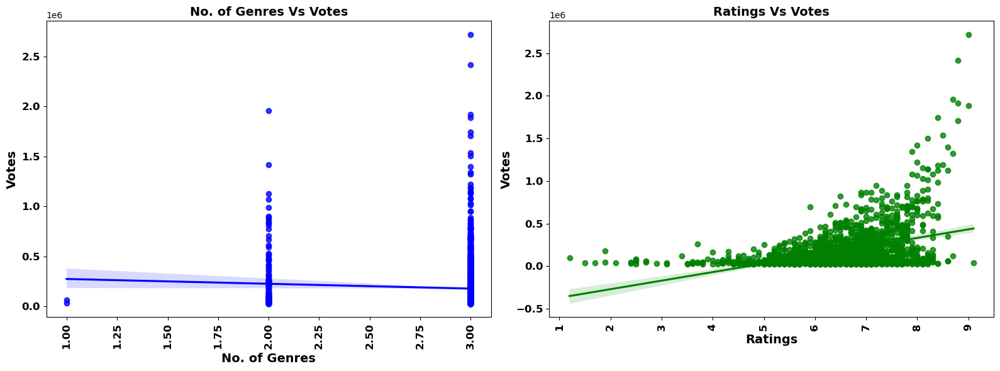

In [124]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='No. of Genres', y='Votes',color='b')
plt.title('No. of Genres Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('No. of Genres', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Ratings', y='Votes',color='g')
plt.title('Ratings Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Ratings', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are more when the movie was made with 2 or 3 genres; this clearly indicates that film lovers likes to watch movies with more variety in the movies instead of single genre**
- **No. of votes are increasing with increase in ratings of the movies; however we see more no. of votes between ratings 5 and 8**

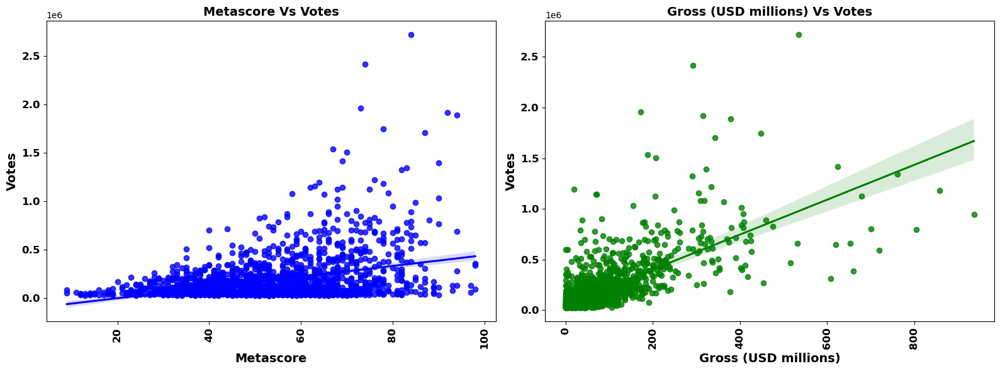

In [125]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Metascore', y='Votes',color='b')
plt.title('Metascore Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Metascore', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Gross (USD millions)', y='Votes',color='g')
plt.title('Gross (USD millions) Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are increasing with increase in metascore however max no. of votes are noticed between 40 and 80 metascore**
- **No. of votes are increasing with increase in gross collection however max no. of votes are noticed between 0 to 300 million dollars gross collection; this shows that whenever votes are more, there is increase in gross collection that means more interest to watch the movie but interestingly there are not many movies with gross collection crossing beyond 350 million dollars**

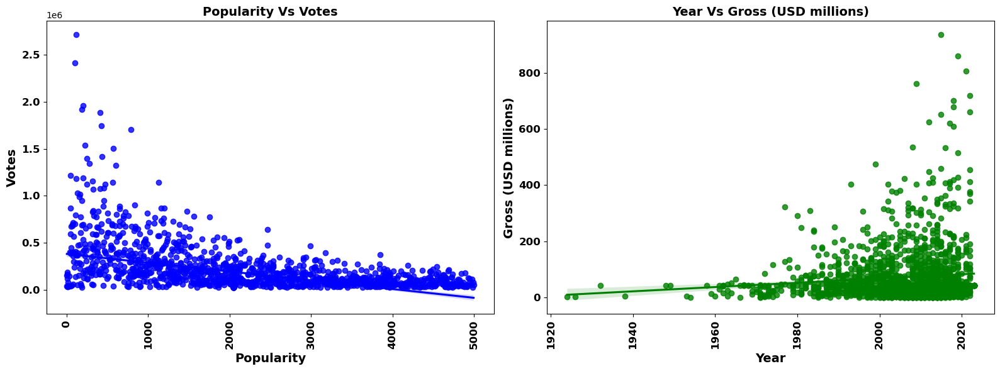

In [126]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Popularity', y='Votes',color='b')
plt.title('Popularity Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Popularity', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Year', y='Gross (USD millions)',color='g')
plt.title('Year Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are decreasing with increse in poplularity**
- **Gross collection is increasing over the recent years; this could be due to quality film making with better technology or due to more unique thoughts by directors in the film making or due to popularity of stars and directors**

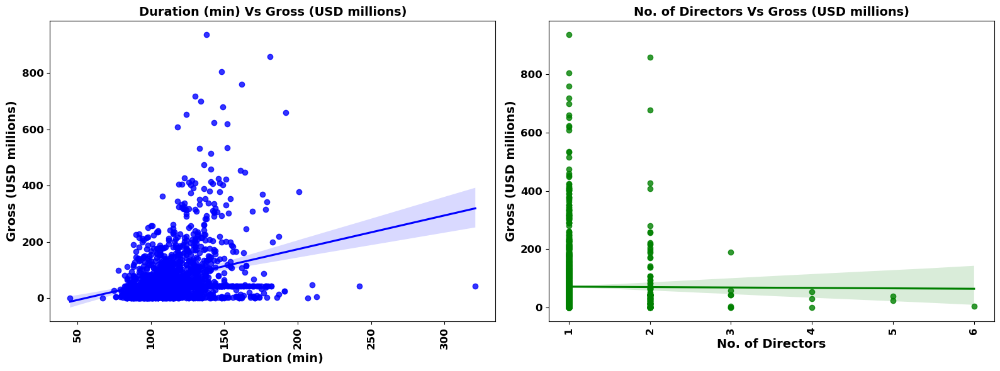

In [127]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Duration (min)', y='Gross (USD millions)',color='b')
plt.title('Duration (min) Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('Duration (min)', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='No. of Directors', y='Gross (USD millions)',color='g')
plt.title('No. of Directors Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('No. of Directors', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **Gross collection is increasing with duration of a movie however it is more constrained between 80 to 150 min duration**
- **Gross collection is more when the no. of directors are 1 or 2; this clearly indicates that there could be unique thoughts when the no. of directors are less and avoiding deviated multiple thoughts**

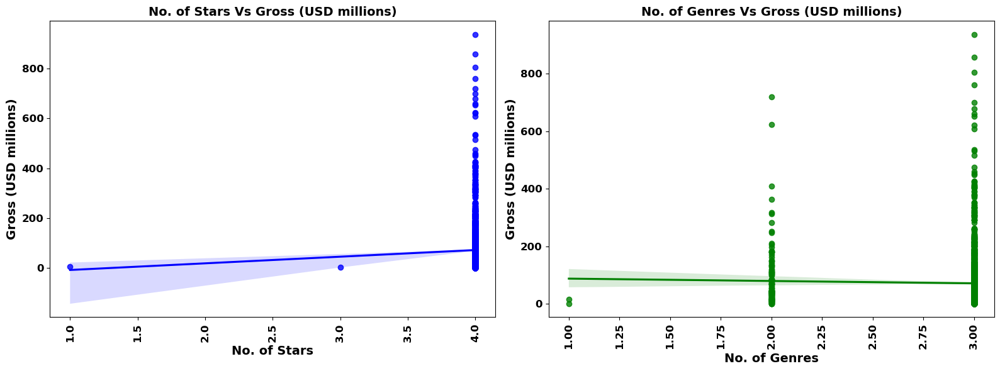

In [128]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='No. of Stars', y='Gross (USD millions)',color='b')
plt.title('No. of Stars Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('No. of Stars', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='No. of Genres', y='Gross (USD millions)',color='g')
plt.title('No. of Genres Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('No. of Genres', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **Gross collection is more when the no. of stars are 4. This indicates stars popularity on overal box office collection**
- **Gross collection is more when the no. of genres are 2 or 3; this clearly indicates that film lovers likes to watch movies with more variety in the movies instead of single genre**

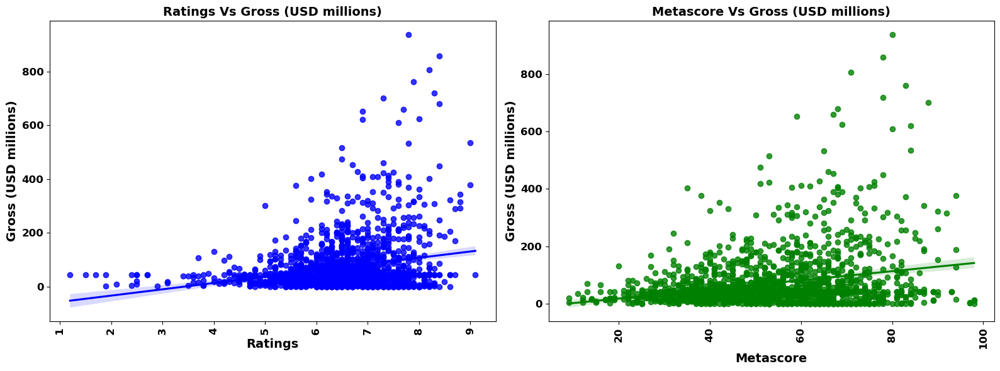

In [129]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Ratings', y='Gross (USD millions)',color='b')
plt.title('Ratings Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('Ratings', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Metascore', y='Gross (USD millions)',color='g')
plt.title('Metascore Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('Metascore', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **Gross collection is more when the ratings are more and metascore is more. This indicates that popularity of the movie impacts the box office collection directly**

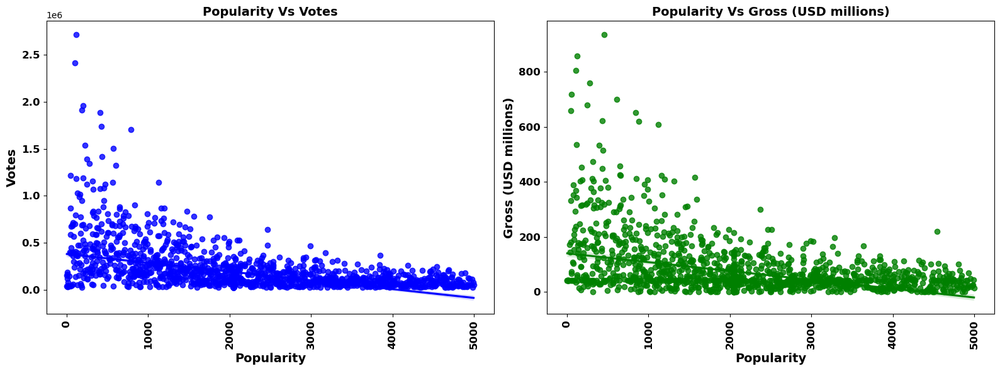

In [130]:
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.regplot(data=dfv_0,x='Popularity', y='Votes',color='b')
plt.title('Popularity Vs Votes',fontsize=14, fontweight='bold')
plt.xlabel('Popularity', fontsize=14,fontweight='bold')
plt.ylabel('Votes', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.subplot(1,2,2)
sns.regplot(data=dfv_0,x='Popularity', y='Gross (USD millions)',color='g')
plt.title('Popularity Vs Gross (USD millions)',fontsize=14, fontweight='bold')
plt.xlabel('Popularity', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold',rotation=90)
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.show()

### Observations:

- **No. of votes are decreasing with increase in poplularity score of the movie**
- **Gross collection is decreasing with increasing in popularity score of the movie**
- **It seems like votes and popularity are not directly proportional because popularity metric considers various factors like page views, user interactions, and search queries to determine the relative popularity of a movie within the IMDb platform. It takes into account the overall traffic and engagement associated with a movie's IMDb page where as Votes represent the number of users who have rated a particular movie. The vote count can provide an indication of the movie's popularity and the level of engagement it has generated among IMDb users. This means that popularity considers the diversified opinions and votes consider just user ratings hence the relation can be non-linear between these two**

<span style="color:brown; font-weight:bold; font-size:24px;">Multivariate Graphical Analysis</span>

In [131]:
#df_numerical=['Duration (min)', 'Year', 'Votes', 'No. of Directors', 'No. of Stars', 'No. of Genres','Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity']

In [132]:
#df_categorical=['Director 1','Director 2','Director 3','Director 4','Director 5','Director 6','Certification','Star 1','Star 2','Star 3','Star 4','Genre1','Genre2','Genre3']

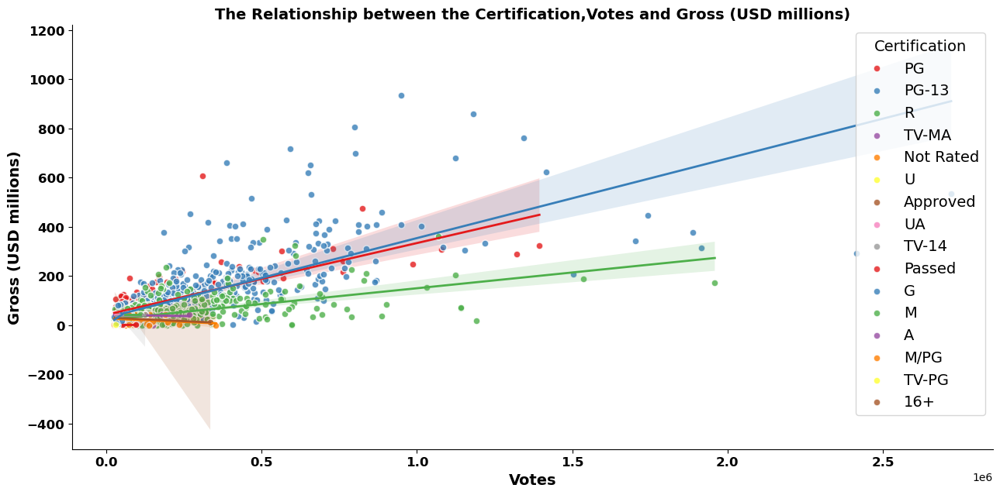

In [133]:
sns.lmplot(x='Votes',y='Gross (USD millions)',hue='Certification',data= dfv_0, height=6.5, aspect=2,line_kws={'linewidth':2},palette = 'Set1',scatter_kws={"s": 40,'edgecolor':'w'},legend=False)
plt.title('The Relationship between the Certification,Votes and Gross (USD millions)',fontsize=14,fontweight ='bold')
plt.xlabel('Votes', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.legend(title='Certification', fontsize='14', title_fontsize='14',loc="upper right", frameon=True)
plt.tight_layout()
plt.show()

#### Observations:
- **Gross collection is increasing with increase in no. of votes for most of the different certified movies**
- **Interestingly, PG-13 movies have collected more votes and gross compared to remaining certified types**

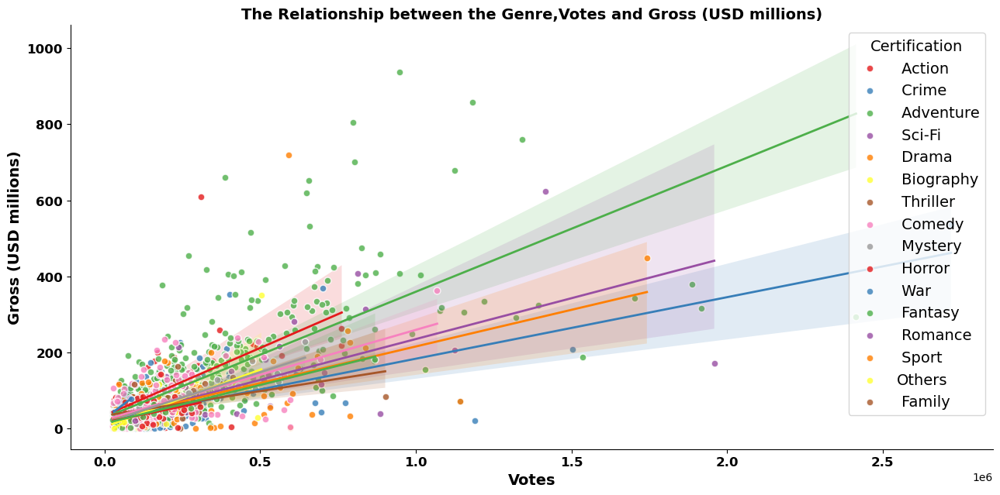

In [134]:
sns.lmplot(x='Votes',y='Gross (USD millions)',hue='Genre2',data= dfv_0, height=6.5, aspect=2,line_kws={'linewidth':2},palette = 'Set1',scatter_kws={"s": 40,'edgecolor':'w'},legend=False)
plt.title('The Relationship between the Genre,Votes and Gross (USD millions)',fontsize=14,fontweight ='bold')
plt.xlabel('Votes', fontsize=14,fontweight='bold')
plt.ylabel('Gross (USD millions)', fontsize=14,fontweight='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.legend(title='Certification', fontsize='14', title_fontsize='14',loc="upper right", frameon=True)
plt.tight_layout()
plt.show()

#### Observations:
- **Gross collection is increasing with increase in no. of votes for most of the different genre movies**
- **Adenture and Crime movies have more votes and gross collection is more for these type of certified movies**

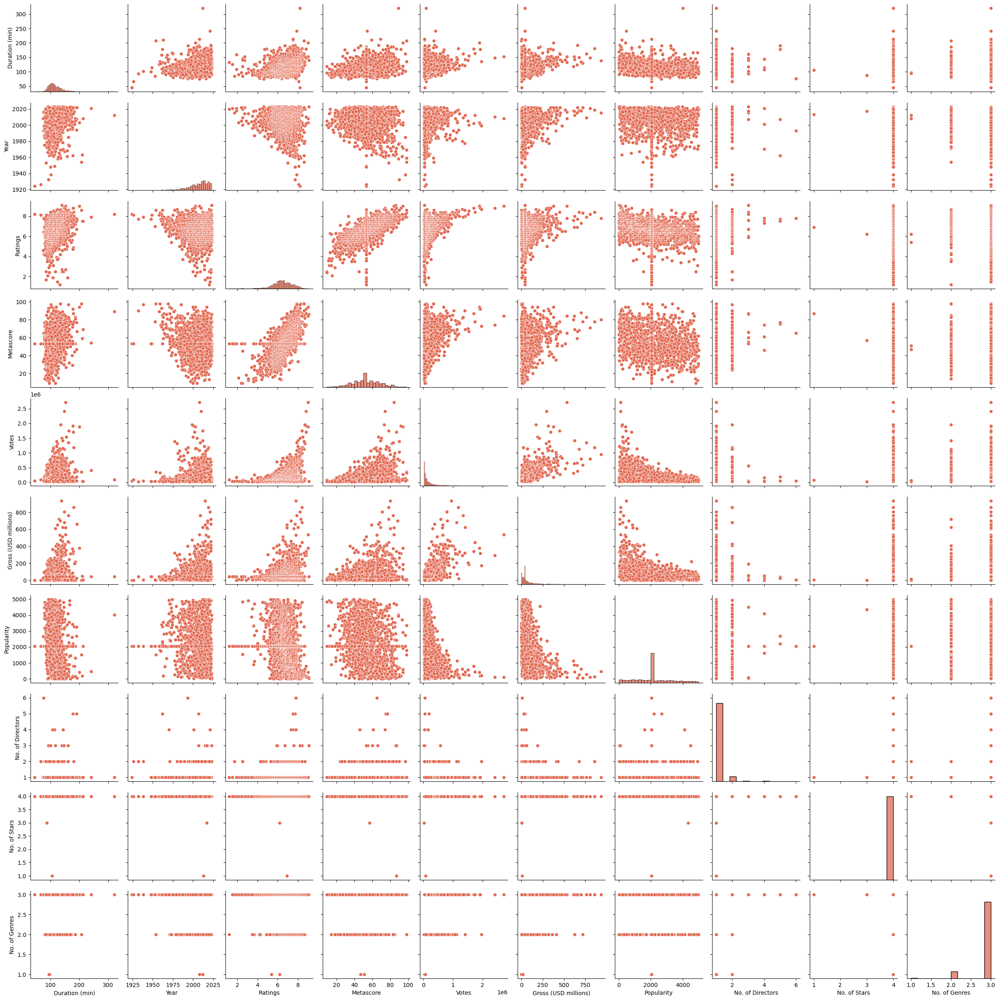

In [135]:
sns.pairplot(dfv_0)

<span style="color:brown; font-weight:bold; font-size:24px;">** Remainig EDA for dataframe with target variable "GROSS COLLECTION"  **</span>

## Checking coefficients of correlation (r) - "Gross Collection" as Target Variable

In [136]:
dfg_2.head() # Using the imputed dataset

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres,Gross (USD millions)
0,126.0,2014.0,6.1,35.0,532.0,50.0,6.0,5.0,2.0,1.0,187818.0,5.0,526.0,392.0,485.0,64.0,0.0,1.0,14.0,2300.0,1.0,4.0,3.0,39.32
1,128.0,2016.0,7.3,51.0,243.0,50.0,6.0,5.0,2.0,1.0,305541.0,7.0,38.0,53.0,415.0,547.0,0.0,13.0,17.0,370.0,1.0,4.0,2.0,86.26
2,104.0,2008.0,6.0,51.0,524.0,50.0,6.0,5.0,2.0,1.0,171553.0,5.0,242.0,776.0,781.0,347.0,0.0,1.0,14.0,4481.0,1.0,4.0,3.0,31.72
3,104.0,2003.0,6.6,59.0,548.0,50.0,6.0,5.0,2.0,1.0,110187.0,5.0,145.0,833.0,184.0,980.0,0.0,1.0,2.0,1912.0,1.0,4.0,3.0,47.73
4,90.0,2011.0,4.0,22.0,162.0,50.0,6.0,5.0,2.0,1.0,26627.0,5.0,488.0,236.0,166.0,598.0,0.0,1.0,8.0,1977.0,1.0,4.0,3.0,18.87


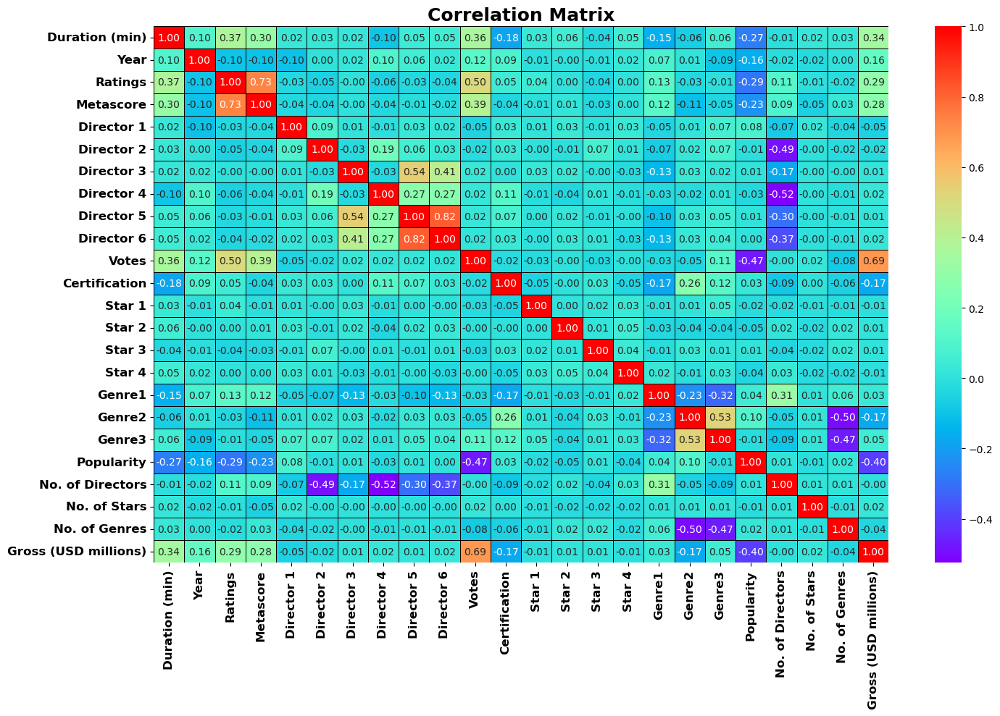

In [137]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r=dfg_2.corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_r,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix.jpg")
plt.show()

## Checking Correlations with Target Variable - "Gross Collection"

In [138]:
df_cr1=dfg_2.copy()

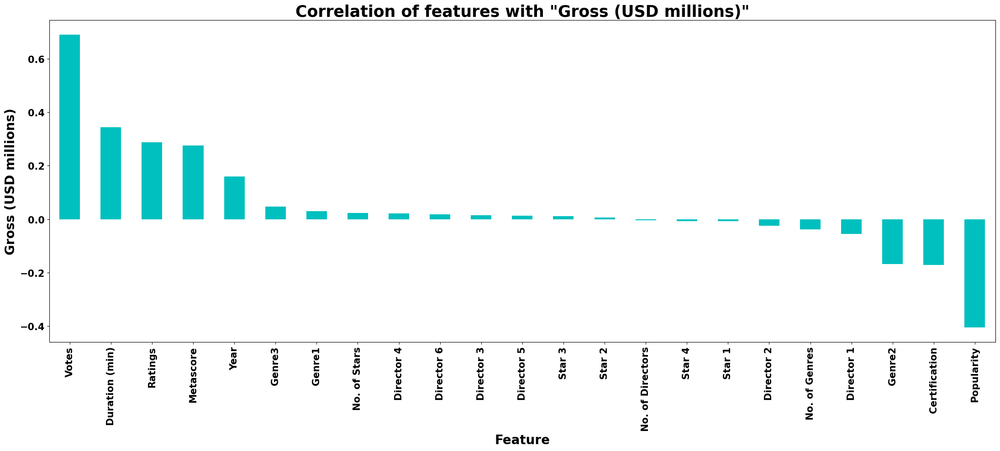

In [139]:
# Plotting the relationship of target variable with other variables in descending order
plt.figure(figsize=(22,10))
corr_r['Gross (USD millions)'].sort_values(ascending=False).drop(['Gross (USD millions)']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=20,fontweight='bold')
plt.ylabel('Gross (USD millions)',fontsize=20,fontweight='bold')
plt.title('Correlation of features with "Gross (USD millions)"',fontsize=25,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

In [140]:
corr_r['Gross (USD millions)'].sort_values(ascending=False) 

Gross (USD millions)    1.000000
Votes                   0.690096
Duration (min)          0.343496
Ratings                 0.288013
Metascore               0.275993
Year                    0.159775
Genre3                  0.047392
Genre1                  0.029810
No. of Stars            0.023081
Director 4              0.021548
Director 6              0.018123
Director 3              0.014858
Director 5              0.013342
Star 3                  0.010435
Star 2                  0.005765
No. of Directors       -0.004079
Star 4                 -0.006861
Star 1                 -0.007658
Director 2             -0.024675
No. of Genres          -0.037435
Director 1             -0.054779
Genre2                 -0.168752
Certification          -0.172079
Popularity             -0.404978
Name: Gross (USD millions), dtype: float64

#### Observations for target variable 'Gross (USD millions)':

- **There are multiple features with weak and very weak corrleations**
- **Max +ve correlation: 'Votes'** 
- **Max -ve correlation: 'Popularity'**
- **Typically we consider the coefficient of correlation between -0.3 to 0.3 as weak correlation**
- **Considering -0.04 to 0.04 range as very weak correlation with target variable in this project. Idenfied features within this range are Genre1, No. of Stars, Director 4, Director 6, Director 3, Director 5, Star 3, Star 2, No. of Directors, Star 4, Star 1, Director 2, No. of Genres**
- **I will check feature scores from SelectKBest algorithm with f-regression test and also with feature importance using ExtraTreeRegressor, then will check if any features have lower score to take futher decisions.**

## Checking top features using SelectKBest algorithm - "Gross Collection"

In [141]:
#sklearn.feature_selection.f_regression
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression    # Using f_regression test


x=df_cr1.drop('Gross (USD millions)',axis=1)  # #independent columns
y=df_cr1['Gross (USD millions)']  # Output variable

#apply SelectKBest class to extract top best features
bestfeatures = SelectKBest(score_func=f_regression, k='all')
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
SelectKBest_scores=featureScores.nlargest(100,'Score')  #Top 100 features
SelectKBest_scores.reset_index(drop=True)  # displyaing top 100 features and scores

,Specs,Score
0,Votes,1335.678135
1,Popularity,288.192452
2,Duration (min),196.512553
3,Ratings,132.877943
4,Metascore,121.122714
5,Certification,44.826157
6,Genre2,43.059257
7,Year,38.483266
8,Director 1,4.421351
9,Genre3,3.306786


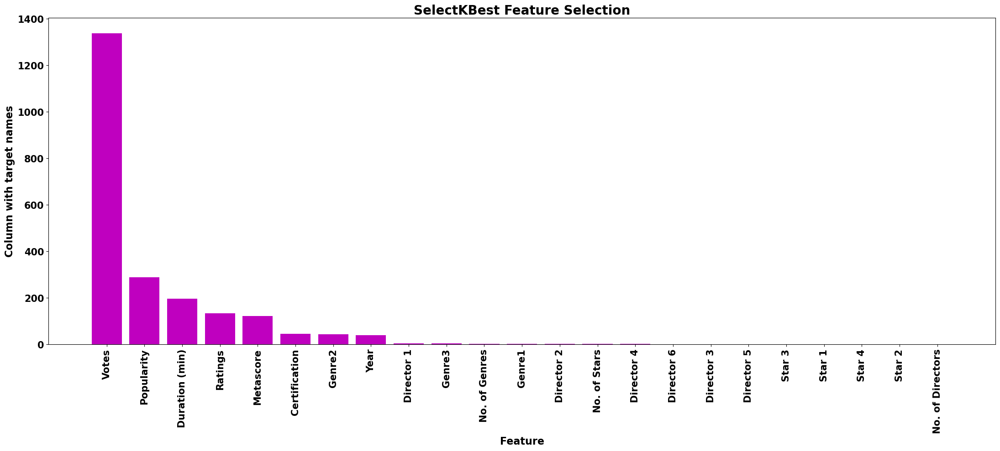

In [142]:
# Plotting the score values in descending order
df_sorted_desc= featureScores.sort_values('Score',ascending=False)
plt.figure(figsize=(22,10))
plt.bar('Specs','Score',data=df_sorted_desc,color='m')
plt.xlabel("Feature",fontsize=16,fontweight='bold')
plt.ylabel("Column with target names",fontsize=16,fontweight='bold')
plt.title("SelectKBest Feature Selection",fontsize=20,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

#### Observations for target variable 'Gross (USD millions)':

- **There are multiple features with lower feature scores (Director 1, Genre3, No. of Genres, Genre1, Director 2, No. of Stars, Director 4, Director 6, Director 3, Director 5, Star 3, Star 1, Star 4, Star 2, No. of Directors)**
- **Max feature score for: 'Votes'** 
- **Min feature score for: 'No. of Directors'**
- **I will also check feature scores with feature importance using ExtraTreeRegressor, then will check if any features have lower score to take futher decisions.**

## Checking top features using Feature Importance - Extra Tree Regressor

In [143]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt

x=df_cr1.drop('Gross (USD millions)',axis=1)  # #independent columns
y=df_cr1['Gross (USD millions)']  # Output variable

model = ExtraTreesRegressor()
model.fit(x,y)
dfscores = pd.DataFrame(model.feature_importances_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
Feature_Importance_scores=featureScores.nlargest(100,'Score')  #Top 100 features
Feature_Importance_scores.reset_index(drop=True)  # displyaing top 100 features and scores

,Specs,Score
0,Votes,0.393796
1,Popularity,0.145906
2,Certification,0.096978
3,Duration (min),0.060573
4,Year,0.044625
5,Ratings,0.034570
6,Genre2,0.030867
7,Metascore,0.030000
8,Star 1,0.026254
9,Star 4,0.023797


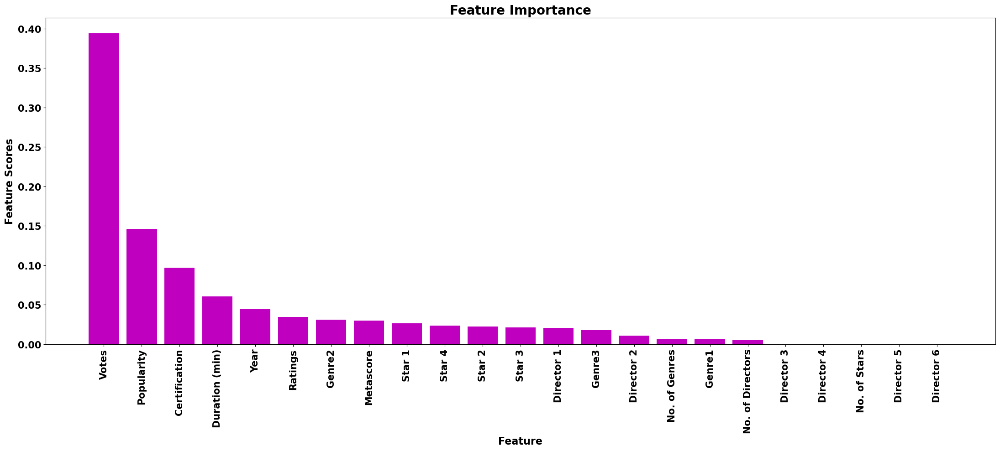

In [144]:
# Plotting the score values in descending order
df_sorted_desc= featureScores.sort_values('Score',ascending=False)
plt.figure(figsize=(22,10))
plt.bar('Specs','Score',data=df_sorted_desc,color='m')
plt.xlabel("Feature",fontsize=16,fontweight='bold')
plt.ylabel("Feature Scores",fontsize=16,fontweight='bold')
plt.title("Feature Importance",fontsize=20,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

#### Observations for target variable 'Gross (USD millions)':

- **There are multiple features with lower feature scores (No. of Genres,No. of Directors,Genre1,Director 3,Director 4,Director 5,No. of Stars,Director 6)**
- **Max feature score for: 'Votes'** 
- **Min feature score for: 'Director 6'**

### <u>Consolidated Observations for target variable 'Gross (USD millions)' from multiple feature selection techniques:<u>

- **Coefficient of Correlation: Features with weak correlations - Genre1, No. of Stars, Director 4, Director 6, Director 3, Director 5, Star 3, Star 2, No. of Directors, Star 4, Star 1, Director 2, No. of Genres**
- **SelectKBest: Features with lower scores - Director 1, Genre3, No. of Genres, Genre1, Director 2, No. of Stars, Director 4, Director 6, Director 3, Director 5, Star 3, Star 1, Star 4, Star 2, No. of Directors**
- **Feature Importance using ExtraTreeRegressor: Features with lower scores - No. of Genres, No. of Directors, Genre1, Director 3, Director 4, Director 5, No. of Stars, Director 6**

- **Based on from these three methods, I have decided to drop the columns which are commonly coming among them: "No. of Genres", "No. of Directors", "Genre1", "Director 3", "Director 4", "Director 5", "No. of Stars", "Director 6"**

In [145]:
dfg_3=dfg_2.drop(["No. of Genres", "No. of Directors", "Genre1", "Director 3", "Director 4", "Director 5", "No. of Stars", "Director 6"],axis=1)
dfg_3.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity,Gross (USD millions)
0,126.0,2014.0,6.1,35.0,532.0,50.0,187818.0,5.0,526.0,392.0,485.0,64.0,1.0,14.0,2300.0,39.32
1,128.0,2016.0,7.3,51.0,243.0,50.0,305541.0,7.0,38.0,53.0,415.0,547.0,13.0,17.0,370.0,86.26
2,104.0,2008.0,6.0,51.0,524.0,50.0,171553.0,5.0,242.0,776.0,781.0,347.0,1.0,14.0,4481.0,31.72


<span style="color:blue; font-weight:bold; font-size:26px;">Outliers Check</span>

In [146]:
# Segregating numerical data for checking outliers. 
# We check outliers only for X numerical data as it is applicable only for numerical data
dfg_numerical=dfg_3[['Duration (min)', 'Year', 'Ratings', 'Metascore', 'Votes', 'Popularity']].copy()
dfg_numerical.head(3)

,Duration (min),Year,Ratings,Metascore,Votes,Popularity
0,126.0,2014.0,6.1,35.0,187818.0,2300.0
1,128.0,2016.0,7.3,51.0,305541.0,370.0
2,104.0,2008.0,6.0,51.0,171553.0,4481.0


In [147]:
# We check outliers on X numerical data
df_outliers=dfg_numerical.copy()

In [148]:
df_outliers.shape

(1471, 6)

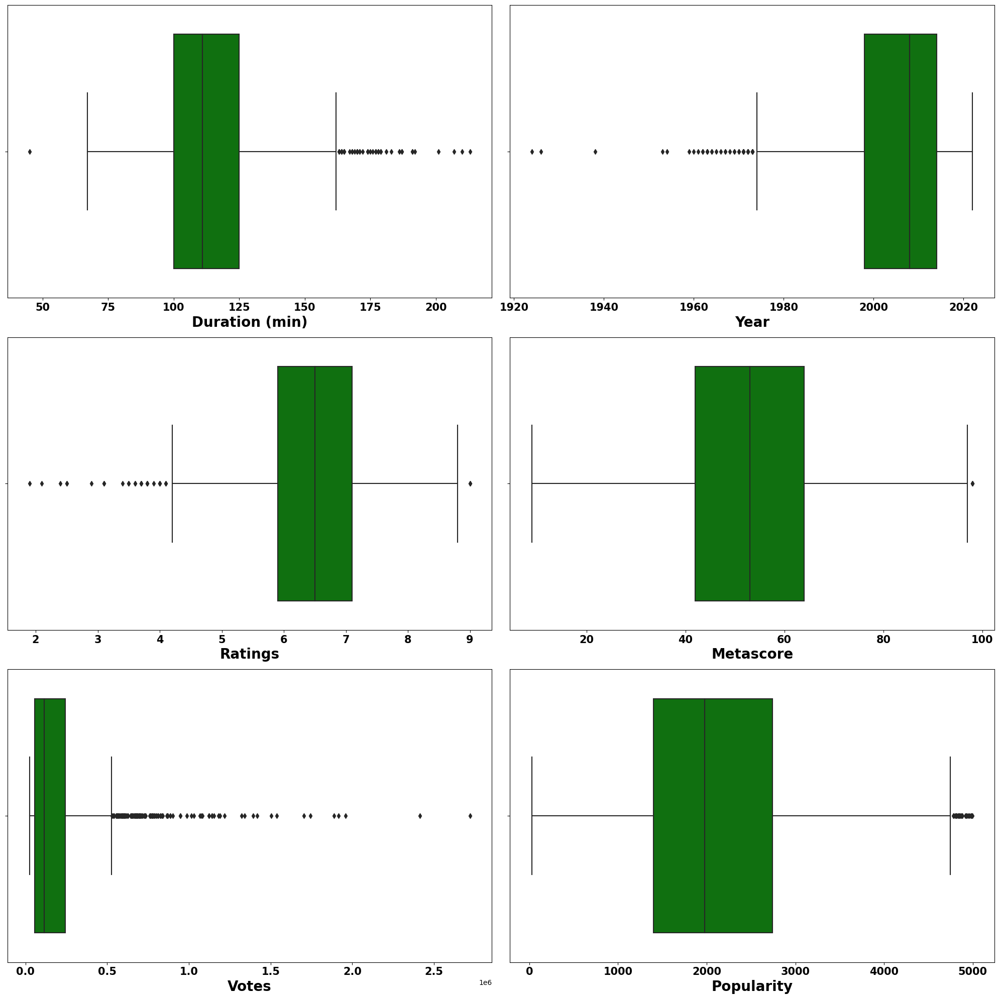

In [149]:
# Checking outliers visually before removing outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=20:
        ax=plt.subplot(3,2,plotnumber)
        sns.boxplot(dfg_numerical[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations:
- **Outliers are present in all the columns**

<span style="color:blue; font-weight:bold; font-size:26px;">Removing Outliers using z-score method</span>

In [150]:
df_outliers.shape

(1471, 6)

In [151]:
dfg_3.shape

(1471, 16)

In [152]:
# Calculating z score & identifying the rows and columns where absolute z score > 3

from scipy.stats import zscore
z=np.abs(zscore(df_outliers))
threshold=3
np.where(z>3)

(array([  30,   37,   44,   66,   81,   95,  103,  128,  139,  147,  147,
         179,  196,  270,  270,  274,  332,  333,  340,  358,  362,  374,
         381,  390,  390,  400,  429,  436,  445,  489,  489,  517,  518,
         527,  569,  575,  597,  627,  643,  646,  646,  734,  740,  752,
         764,  771,  779,  810,  810,  816,  859,  926,  933,  978,  981,
         989,  989, 1060, 1061, 1067, 1078, 1095, 1115, 1122, 1122, 1147,
        1174, 1183, 1217, 1233, 1267, 1293, 1319, 1333, 1380, 1381, 1425,
        1429, 1460, 1461], dtype=int64),
 array([4, 2, 1, 0, 4, 0, 0, 4, 2, 0, 1, 0, 0, 0, 4, 4, 4, 4, 4, 0, 4, 1,
        0, 0, 1, 0, 2, 0, 4, 0, 1, 2, 4, 2, 4, 4, 1, 4, 4, 0, 1, 1, 4, 1,
        0, 0, 2, 0, 4, 1, 4, 1, 4, 1, 2, 0, 4, 0, 1, 1, 4, 2, 0, 0, 4, 4,
        2, 1, 2, 2, 1, 4, 4, 1, 1, 4, 2, 4, 1, 2], dtype=int64))

In [153]:
# Removing the rows in the dataframe where the outliers are present in x features with numerical data
dfg_3_1=dfg_3[(z<3).all(axis=1)]
df_outliers_del=df_outliers[(z<3).all(axis=1)]

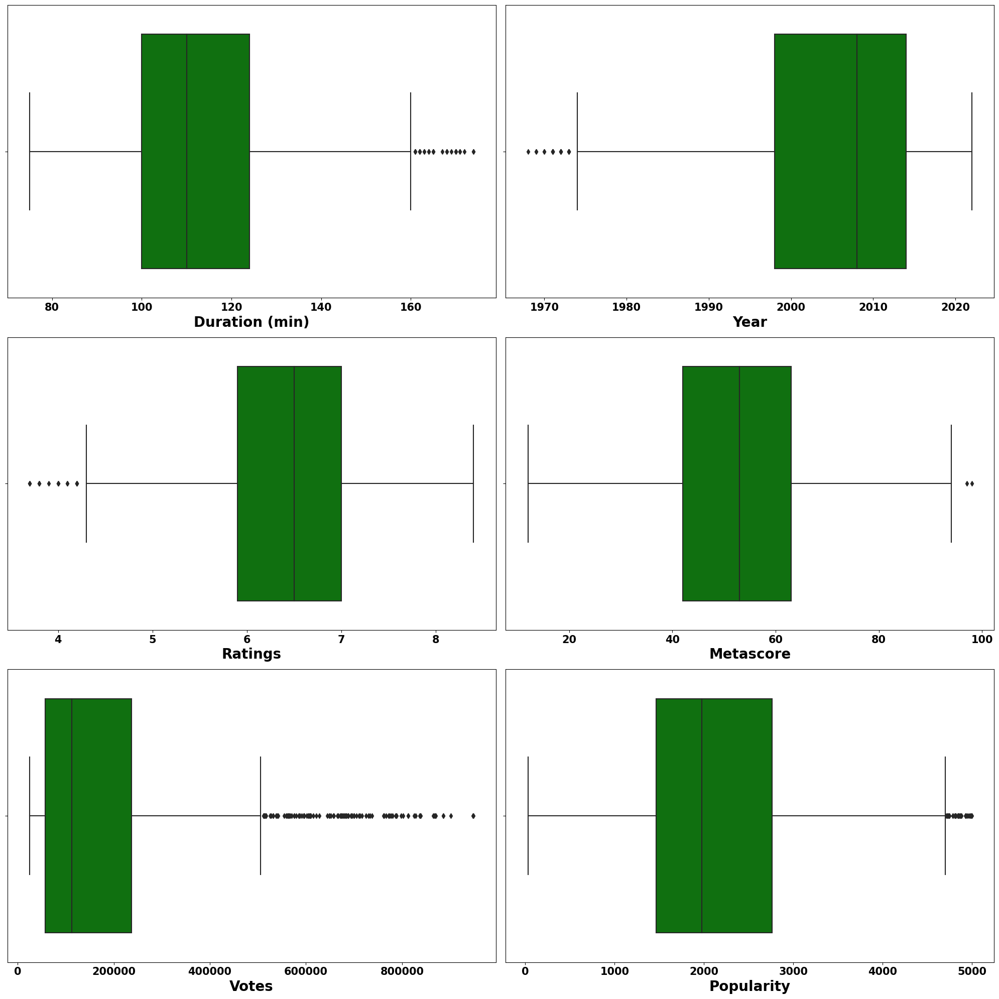

In [154]:
# Checking outliers visually after removing outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=20:
        ax=plt.subplot(3,2,plotnumber)
        sns.boxplot(dfg_3_1[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations
- **Outliers are removed from the features per z-score threshold**

In [155]:
dfg_3_1.shape

(1399, 16)

In [156]:
dfg_3.shape

(1471, 16)

In [157]:
# Data loss calculation with z-score method
loss_percent_zscore=round((dfg_3.shape[0]-dfg_3_1.shape[0])/dfg_3.shape[0]*100,1)
loss_percent_zscore

4.9

### Observations:

- **Data loss with z-score method is 4.9%. Now I will check the dataloss using IQR method as well and will take a call accordingly**

<span style="color:blue; font-weight:bold; font-size:26px;">Removing Outliers using IQR method</span>

In [158]:
# Calculate interquartile range (IQR) for x numerical data
Q1=df_outliers.quantile(0.25)
Q3=df_outliers.quantile(0.75)
IQR=Q3-Q1

# Dataframe with continuous X data after removing outliers
df_outliers_upd = df_outliers[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

# Removing the rows in both x and y where the outliers are present in x features with continuous data
dfg_3_2 = dfg_3[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

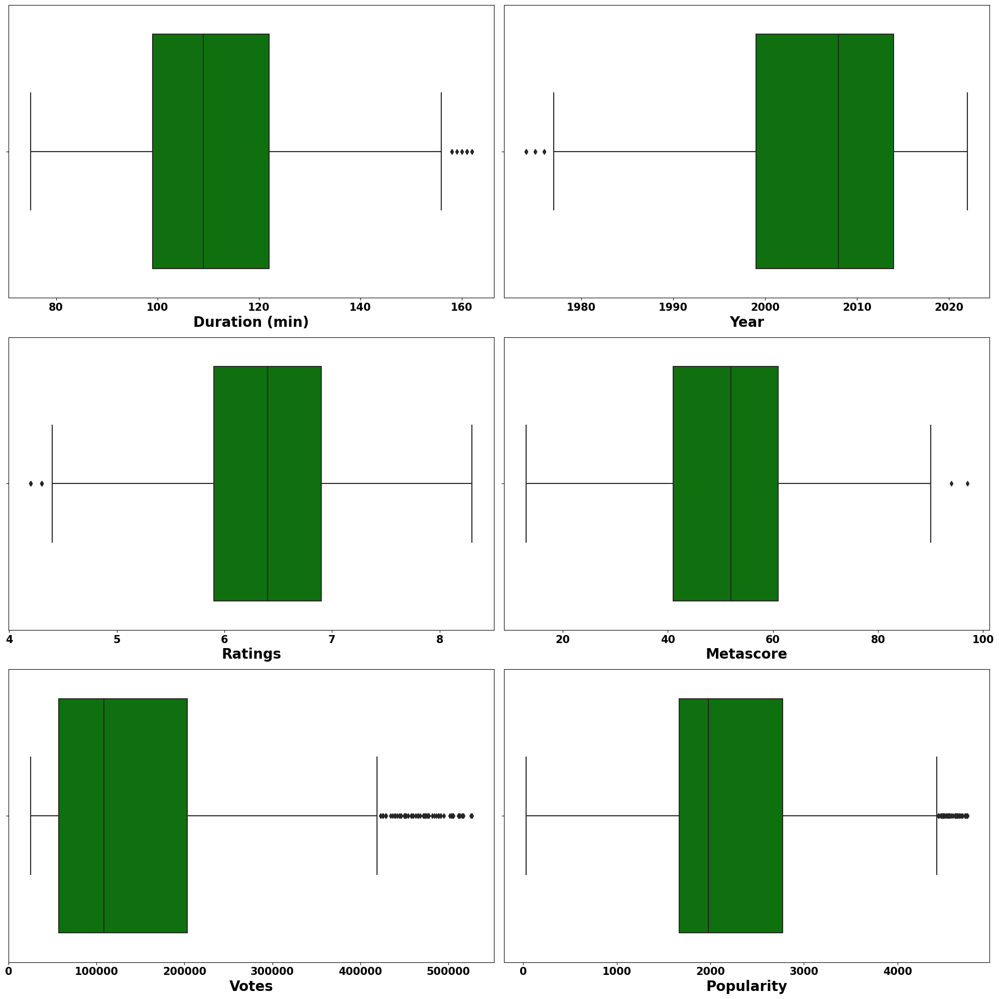

In [159]:
# Checking outliers visually after removing outliers using IQR method
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers_upd.columns:
    if plotnumber<=20:
        ax=plt.subplot(3,2,plotnumber)
        sns.boxplot(dfg_3_2[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

#### Observations
- **Outliers are removed from all features based on IQR range**

In [160]:
dfg_3_2.shape

(1234, 16)

In [161]:
# Data Loss Calculation with IQR
loss_percent_IQR=round((dfg_3.shape[0]-dfg_3_2.shape[0])/dfg_3.shape[0]*100,1)
display(loss_percent_IQR)

16.1

### Observations: 

- **Data loss with IQR is 16.1% which is higher than data loss with z-score (4.9%). Data loss with z-score method is < 10% which is acceptable hence considering x & y data after removing outliers using z-score method for model building**

In [162]:
dfg_3_1.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity,Gross (USD millions)
0,126.0,2014.0,6.1,35.0,532.0,50.0,187818.0,5.0,526.0,392.0,485.0,64.0,1.0,14.0,2300.0,39.32
1,128.0,2016.0,7.3,51.0,243.0,50.0,305541.0,7.0,38.0,53.0,415.0,547.0,13.0,17.0,370.0,86.26
2,104.0,2008.0,6.0,51.0,524.0,50.0,171553.0,5.0,242.0,776.0,781.0,347.0,1.0,14.0,4481.0,31.72


In [163]:
xg=dfg_3_1.drop(['Gross (USD millions)'],axis=1)
yg=dfg_3_1['Gross (USD millions)'].copy()
dfg_3=dfg_3_1

In [164]:
xg.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,126.0,2014.0,6.1,35.0,532.0,50.0,187818.0,5.0,526.0,392.0,485.0,64.0,1.0,14.0,2300.0
1,128.0,2016.0,7.3,51.0,243.0,50.0,305541.0,7.0,38.0,53.0,415.0,547.0,13.0,17.0,370.0
2,104.0,2008.0,6.0,51.0,524.0,50.0,171553.0,5.0,242.0,776.0,781.0,347.0,1.0,14.0,4481.0


In [165]:
yg.head(3)

0    39.32
1    86.26
2    31.72
Name: Gross (USD millions), dtype: float64

<span style="color:blue; font-weight:bold; font-size:26px;">Multicollinearity check between features using variance_inflation_factor (VIF)</span>

In [166]:
# We calculate VIF only for numerical data as the variance is applicable only for numerical data

In [167]:
# Segregating numerical X features to check multicollinearity
df_num=xg[['Duration (min)', 'Year', 'Ratings', 'Metascore', 'Votes', 'Popularity']].copy()

In [168]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_num[list(df_num.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
2,141.523494,Ratings
1,108.118341,Year
0,49.342005,Duration (min)
3,26.972839,Metascore
5,5.989455,Popularity
4,3.243942,Votes


### Observations: 

- **Typically, we remove columns with VIF values > 10 which indicates strong multicollinearity of the features**
- **Multicollinearity can be addressed with either removing columns with VIF > 10 or using PCA**
- **As most of the features are with VIF values > 10, I will use PCA to reduce the no. of features**
- **I will apply PCA at the end of EDA after scaling the data**

<span style="color:blue; font-weight:bold; font-size:26px;">Skewness Check</span>

In [169]:
# We don't remove skewness from categorical X data and from target variable 
# hence checking skewness on X features with numerical data 

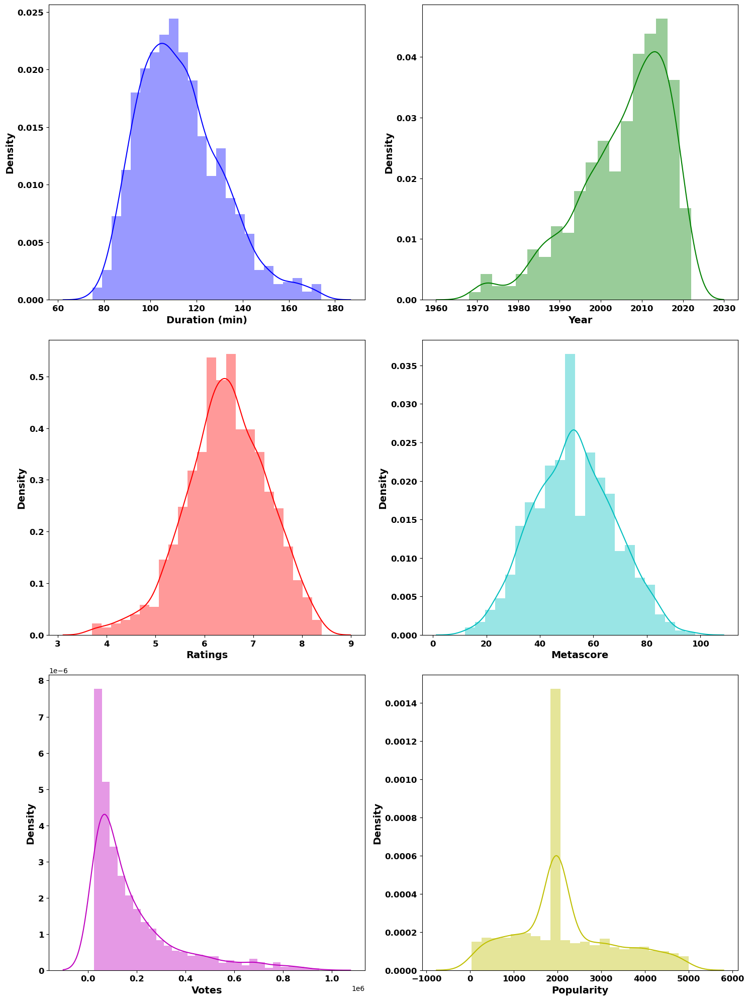

In [170]:
# Skewness of features with numerical data. We don't check skewness on categorical data and in target variable.
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('plasma')
plotnum=1
for col in df_num.columns:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(df_num[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

### Observations:

- **All the features are having skewed data hence I need to reduce the skewness of all these features to get better model performance**

In [171]:
df_num.skew().sort_values(ascending=False) 

Votes             1.802701
Duration (min)    0.677629
Popularity        0.487658
Metascore         0.067822
Ratings          -0.297111
Year             -0.895268
dtype: float64

### Observations: 

- **Typically, "-0.5 to 0.5" range is fairly symmetrical. In this case, there are multiple variables beyond this range**
- **I will apply various transformation techniques to reduce the skewness and will consider the one with lowest skewness**

<span style="color:blue; font-weight:bold; font-size:26px;">Transforming data to reduce skewness</span>

In [172]:
# Method 1: Using PowerTransformer
#checking skewness on X features with numerical data 
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
x_pwr=pt.fit_transform(df_num)
x_tra=pd.DataFrame(data=x_pwr,columns=df_num.columns)
# Checking skeweness and arranging the values in descending order
x_tra.skew().sort_values(ascending=False)

Duration (min)    0.014969
Votes             0.000000
Ratings          -0.007833
Metascore        -0.030606
Popularity       -0.060408
Year             -0.358916
dtype: float64

### Observations:

- **Skewness is reduced using Power Transformer method**
- **Skewness range: (-0.36, +0.36) which is inside the range of -0.5 to 0.5**

In [173]:
# Method2: Using Quantile transformer
from sklearn.preprocessing import QuantileTransformer
qt=QuantileTransformer()
x_qt=qt.fit_transform(df_num)
x_qtr=pd.DataFrame(data=x_qt,columns=df_num.columns)
x_qtr.skew().sort_values(ascending=False)

Popularity        0.004779
Year              0.000869
Metascore         0.000507
Duration (min)    0.000299
Ratings           0.000101
Votes             0.000024
dtype: float64

### Observations:

- **Skewness is reduced using QuantileTransformer method and better compared to PowerTransformer method**
- **Skewness range: (-0.005, +0.005) which is within the range of -0.5 to 0.5 which is fairly symmetrical**
- **Selected the transformed data from QuantileTransformer method**

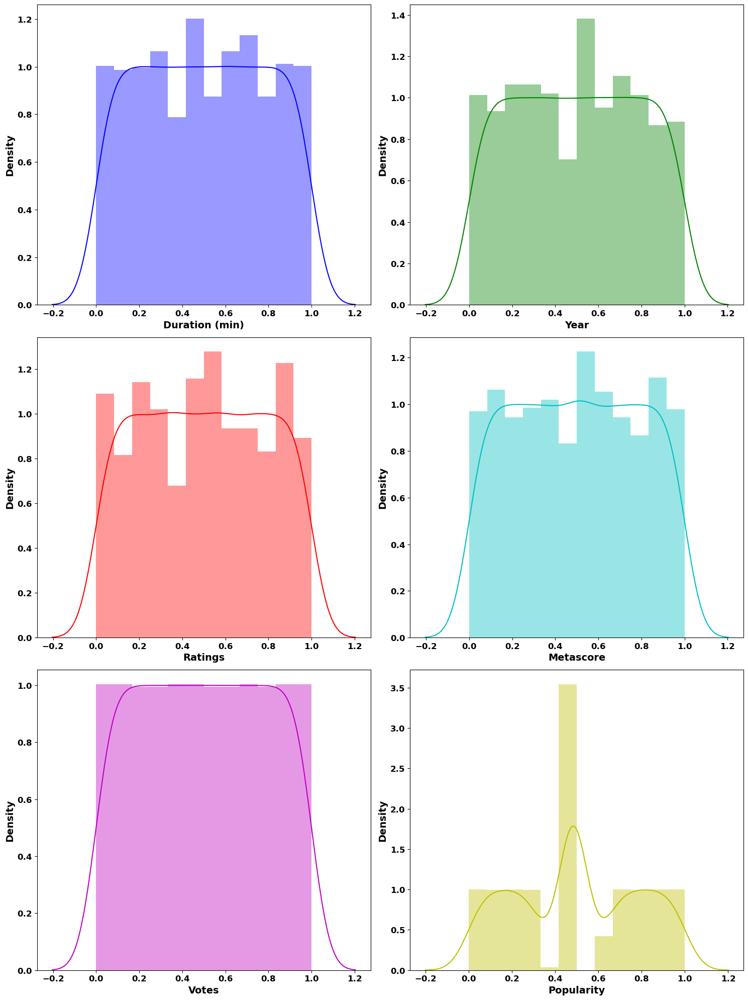

In [174]:
# Checking skewness of the data after transformation
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('Dark2')
plotnum=1
for col in x_qtr:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(x_qtr[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

### Observations:

- **As the skewness is least using "Quantile transformer" for most of the features, I am using transformed x data from "Quantile transformer" for model building**   

### Grouping both transformed numerical and categorical data 

In [175]:
xg.shape

(1399, 15)

In [176]:
xg.head(5) # x data including both numerical and categorical features

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,126.0,2014.0,6.1,35.0,532.0,50.0,187818.0,5.0,526.0,392.0,485.0,64.0,1.0,14.0,2300.0
1,128.0,2016.0,7.3,51.0,243.0,50.0,305541.0,7.0,38.0,53.0,415.0,547.0,13.0,17.0,370.0
2,104.0,2008.0,6.0,51.0,524.0,50.0,171553.0,5.0,242.0,776.0,781.0,347.0,1.0,14.0,4481.0
3,104.0,2003.0,6.6,59.0,548.0,50.0,110187.0,5.0,145.0,833.0,184.0,980.0,1.0,2.0,1912.0
4,90.0,2011.0,4.0,22.0,162.0,50.0,26627.0,5.0,488.0,236.0,166.0,598.0,1.0,8.0,1977.0


In [177]:
new_x=xg.reset_index(drop=True)  # reset the index of x data

In [178]:
new_x.head(5) # x data including both numerical and categorical features after resetting the index

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,126.0,2014.0,6.1,35.0,532.0,50.0,187818.0,5.0,526.0,392.0,485.0,64.0,1.0,14.0,2300.0
1,128.0,2016.0,7.3,51.0,243.0,50.0,305541.0,7.0,38.0,53.0,415.0,547.0,13.0,17.0,370.0
2,104.0,2008.0,6.0,51.0,524.0,50.0,171553.0,5.0,242.0,776.0,781.0,347.0,1.0,14.0,4481.0
3,104.0,2003.0,6.6,59.0,548.0,50.0,110187.0,5.0,145.0,833.0,184.0,980.0,1.0,2.0,1912.0
4,90.0,2011.0,4.0,22.0,162.0,50.0,26627.0,5.0,488.0,236.0,166.0,598.0,1.0,8.0,1977.0


In [179]:
x_qtr.head(5)  # Transformed numerical data

,Duration (min),Year,Ratings,Metascore,Votes,Popularity
0,0.777277,0.746246,0.314815,0.130130,0.674643,0.679667
1,0.799800,0.831331,0.840340,0.447447,0.822976,0.053648
2,0.349349,0.502503,0.271772,0.447447,0.640753,0.956250
3,0.349349,0.355355,0.569570,0.663163,0.492791,0.322162
4,0.076577,0.620621,0.006006,0.015015,0.015025,0.483483


In [180]:
for i in x_qtr.columns:  
    new_x[i]=x_qtr[i]

In [181]:
new_x.head(5)  # Grouped x data with tranformed numerical data and categorical data

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,0.777277,0.746246,0.314815,0.130130,532.0,50.0,0.674643,5.0,526.0,392.0,485.0,64.0,1.0,14.0,0.679667
1,0.799800,0.831331,0.840340,0.447447,243.0,50.0,0.822976,7.0,38.0,53.0,415.0,547.0,13.0,17.0,0.053648
2,0.349349,0.502503,0.271772,0.447447,524.0,50.0,0.640753,5.0,242.0,776.0,781.0,347.0,1.0,14.0,0.956250
3,0.349349,0.355355,0.569570,0.663163,548.0,50.0,0.492791,5.0,145.0,833.0,184.0,980.0,1.0,2.0,0.322162
4,0.076577,0.620621,0.006006,0.015015,162.0,50.0,0.015025,5.0,488.0,236.0,166.0,598.0,1.0,8.0,0.483483


In [182]:
new_x.shape

(1399, 15)

In [183]:
new_x.isnull().sum().sum()  # checking for null values if any due to transformation and grouping

0

<span style="color:blue; font-weight:bold; font-size:26px;">Scaling Data</span>

In [184]:
# Applied standard scaler
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
x_scaled=sc.fit_transform(new_x)
x=pd.DataFrame(data=x_scaled,columns=new_x.columns)
x.head(5)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Votes,Certification,Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,0.960038,0.851996,-0.641552,-1.280889,0.635983,0.13669,0.604517,-0.495505,1.339174,-0.329310,-0.224196,-1.507243,-0.783823,1.092342,0.630171
1,1.038013,1.146511,1.178940,-0.181968,-0.711190,0.13669,1.117975,1.033076,-1.500880,-1.565314,-0.441613,-0.142917,3.117399,1.668654,-1.565286
2,-0.521485,0.008297,-0.790659,-0.181968,0.598691,0.13669,0.487205,-0.495505,-0.313644,1.070765,0.695170,-0.707855,-0.783823,1.092342,1.600151
3,-0.521485,-0.501041,0.240953,0.565090,0.710566,0.13669,-0.024969,-0.495505,-0.878163,1.278588,-1.159092,1.080175,-0.783823,-1.212905,-0.623606
4,-1.465847,0.417153,-1.711309,-1.679551,-1.088771,0.13669,-1.678772,-0.495505,1.118022,-0.898091,-1.214999,0.001143,-0.783823,-0.060281,-0.057848


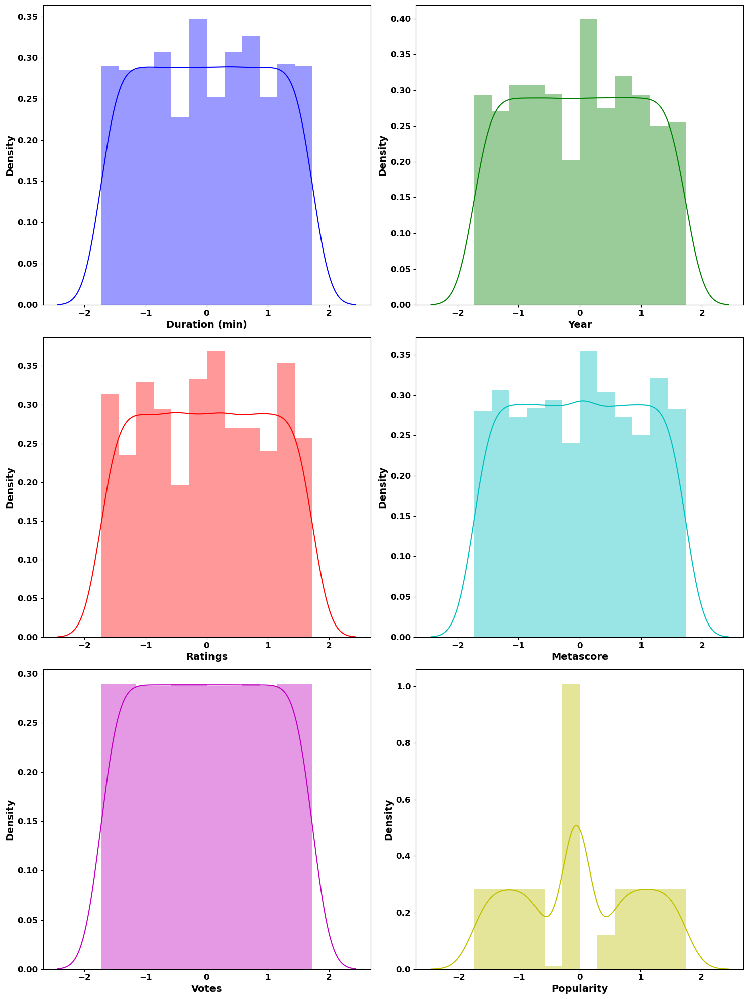

In [185]:
# Visually checking the distribution plots after scaling the data
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('rainbow_r')
plotnum=1
for col in x_qtr:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(x[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

<span style="color:blue; font-weight:bold; font-size:26px;">Principal Component Analysis (PCA)</span>

- **As the dataset has multiple X columns with multi-collinearity, I will use PCA technique to reduce the number of dimensions in a dataset while preserving the most important information in it**
- **Initially, I will calculate the number of components needed to explain the variance**
- **Based on that, I will choose no. of columns required be used in PCA**

In [186]:
from sklearn.decomposition import PCA
pca = PCA().fit(x)

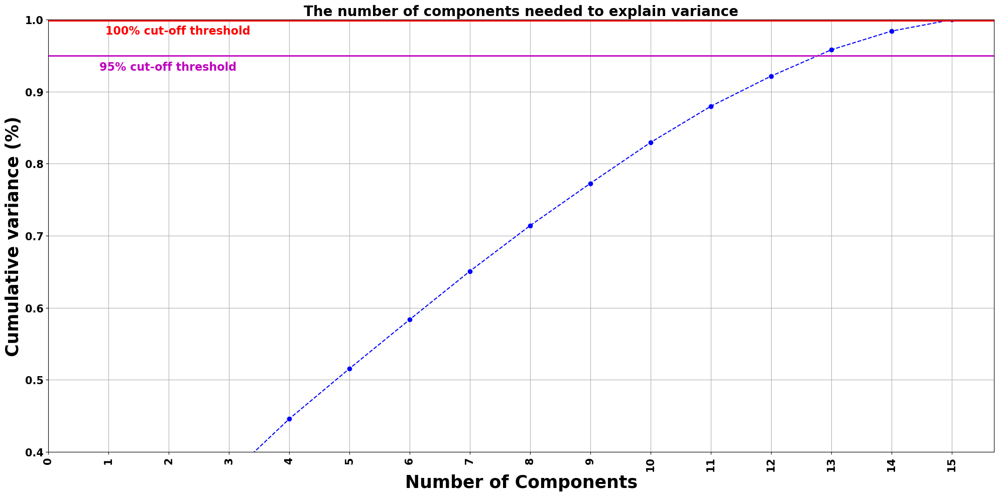

In [187]:
fig, ax = plt.subplots(figsize=(20,10))
xi = np.arange(1, x.shape[1]+1, step=1)
yi = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components',fontsize=25,fontweight ='bold')
plt.xticks(np.arange(0, x.shape[1]+1, step=1)) 
plt.ylabel('Cumulative variance (%)',fontsize=25,fontweight ='bold')
plt.title('The number of components needed to explain variance',fontsize=20,fontweight ='bold')
plt.axhline(y=1, color='r', linestyle='-',linewidth = '5')
plt.text(0.95, 0.98, '100% cut-off threshold', color = 'red', fontsize=16,fontweight ='bold')
plt.axhline(y=0.95, color='m', linestyle='-',linewidth = '2')
plt.text(0.85, 0.93, '95% cut-off threshold', color = 'm', fontsize=16,fontweight ='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.grid(axis = 'x')
plt.grid(True)
plt.ylim(0.4,1.0)
plt.tight_layout()
plt.show()

### Observations:

- **As per the graph, we can see that 13 principal components attribute for 95% of variation in the data. Hence, I will pick 13 components for our prediction**
- **I will use 13 features as no. of components in PCA to reduce the dimensions**

In [188]:
# Applying PCA transformation on X data to reduce the no. of columns
pca=PCA(n_components=13)
xg=pca.fit_transform(x)
xg=pd.DataFrame(xg)
xg.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.318297,0.209380,-1.107230,-0.522898,0.186821,1.832091,-0.297979,-1.720055,0.581753,-0.587317,0.570954,0.613989,-1.020997
1,-1.907368,3.506451,-1.799351,1.427103,-0.989351,0.447787,-0.144132,1.190124,0.077664,0.416725,0.099736,0.237483,1.198576
2,1.026576,0.057576,0.275849,-0.617622,-0.502122,-0.078560,0.387674,-0.675669,1.203854,0.131349,0.690317,-0.551510,-1.741960
3,-0.469754,-1.523261,0.745274,-0.572838,-0.237258,-0.376621,1.842713,0.539870,-0.514759,0.219903,-0.744929,-0.797866,0.302875
4,2.722661,-1.135234,-1.521884,0.569782,0.936182,0.947268,-0.451076,-0.315312,-1.103553,0.275364,-0.891979,-0.276668,0.450275


### Observations:

- **After applying PCA transformation, X dataset is reduced to 13 dimensions. This X data can be used for model training**

<span style="color:blue; font-weight:bold; font-size:26px;">Multicollinearity check again after PCA transformation</span>

In [189]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = xg[list(xg.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
8,1.0,8
9,1.0,9
12,1.0,12
0,1.0,0
1,1.0,1
2,1.0,2
3,1.0,3
4,1.0,4
5,1.0,5
6,1.0,6


### Observations:

- **No multicollinearity is noticed after PCA transformation as VIF < 5 for all features**

In [190]:
yg.shape

(1399,)

In [191]:
xg.shape

(1399, 13)

<span style="color:brown; font-weight:bold; font-size:22px;">** EDA completed for dataframe with target variable "GROSS COLLECTION"  **</span>

<span style="color:blue; font-weight:bold; font-size:24px;">** Remainig EDA for dataframe features with target variable "Votes" **</span>





<span style="color:blue; font-weight:bold; font-size:26px;">Checking coefficients of correlation (r) - "Votes" as Target Variable</span>

In [192]:
dfv_2.head() # Using the imputed dataset

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Director 3,Director 4,Director 5,Director 6,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre1,Genre2,Genre3,Popularity,No. of Directors,No. of Stars,No. of Genres,Votes
0,138.0,2018.0,7.7,53.0,574.0,59.0,8.0,5.0,2.0,1.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,0.0,5.0,15.0,2026.0,1.0,4.0,3.0,32297.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,8.0,5.0,2.0,1.0,11.0,43.775,250.0,639.0,760.0,412.0,0.0,1.0,4.0,2320.0,1.0,4.0,3.0,44661.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,8.0,5.0,2.0,1.0,10.0,67.640,125.0,1022.0,953.0,130.0,0.0,4.0,15.0,3521.0,1.0,4.0,3.0,46842.0
3,111.0,1998.0,6.1,37.0,326.0,59.0,8.0,5.0,2.0,1.0,10.0,32.940,87.0,788.0,29.0,195.0,0.0,4.0,4.0,2026.0,1.0,4.0,3.0,76092.0
4,95.0,2012.0,5.4,51.0,696.0,59.0,8.0,5.0,2.0,1.0,10.0,15.630,570.0,223.0,746.0,1082.0,0.0,15.0,18.0,2026.0,1.0,4.0,1.0,63535.0


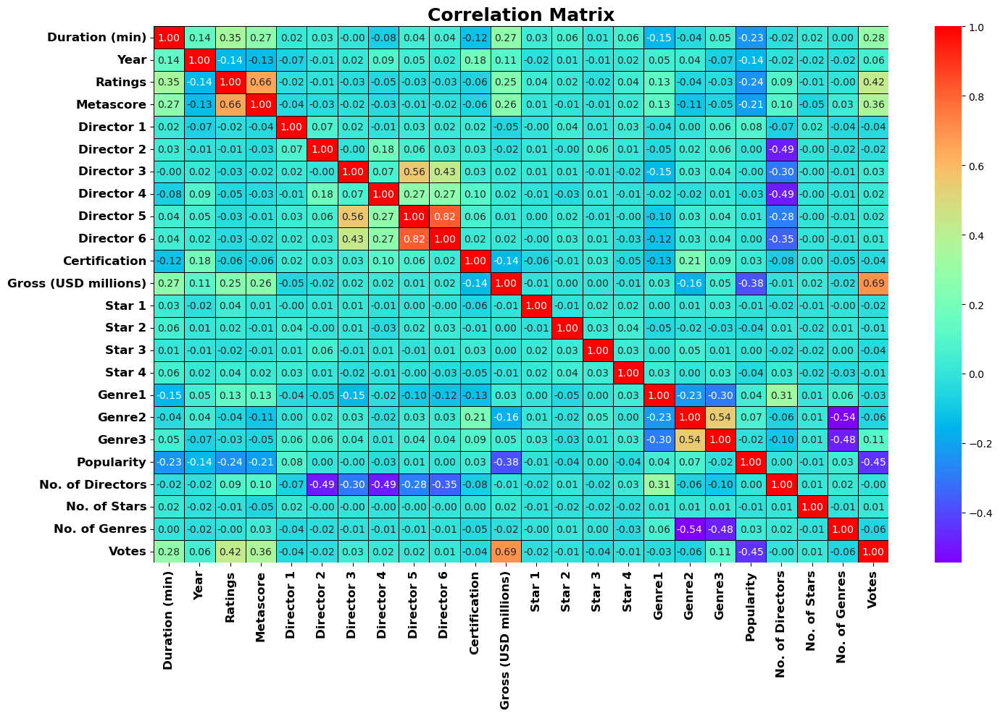

In [193]:
# Checking correlaiton coefficients to know the strength of relationship between variables
corr_r=dfv_2.corr()
plt.figure(figsize=(15,10))
sns.heatmap(corr_r,annot=True,linewidths=0.5,linecolor='black',fmt=".2f",cmap="rainbow")
plt.title("Correlation Matrix",fontsize=18,fontweight ='bold')
plt.xticks(fontsize=12,fontweight ='bold')
plt.yticks(fontsize=12,fontweight ='bold')
plt.tight_layout()
plt.savefig("correlation_matrix.jpg")
plt.show()

In [194]:
df_cr1=dfv_2.copy()

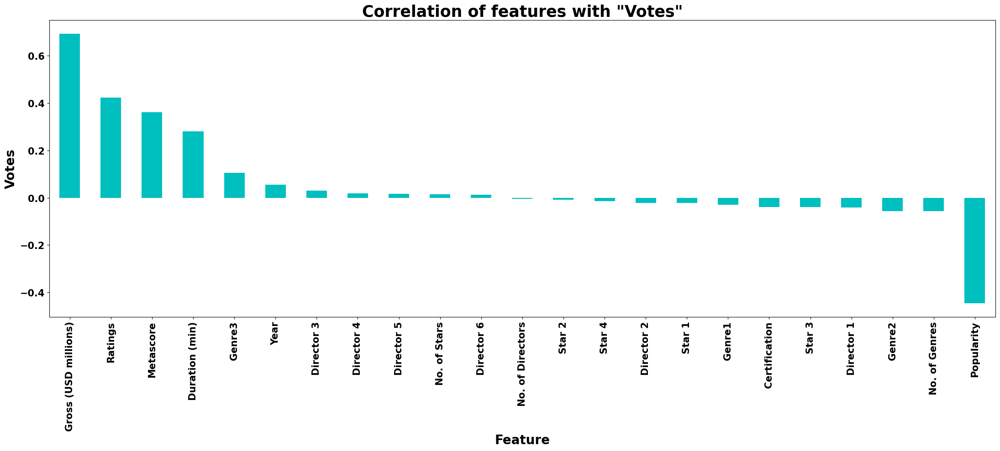

In [195]:
# Plotting the relationship of target variable with other variables in descending order
plt.figure(figsize=(22,10))
corr_r['Votes'].sort_values(ascending=False).drop(['Votes']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=20,fontweight='bold')
plt.ylabel('Votes',fontsize=20,fontweight='bold')
plt.title('Correlation of features with "Votes"',fontsize=25,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

In [196]:
corr_r['Votes'].sort_values(ascending=False) 

Votes                   1.000000
Gross (USD millions)    0.692924
Ratings                 0.422616
Metascore               0.360893
Duration (min)          0.280280
Genre3                  0.105832
Year                    0.055344
Director 3              0.030062
Director 4              0.018165
Director 5              0.015871
No. of Stars            0.014335
Director 6              0.012863
No. of Directors       -0.004460
Star 2                 -0.007693
Star 4                 -0.013644
Director 2             -0.021153
Star 1                 -0.022429
Genre1                 -0.029993
Certification          -0.038970
Star 3                 -0.039114
Director 1             -0.040953
Genre2                 -0.056721
No. of Genres          -0.057113
Popularity             -0.445918
Name: Votes, dtype: float64

### Observations for target variable 'Votes':

- **There are multiple features with weak and very weak correlations**
- **Max +ve correlation: 'Gross (USD millions)'** 
- **Max -ve correlation: 'Popularity'**
- **Typically, we consider the coefficient of correlation between -0.3 to 0.3 as weak correlation**
- **Considering -0.06 to 0.06 range as very weak correlation with target variable in this project. Identified features within this range are Director 3, Director 4, Director 5, No. of Stars, Director 6, No. of Directors, Star 2, Star 4, Director 2, Star 1, Genre1, Certification, Star 3**
- **I will check feature scores from SelectKBest algorithm with f-regression test and also with feature importance using ExtraTreeRegressor, then will check if any features have lower score to take further decisions.**

<span style="color:blue; font-weight:bold; font-size:26px;">Checking top features using SelectKBest algorithm - "Votes"</span>

In [197]:
#sklearn.feature_selection.f_regression
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression    # Using f_regression test


x=df_cr1.drop('Votes',axis=1)  # #independent columns
y=df_cr1['Votes']  # Output variable

#apply SelectKBest class to extract top best features
bestfeatures = SelectKBest(score_func=f_regression, k='all')
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
SelectKBest_scores=featureScores.nlargest(100,'Score')  #Top 100 features
SelectKBest_scores.reset_index(drop=True)  # displyaing top 100 features and scores

,Specs,Score
0,Gross (USD millions),1615.388609
1,Popularity,434.093256
2,Ratings,380.301936
3,Metascore,261.909032
4,Duration (min),149.109292
5,Genre3,19.811451
6,No. of Genres,5.723691
7,Genre2,5.645195
8,Year,5.373484
9,Director 1,2.938312


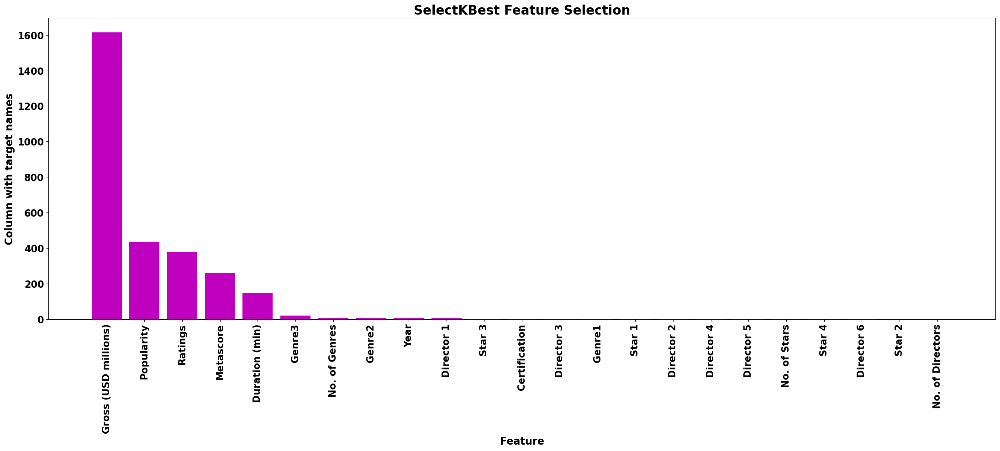

In [198]:
# Plotting the score values in descending order
df_sorted_desc= featureScores.sort_values('Score',ascending=False)
plt.figure(figsize=(22,10))
plt.bar('Specs','Score',data=df_sorted_desc,color='m')
plt.xlabel("Feature",fontsize=16,fontweight='bold')
plt.ylabel("Column with target names",fontsize=16,fontweight='bold')
plt.title("SelectKBest Feature Selection",fontsize=20,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

### Observations for target variable 'Votes':

- **There are multiple features with lower feature scores (No. of Genres, Genre2, Year, Director 1, Star 3, Certification, Director 3, Genre1, Star 1, Director 2, Director 4, Director 5, No. of Stars, Star 4, Director 6, Star 2, No. of Directors)**
- **Max feature score for: 'Gross (USD millions)'** 
- **Min feature score for: 'No. of Directors'**
- **I will also check feature scores with feature importance using ExtraTreeRegressor, then will check if any features have lower score to take further decisions.**

<span style="color:blue; font-weight:bold; font-size:26px;">Checking top features using Feature Importance - Extra Tree Regressor</span>

In [199]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt

x=df_cr1.drop('Votes',axis=1)  # #independent columns
y=df_cr1['Votes']  # Output variable

model = ExtraTreesRegressor()
model.fit(x,y)
dfscores = pd.DataFrame(model.feature_importances_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
Feature_Importance_scores=featureScores.nlargest(100,'Score')  #Top 100 features
Feature_Importance_scores.reset_index(drop=True)  # displyaing top 100 features and scores

,Specs,Score
0,Gross (USD millions),3.343191e-01
1,Ratings,2.483338e-01
2,Popularity,1.951962e-01
3,Metascore,4.294782e-02
4,Year,3.662516e-02
5,Duration (min),1.831460e-02
6,Certification,1.706462e-02
7,Genre3,1.555478e-02
8,Star 1,1.434820e-02
9,Director 1,1.284408e-02


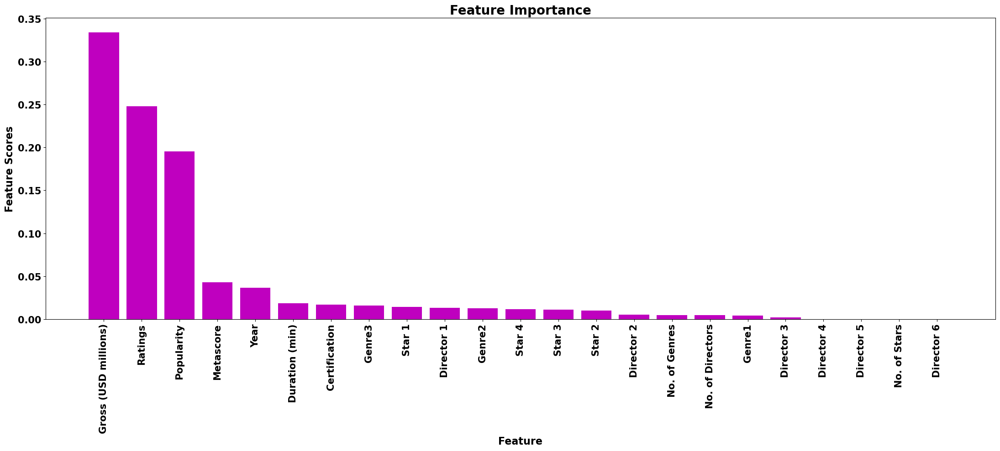

In [200]:
# Plotting the score values in descending order
df_sorted_desc= featureScores.sort_values('Score',ascending=False)
plt.figure(figsize=(22,10))
plt.bar('Specs','Score',data=df_sorted_desc,color='m')
plt.xlabel("Feature",fontsize=16,fontweight='bold')
plt.ylabel("Feature Scores",fontsize=16,fontweight='bold')
plt.title("Feature Importance",fontsize=20,fontweight='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.tight_layout()
plt.show()

### Observations for target variable 'Gross (USD millions)':

- **There are multiple features with lower feature scores (No. of Genres, Genre1, No. of Directors, Director 3, Director 5, Director 4, No. of Stars, Director 6)**
- **Max feature score for: 'Gross (USD millions)'** 
- **Min feature score for: 'Director 6'**

### <u>Consolidated Observations for target variable 'Votes' from multiple feature selection techniques:<u>

- **Coefficient of Correlation: Features with weak correlations - Director 3, Director 4, Director 5, No. of Stars, Director 6, No. of Directors, Star 2, Star 4, Director 2, Star 1, Genre1, Certification, Star 3, No. of Genres**
- **SelectKBest: Features with lower scores - No. of Genres, Genre2, Year, Director 1, Star 3, Certification, Director 3, Genre1, Star 1, Director 2, Director 4, Director 5, No. of Stars, Star 4, Director 6, Star 2, No. of Directors**
- **Feature Importance using ExtraTreeRegressor: Features with lower scores - No. of Genres, Genre1, No. of Directors, Director 3, Director 5, Director 4, No. of Stars, Director 6**

- **Based on from these three methods, I have decided to drop the columns which are commonly coming among them: 'Genre1', 'No. of Directors', 'Director 3', 'Director 5', 'Director 4', 'No. of Stars', 'Director 6', 'No. of Genres'**

In [201]:
dfv_3=dfv_2.drop(['Genre1', 'No. of Directors', 'Director 3', 'Director 5', 'Director 4', 'No. of Stars', 'Director 6', 'No. of Genres'],axis=1)
dfv_3.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity,Votes
0,138.0,2018.0,7.7,53.0,574.0,59.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,5.0,15.0,2026.0,32297.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,11.0,43.775,250.0,639.0,760.0,412.0,1.0,4.0,2320.0,44661.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,10.0,67.640,125.0,1022.0,953.0,130.0,4.0,15.0,3521.0,46842.0


<span style="color:blue; font-weight:bold; font-size:26px;">Outliers Check</span>

In [202]:
# Segregating numerical data for checking outliers. 
# We check outliers only for X numerical data as it is applicable only for numerical data
dfv_numerical=dfv_3[['Duration (min)', 'Year', 'Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity']].copy()
dfv_numerical.head(3)

,Duration (min),Year,Ratings,Metascore,Gross (USD millions),Popularity
0,138.0,2018.0,7.7,53.0,43.775,2026.0
1,101.0,2022.0,5.8,62.0,43.775,2320.0
2,117.0,1983.0,6.6,52.0,67.640,3521.0


In [203]:
# We check outliers on X numerical data
df_outliers=dfv_numerical.copy()

In [204]:
df_outliers.shape

(1751, 6)

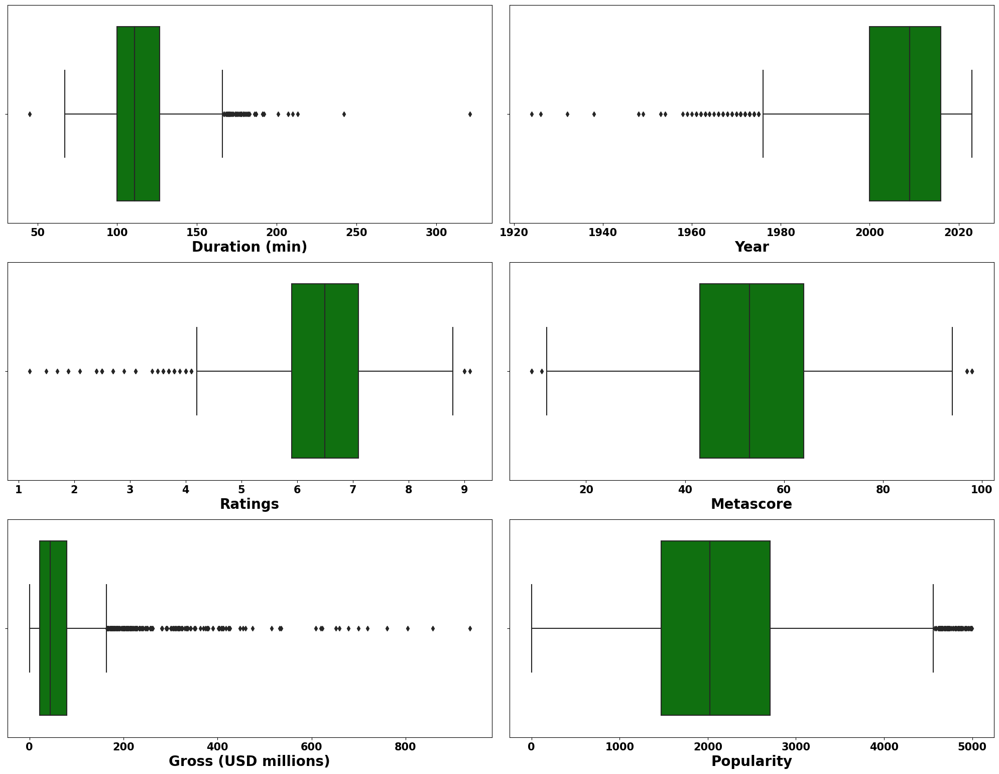

In [205]:
# Checking outliers visually before removing outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=20:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(dfv_numerical[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

### Observations:

- **Outliers are present in all the columns**

<span style="color:blue; font-weight:bold; font-size:26px;">Removing Outliers using z-score method</span>

In [206]:
df_outliers.shape

(1751, 6)

In [207]:
dfv_3.shape

(1751, 16)

In [208]:
# Calculating z score & identifying the rows and columns where absolute z score > 3

from scipy.stats import zscore
z=np.abs(zscore(df_outliers))
threshold=3
np.where(z>3)

(array([  24,   41,   63,   63,   76,   80,  114,  170,  175,  183,  197,
         225,  232,  269,  334,  356,  370,  378,  382,  406,  454,  457,
         476,  508,  511,  513,  526,  527,  527,  533,  552,  554,  555,
         566,  586,  592,  595,  596,  614,  650,  666,  674,  713,  720,
         779,  846,  869,  869,  870,  893,  918,  940,  944,  956,  963,
         966,  975,  987, 1010, 1012, 1012, 1026, 1040, 1059, 1090, 1094,
        1094, 1107, 1122, 1156, 1156, 1167, 1252, 1261, 1295, 1300, 1308,
        1319, 1330, 1337, 1365, 1380, 1387, 1406, 1409, 1413, 1436, 1438,
        1444, 1475, 1533, 1539, 1618, 1625, 1642, 1665, 1715, 1719, 1733,
        1742], dtype=int64),
 array([4, 4, 0, 4, 1, 2, 4, 4, 2, 2, 1, 4, 4, 1, 1, 4, 0, 4, 4, 1, 1, 4,
        4, 4, 2, 1, 4, 0, 4, 1, 4, 4, 0, 1, 2, 4, 1, 0, 1, 2, 4, 1, 2, 0,
        4, 1, 0, 1, 1, 2, 2, 1, 0, 2, 4, 4, 1, 4, 1, 0, 4, 1, 0, 4, 0, 0,
        1, 4, 2, 0, 1, 4, 1, 4, 4, 2, 0, 4, 4, 0, 4, 4, 4, 2, 2, 4, 1, 4,
        4

In [209]:
# Removing the rows in the dataframe where the outliers are present in x features with numerical data
dfv_3_1=dfv_3[(z<3).all(axis=1)]
df_outliers_del=df_outliers[(z<3).all(axis=1)]

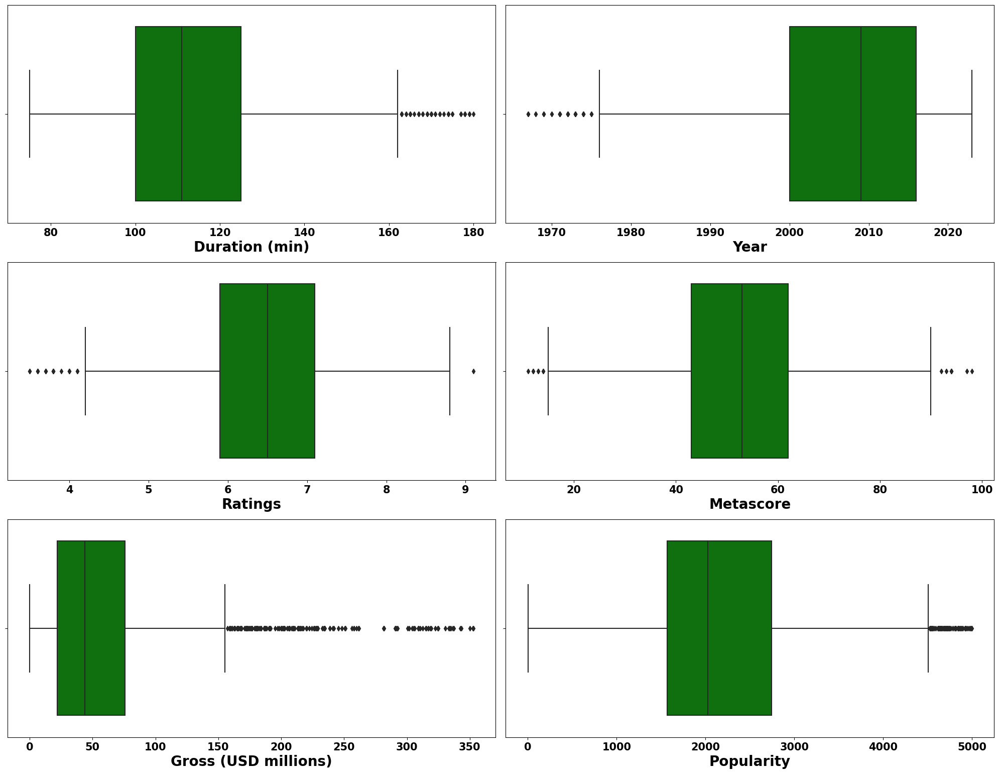

In [210]:
# Checking outliers visually after removing outliers
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers.columns:
    if plotnumber<=20:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(dfv_3_1[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

### Observations:

- **Outliers are removed from the features per z-score threshold**

In [211]:
dfv_3_1.shape

(1657, 16)

In [212]:
dfv_3.shape

(1751, 16)

In [213]:
# Data loss calculation with z-score method
loss_percent_zscore=round((dfv_3.shape[0]-dfv_3_1.shape[0])/dfv_3.shape[0]*100,1)
loss_percent_zscore

5.4

### Observations:

- **Data loss with z-score method is 5.4%. Now I will check the data loss using IQR method as well and will take a call accordingly**

<span style="color:blue; font-weight:bold; font-size:26px;">Removing Outliers using IQR method</span>

In [214]:
# Calculate interquartile range (IQR) for x numerical data
Q1=df_outliers.quantile(0.25)
Q3=df_outliers.quantile(0.75)
IQR=Q3-Q1

# Dataframe with continuous X data after removing outliers
df_outliers_upd = df_outliers[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

# Removing the rows in both x and y where the outliers are present in x features with continuous data
dfv_3_2 = dfv_3[((df_outliers>=(Q1-1.5*IQR)) & (df_outliers<=(Q3+1.5*IQR))).all(axis=1)]

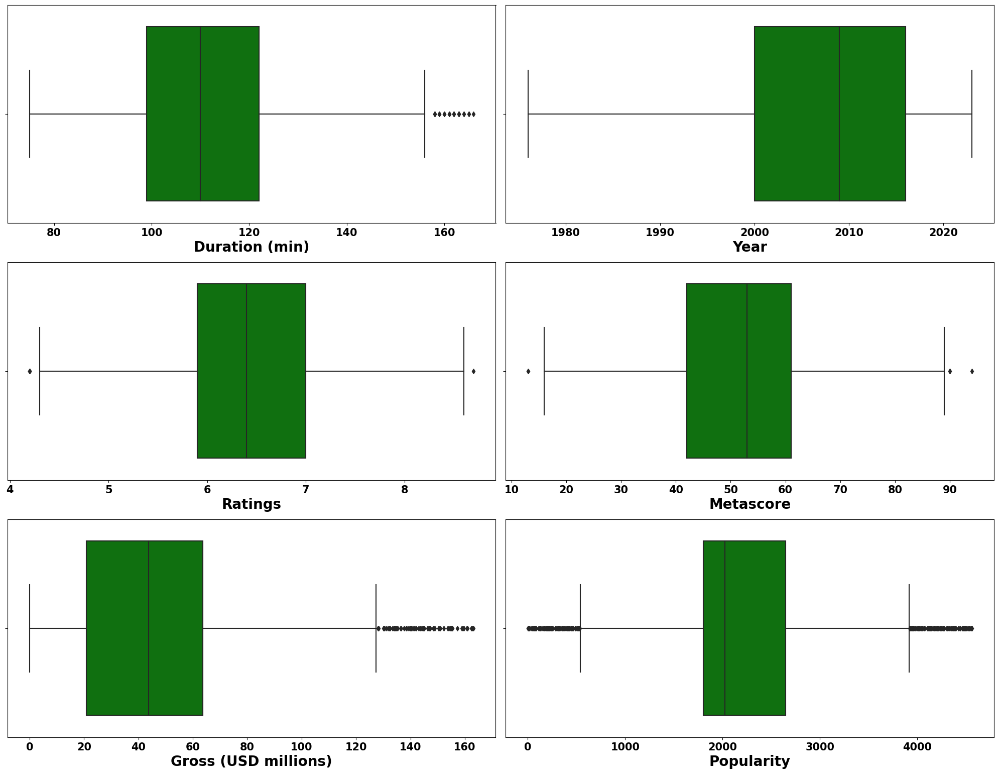

In [215]:
# Checking outliers visually after removing outliers using IQR method
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in df_outliers_upd.columns:
    if plotnumber<=20:
        ax=plt.subplot(4,2,plotnumber)
        sns.boxplot(dfv_3_2[column],color='g')
        plt.xlabel(column,fontsize=20,fontweight='bold')
        plt.xticks(fontsize=15,fontweight ='bold',rotation=0)
        plt.tight_layout()
    plotnumber+=1
plt.show()

### Observations:

- **Outliers are removed from all features based on IQR range**

In [216]:
dfv_3_2.shape

(1372, 16)

In [217]:
# Data Loss Calculation with IQR
loss_percent_IQR=round((dfv_3.shape[0]-dfv_3_2.shape[0])/dfv_3.shape[0]*100,1)
display(loss_percent_IQR)

21.6

### Observations: 

- **Data loss with IQR is 21.6% which is higher than data loss with z-score (5.4%). Data loss with z-score method is < 10% which is acceptable hence considering x & y data after removing outliers using z-score method for model building**

In [218]:
dfv_3_1.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity,Votes
0,138.0,2018.0,7.7,53.0,574.0,59.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,5.0,15.0,2026.0,32297.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,11.0,43.775,250.0,639.0,760.0,412.0,1.0,4.0,2320.0,44661.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,10.0,67.640,125.0,1022.0,953.0,130.0,4.0,15.0,3521.0,46842.0


In [219]:
xv=dfv_3_1.drop(['Votes'],axis=1)
yv=dfv_3_1['Votes'].copy()
dfv_3=dfv_3_1

In [220]:
xv.head(3)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,138.0,2018.0,7.7,53.0,574.0,59.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,5.0,15.0,2026.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,11.0,43.775,250.0,639.0,760.0,412.0,1.0,4.0,2320.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,10.0,67.640,125.0,1022.0,953.0,130.0,4.0,15.0,3521.0


In [221]:
yv.head(3)

0    32297.0
1    44661.0
2    46842.0
Name: Votes, dtype: float64

<span style="color:blue; font-weight:bold; font-size:26px;">Multicollinearity check between features using variance_inflation_factor (VIF)</span>

In [222]:
# We calculate VIF only for numerical data as the variance is applicable only for numerical data

In [223]:
# Segregating numerical X features to check multi collinearity
df_num=xv[['Duration (min)', 'Year', 'Ratings', 'Metascore', 'Gross (USD millions)', 'Popularity']].copy()

In [224]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = df_num[list(df_num.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
2,109.439854,Ratings
1,85.346274,Year
0,43.277243,Duration (min)
3,25.366818,Metascore
5,5.537018,Popularity
4,2.315587,Gross (USD millions)


### Observations: 

- **Typically, we remove columns with VIF values > 10 which indicates strong multicollinearity of the features**
- **Multicollinearity can be addressed with either removing columns with VIF > 10 or using PCA**
- **As most of the features are with VIF values > 10, I will use PCA to reduce the no. of features**
- **I will apply PCA at the end of EDA after scaling the data**

<span style="color:blue; font-weight:bold; font-size:26px;">Skewness Check</span>

In [225]:
# We don't remove skewness from categorical X data and from target variable 
# hence checking skewness on X features with numerical data 

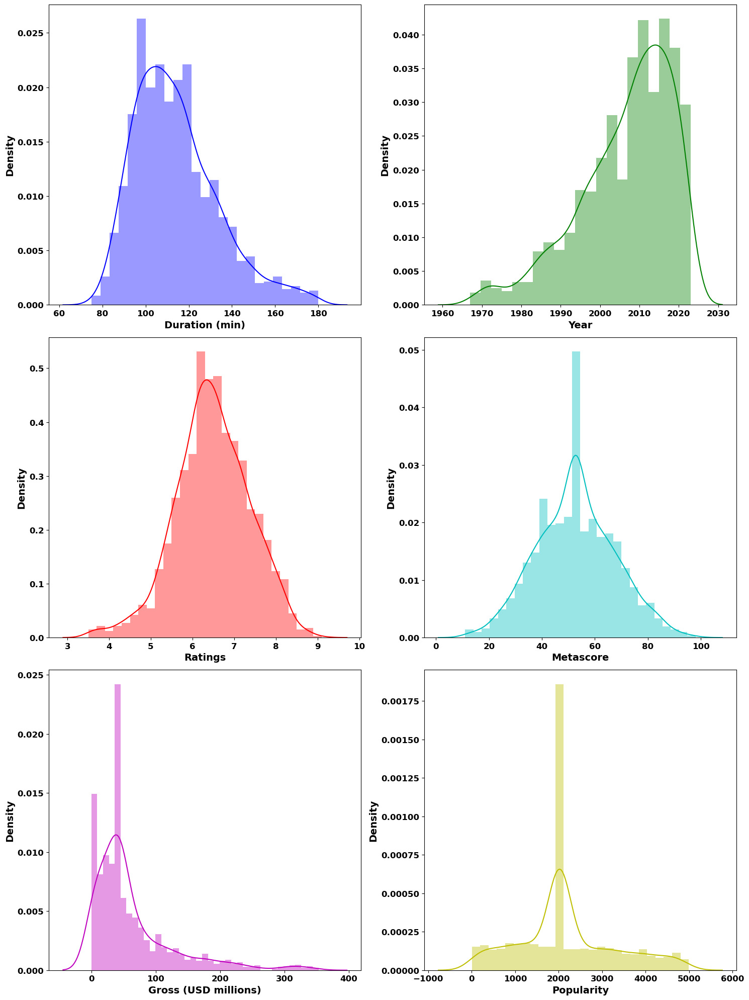

In [226]:
# Skewness of features with numerical data. We don't check skewness on categorical data and in target variable.
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('plasma')
plotnum=1
for col in df_num.columns:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(df_num[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

### Observatins:

- **All the features are having skewed data hence I need to reduce the skewness of all these features to get better model performance**

In [227]:
df_num.skew().sort_values(ascending=False) 

Gross (USD millions)    2.014948
Duration (min)          0.852834
Popularity              0.441456
Metascore               0.069494
Ratings                -0.194674
Year                   -0.948639
dtype: float64

### Observations: 

- **Typically, "-0.5 to 0.5" range is fairly symmetrical. In this case, there are multiple variables beyond this range**
- **I will apply various transformation techniques to reduce the skewness and will consider the one with lowest skewness**

<span style="color:blue; font-weight:bold; font-size:26px;">Transforming data to reduce skewness</span>

In [228]:
# Method 1: Using PowerTransformer
#checking skewness on X features with numerical data 
from sklearn.preprocessing import PowerTransformer
pt=PowerTransformer()
x_pwr=pt.fit_transform(df_num)
x_tra=pd.DataFrame(data=x_pwr,columns=df_num.columns)
# Checking skeweness and arranging the values in descending order
x_tra.skew().sort_values(ascending=False)

Duration (min)          0.022351
Ratings                 0.007397
Metascore              -0.011659
Gross (USD millions)   -0.014688
Popularity             -0.078050
Year                   -0.380577
dtype: float64

#### Observations:
- **Skewness is reduced using powerTransformer method**
- **Skewness range: (-0.38,+0.38) which is inside the range of -0.5 to 0.5**

In [229]:
# Method2: Using Quantile transformer
from sklearn.preprocessing import QuantileTransformer
qt=QuantileTransformer()
x_qt=qt.fit_transform(df_num)
x_qtr=pd.DataFrame(data=x_qt,columns=df_num.columns)
x_qtr.skew().sort_values(ascending=False)

Popularity              0.004950
Duration (min)          0.000276
Ratings                 0.000229
Year                    0.000129
Gross (USD millions)   -0.000634
Metascore              -0.000717
dtype: float64

### Observations:

- **Skewness is reduced using QuantileTransformer method and better compared to PowerTransformer method**
- **Skewness range: (-0.005,+0.005) which is within the range of -0.5 to 0.5 which is fairly symmetrical**
- **Selected the transformed data from QuantileTransformer method**

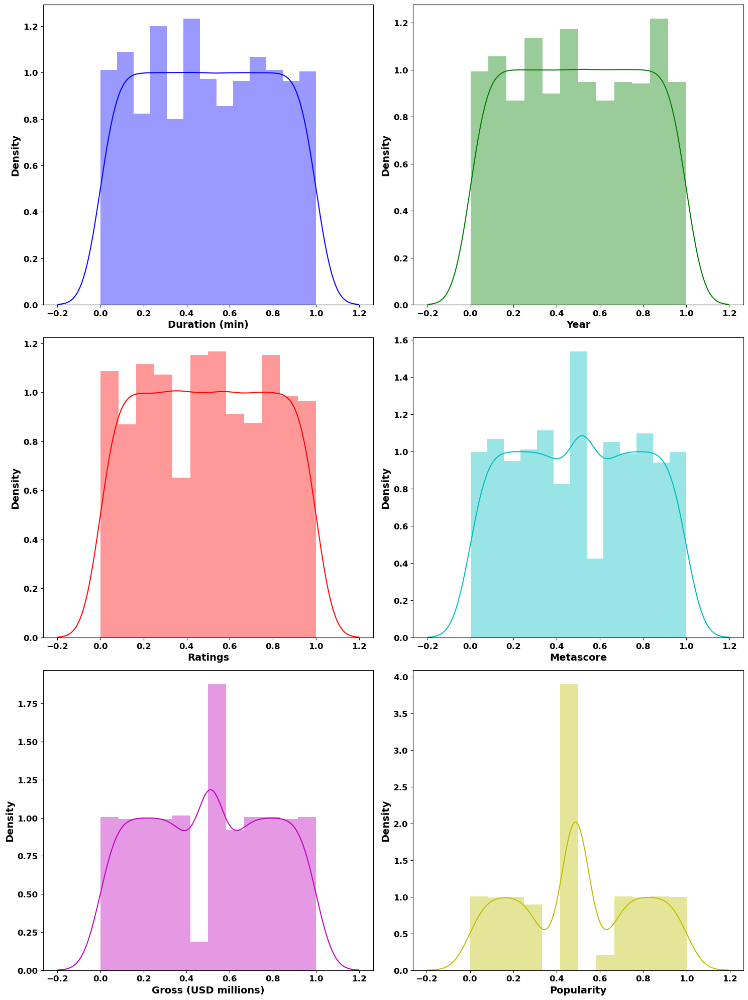

In [230]:
# Checking skewness of the data after transformation
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('Dark2')
plotnum=1
for col in x_qtr:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(x_qtr[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

### Observations:

- **As the skewness is least using "Quantile transformer" for most of the features, I am using transformed x data from "Quantile transformer" for model building**   

### Grouping both transformed numerical and categorical data 

In [231]:
xv.shape

(1657, 15)

In [232]:
xv.head(5) # x data including both numerical and categorical features

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,138.0,2018.0,7.7,53.0,574.0,59.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,5.0,15.0,2026.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,11.0,43.775,250.0,639.0,760.0,412.0,1.0,4.0,2320.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,10.0,67.640,125.0,1022.0,953.0,130.0,4.0,15.0,3521.0
3,111.0,1998.0,6.1,37.0,326.0,59.0,10.0,32.940,87.0,788.0,29.0,195.0,4.0,4.0,2026.0
4,95.0,2012.0,5.4,51.0,696.0,59.0,10.0,15.630,570.0,223.0,746.0,1082.0,15.0,18.0,2026.0


In [233]:
new_x=xv.reset_index(drop=True)  # reset the index of x data

In [234]:
new_x.head(5) # x data including both numerical and categorical features after resetting the index

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,138.0,2018.0,7.7,53.0,574.0,59.0,6.0,43.775,24.0,1100.0,1001.0,1246.0,5.0,15.0,2026.0
1,101.0,2022.0,5.8,62.0,727.0,59.0,11.0,43.775,250.0,639.0,760.0,412.0,1.0,4.0,2320.0
2,117.0,1983.0,6.6,52.0,151.0,59.0,10.0,67.640,125.0,1022.0,953.0,130.0,4.0,15.0,3521.0
3,111.0,1998.0,6.1,37.0,326.0,59.0,10.0,32.940,87.0,788.0,29.0,195.0,4.0,4.0,2026.0
4,95.0,2012.0,5.4,51.0,696.0,59.0,10.0,15.630,570.0,223.0,746.0,1082.0,15.0,18.0,2026.0


In [235]:
x_qtr.head(5)  # Transformed numerical data

,Duration (min),Year,Ratings,Metascore,Gross (USD millions),Popularity
0,0.886386,0.839339,0.910410,0.518018,0.511011,0.486987
1,0.283283,0.971471,0.209710,0.741742,0.511011,0.689226
2,0.625125,0.046547,0.566066,0.447447,0.717741,0.855056
3,0.505005,0.219219,0.319319,0.151151,0.347865,0.486987
4,0.150651,0.606106,0.100601,0.424424,0.188818,0.486987


In [236]:
for i in x_qtr.columns:  
    new_x[i]=x_qtr[i]

In [237]:
new_x.head(5)  # Grouped x data with tranformed numerical data and categorical data

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,0.886386,0.839339,0.910410,0.518018,574.0,59.0,6.0,0.511011,24.0,1100.0,1001.0,1246.0,5.0,15.0,0.486987
1,0.283283,0.971471,0.209710,0.741742,727.0,59.0,11.0,0.511011,250.0,639.0,760.0,412.0,1.0,4.0,0.689226
2,0.625125,0.046547,0.566066,0.447447,151.0,59.0,10.0,0.717741,125.0,1022.0,953.0,130.0,4.0,15.0,0.855056
3,0.505005,0.219219,0.319319,0.151151,326.0,59.0,10.0,0.347865,87.0,788.0,29.0,195.0,4.0,4.0,0.486987
4,0.150651,0.606106,0.100601,0.424424,696.0,59.0,10.0,0.188818,570.0,223.0,746.0,1082.0,15.0,18.0,0.486987


In [238]:
new_x.shape

(1657, 15)

In [239]:
new_x.isnull().sum().sum()  # checking for null values if any due to transformation and grouping

0

<span style="color:blue; font-weight:bold; font-size:26px;">Scaling Data</span>

In [240]:
# Applied standard scaler
from sklearn.preprocessing import StandardScaler

sc=StandardScaler()
x_scaled=sc.fit_transform(new_x)
x=pd.DataFrame(data=x_scaled,columns=new_x.columns)
x.head(5)

,Duration (min),Year,Ratings,Metascore,Director 1,Director 2,Certification,Gross (USD millions),Star 1,Star 2,Star 3,Star 4,Genre2,Genre3,Popularity
0,1.337701,1.174852,1.421859,0.062369,0.338914,0.136987,-1.682736,0.038113,-1.608674,1.563047,0.894428,1.246462,0.461656,1.092192,-0.045812
1,-0.750455,1.632401,-1.005772,0.837697,0.920958,0.136987,1.394850,0.038113,-0.522860,0.162165,0.265778,-0.726183,-0.803271,-0.823821,0.666645
2,0.433122,-1.570436,0.228852,-0.182198,-1.270266,0.136987,0.779333,0.755164,-1.123421,1.326021,0.769220,-1.393193,0.145425,1.092192,1.250842
3,0.017224,-0.972504,-0.626021,-1.209030,-0.604530,0.136987,0.779333,-0.527768,-1.305991,0.614945,-1.641040,-1.239449,0.145425,-0.823821,-0.045812
4,-1.209676,0.367211,-1.383788,-0.261985,0.803028,0.136987,0.779333,-1.079428,1.014576,-1.101971,0.229259,0.858556,3.623974,1.614741,-0.045812


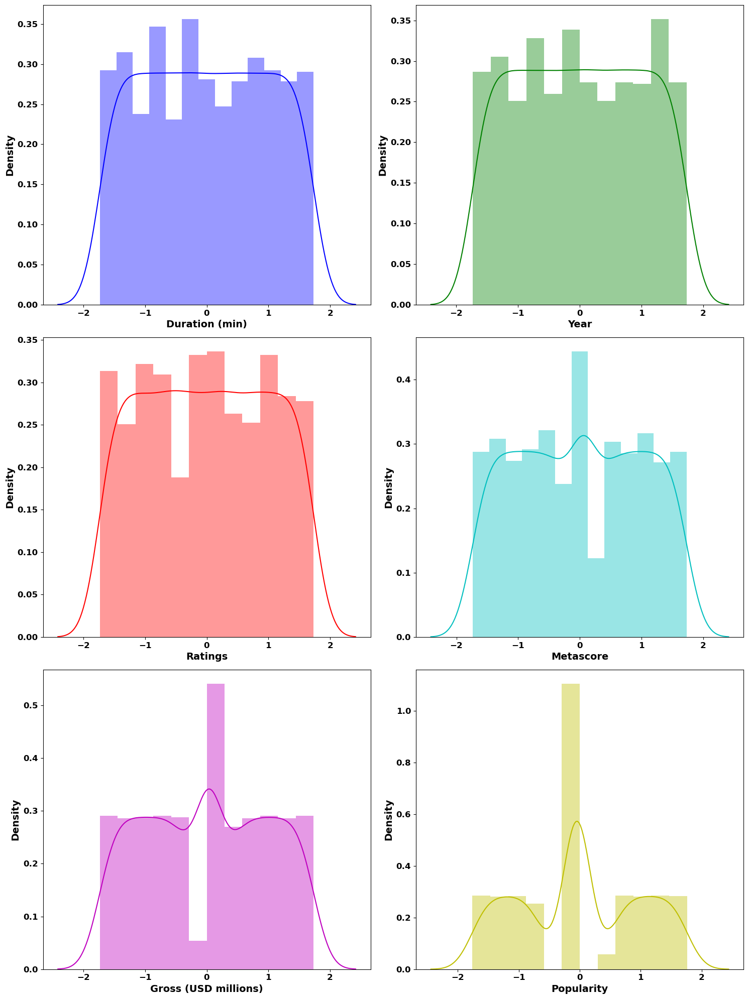

In [241]:
# Visually checking the distribution plots after scaling the data
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k','b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.figure(figsize=(15,20),facecolor='white')
sns.set_palette('rainbow_r')
plotnum=1
for col in x_qtr:
    if plotnum<=30:
        plt.subplot(3,2,plotnum)
        sns.distplot(x[col],color=colors[plotnum-1])
        plt.xlabel(col,fontsize=14,fontweight ='bold')
        plt.ylabel('Density', fontsize=14,fontweight='bold')
        plt.xticks(fontsize=12,fontweight ='bold')
        plt.yticks(fontsize=12,fontweight ='bold')
        plt.tight_layout()
    plotnum+=1
plt.show()

<span style="color:blue; font-weight:bold; font-size:26px;">Principal Component Analysis (PCA)</span>

- **As the dataset has multiple X columns with multi-collinearity, I will use PCA technique to reduce the number of dimensions in a dataset while preserving the most important information in it**
- **Initially, I will calculate the number of components needed to explain the variance**
- **Based on that, I will choose no. of columns required be used in PCA**

In [242]:
from sklearn.decomposition import PCA
pca = PCA().fit(x)

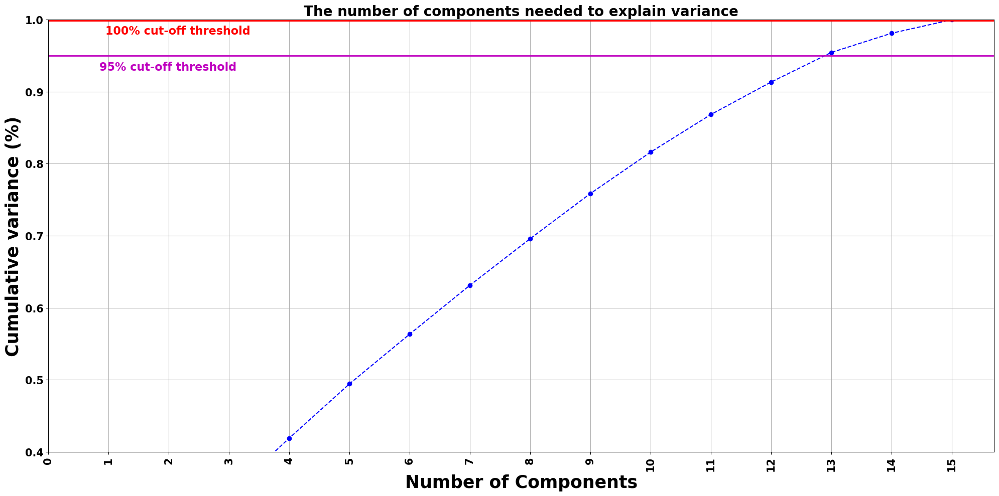

In [243]:
fig, ax = plt.subplots(figsize=(20,10))
xi = np.arange(1, x.shape[1]+1, step=1)
yi = np.cumsum(pca.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components',fontsize=25,fontweight ='bold')
plt.xticks(np.arange(0, x.shape[1]+1, step=1)) 
plt.ylabel('Cumulative variance (%)',fontsize=25,fontweight ='bold')
plt.title('The number of components needed to explain variance',fontsize=20,fontweight ='bold')
plt.axhline(y=1, color='r', linestyle='-',linewidth = '5')
plt.text(0.95, 0.98, '100% cut-off threshold', color = 'red', fontsize=16,fontweight ='bold')
plt.axhline(y=0.95, color='m', linestyle='-',linewidth = '2')
plt.text(0.85, 0.93, '95% cut-off threshold', color = 'm', fontsize=16,fontweight ='bold')
plt.xticks(fontsize=15,fontweight ='bold',rotation=90)
plt.yticks(fontsize=15,fontweight ='bold',rotation=0)
plt.grid(axis = 'x')
plt.grid(True)
plt.ylim(0.4,1.0)
plt.tight_layout()
plt.show()

### Observations:

- **As per the graph, we can see that 13 principal components attribute for 95% of variation in the data. Hence, I will pick 13 components for our prediction**
- **I will use 13 features as no. of components in PCA to reduce the dimensions**

In [244]:
# Applying PCA transformation on X data to reduce the no. of columns
pca=PCA(n_components=13)
xv=pca.fit_transform(x)
xv=pd.DataFrame(xv)
xv.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-1.498732,0.978799,0.066684,-1.707465,1.209424,-0.222916,1.543168,0.599419,-1.028265,-0.212183,2.032338,0.475316,0.218845
1,0.588220,-0.742223,0.405176,0.653560,1.505424,-1.149091,-0.582498,-0.410067,0.651929,1.053299,-0.040022,-0.435155,1.434238
2,0.300391,0.826344,-0.635588,0.353336,-0.370152,-1.380140,-0.391440,2.424053,-0.392425,-0.971065,0.398403,-1.660818,-0.456249
3,1.199909,-0.546904,0.564712,0.904116,-0.136363,-1.888746,0.300694,0.506759,0.719038,-1.087161,-0.364373,0.132340,-1.390443
4,2.447060,3.443031,-0.018290,0.205218,-0.190027,1.354749,0.136676,-0.988319,-0.213323,0.603819,-0.366704,1.004253,0.704552


### Observations:

- **After applying PCA transformation, X dataset is reduced to 13 dimensions. This X data can be used for model training**

<span style="color:blue; font-weight:bold; font-size:26px;">Checking Multicollinearity again after PCA transformation</span>

In [245]:
# Checking multicollinearity using VIF
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

X = xv[list(xv.columns)]
vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['Column'] = X.columns
vif_info.sort_values('VIF', ascending=False)

,VIF,Column
2,1.0,2
5,1.0,5
9,1.0,9
1,1.0,1
3,1.0,3
6,1.0,6
7,1.0,7
8,1.0,8
10,1.0,10
11,1.0,11


### Observations:

- **No multicollinearity is noticed after PCA transformation as VIF < 5 for all features**

In [246]:
yv.shape

(1657,)

In [247]:
xv.shape

(1657, 13)

<span style="color:brown; font-weight:bold; font-size:22px;">** EDA completed for dataframe with target variable "VOTES"  **</span>

<span style="color:blue; font-weight:bold; font-size:26px;">Model Building - REGRESSION with "Gross (USD millions)" as Target Variable</span>

- **Starting with "LinearRegression" to build the model**

In [248]:
x=xg
y=yg

<span style="color:blue; font-weight:bold; font-size:22px;">Finding Best Random State</span>

Best random state: 22, Best R2 score: 54.49


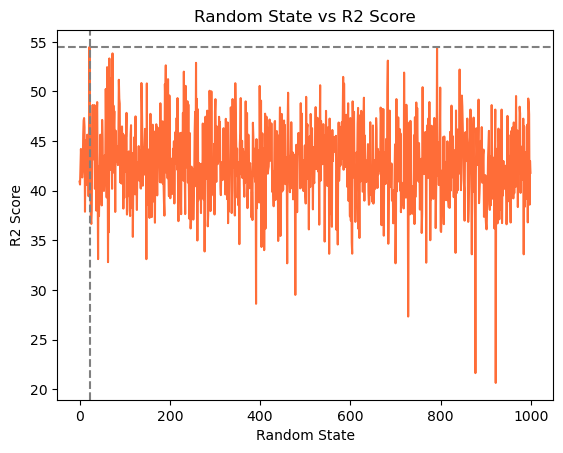

In [249]:
# Defining the required libraries

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score

lr=LinearRegression() # Defining instance for linearregression

# Initialize empty lists for storing the random state values and the performance metric scores
random_states = []
scores = []

# Split the data into train and test sets for different random states
best_score = 0
best_random_state = 0

for i in range(0,1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=i)
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    score = r2_score(y_test, y_pred)

    # Append the random state value and the performance metric score to the lists
    random_states.append(i)
    scores.append(score*100)
    if score > best_score:
        best_score = score
        best_random_state = i

print(f"Best random state: {best_random_state}, Best R2 score: {round((best_score*100),2)}")

# Plot the line chart
plt.plot(random_states, scores)
plt.xlabel('Random State')
plt.ylabel('R2 Score')
plt.title('Random State vs R2 Score')
# Add dashed lines
plt.axhline(y=max(scores), linestyle='--', color='gray')
plt.axvline(best_random_state, linestyle='--', color='gray')
plt.show()

In [250]:
# Best Random State
BRS=best_random_state
BRS

22

### Observations: 

- **From the above plot, best random state is 22 where testing R2 score is high. This random state will be used for buidling all regression models**

In [251]:
# Using the best random state and splitting the data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=BRS)

In [252]:
# Training the model and checking  metrics with the fixed random state
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)

print("Model : Linear Regression Metrics")
r2_score_lr=r2_score(y_test,pred_test)
print("R2 Score : ",round(r2_score(y_test,pred_test)*100,1))
mae_lr=mean_absolute_error(y_test,pred_test)
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred_test))
mse_lr=mean_squared_error(y_test,pred_test)
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred_test))
rmse_lr=np.sqrt(mean_squared_error(y_test,pred_test))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred_test)))

Model : Linear Regression Metrics
R2 Score :  54.5
Mean Absolute Error(MAE) :  41.67988487701793
Mean Squared Error(MSE) :  3455.9711541671945
Root Mean Squared Error(RMSE) :  58.78750848749413


<span style="color:blue; font-weight:bold; font-size:22px;">Cross Validation for Linear Regression</span>

- **Finding the best no. folds where the delta is least between cross validation and model scores.**

Model score: 54.4914
CV score with 2 folds: 41.5016
CV score with 3 folds: 42.6959
CV score with 4 folds: 42.1681
CV score with 5 folds: 41.6830
CV score with 6 folds: 41.8126
CV score with 7 folds: 41.5319
CV score with 8 folds: 41.1515
CV score with 9 folds: 40.9667
CV score with 10 folds: 42.1917
CV score with 11 folds: 41.6503
CV score with 12 folds: 41.4743
CV score with 13 folds: 42.0162
CV score with 14 folds: 41.7373
CV score with 15 folds: 41.5860
CV score with 16 folds: 41.5928
CV score with 17 folds: 41.5793
CV score with 18 folds: 41.6800
CV score with 19 folds: 42.1783
CV score with 20 folds: 41.5765
Best number of folds: 3


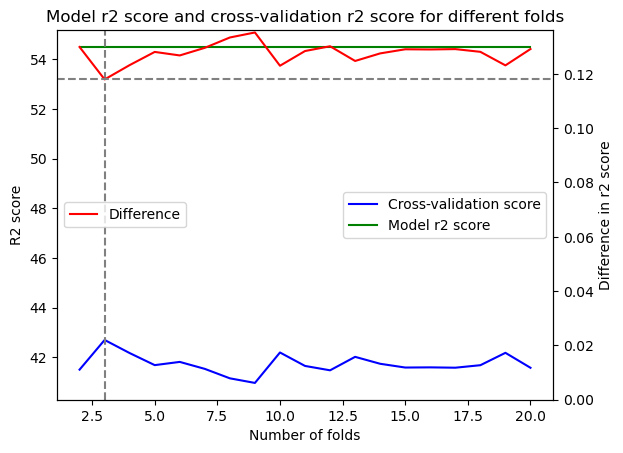

In [253]:
from sklearn.model_selection  import cross_val_score

pred_lr=lr.predict(x_test)
lss=r2_score(y_test,pred_lr)

# Finding the optimized folds from Linear Regression where the cross validation score is same as model score

No_of_Folds=[]
CV_Score=[]
Model_Score=[]
Difference=[]

folds_range = range(2, 21)

for j in folds_range:
    lsscore=cross_val_score(lr,x,y,cv=j)
    lsc=lsscore.mean()
    No_of_Folds.append(j)
    CV_Score.append(lsc*100)
    Model_Score.append(lss*100)
    Difference.append(abs(lsc-lss))

# Find the best number of folds based on smallest difference between cross-validation score and model score

best_n_folds = folds_range[np.argmin(Difference)]

# Print the results
print("Model score: {:.4f}".format(lss*100))
for n_folds, cv_score in zip(folds_range, CV_Score):
    print("CV score with {} folds: {:.4f}".format(n_folds, cv_score))
print("Best number of folds: {}".format(best_n_folds))

# plot cross-validation scores and model scores for each number of folds
fig, ax1 = plt.subplots()
ax1.plot(No_of_Folds, CV_Score, label='Cross-validation score', color='blue')
ax1.plot(No_of_Folds, Model_Score, label='Model r2 score', color='green')
ax1.set_xlabel('Number of folds')
ax1.set_ylabel('R2 score')

ax2 = ax1.twinx()
ax2.plot(No_of_Folds, Difference, label='Difference', color='red')
ax2.set_ylabel('Difference in r2 score')
ax2.set_ylim(bottom=0)

# Add dashed lines
ax1.axvline(best_n_folds, linestyle='--', color='gray')
ax2.axhline(min(Difference), linestyle='--', color='gray')

plt.title('Model r2 score and cross-validation r2 score for different folds')
ax1.legend(loc='center right')
ax2.legend(loc='center')
plt.legend(['Difference'], loc='center left')
plt.show()

In [254]:
# Getting the best no. of folds where the least difference between cross validation score and model score
BCV=best_n_folds
BCV

3

### Observations: 

- **Considered the no. folds where the delta is least between cross validation and model scores. In this case, selected CV=3**

In [255]:
# Using best CV value and checking the cross validation score again to compare with model score
lsscore=cross_val_score(lr,x,y,cv=BCV)
lsscore_selected=cross_val_score(lr,x,y,cv=BCV).mean()

print("CV R2 scores for each fold are: ", lsscore*100)
print("Mean CV R2 score:", round(lsscore_selected*100,1))
print("Model R2 score:", round(lss*100,1))
print("Difference in R2 Scores:", round(lss-lsscore_selected,5))
print('-'*80)
print("Model : Linear Regression Metrics")
r2_score_lr=r2_score(y_test,pred_test)
print("R2 Score : ",round(r2_score(y_test,pred_test)*100,1))
mae_lr=mean_absolute_error(y_test,pred_test)
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred_test))
mse_lr=mean_squared_error(y_test,pred_test)
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred_test))
rmse_lr=np.sqrt(mean_squared_error(y_test,pred_test))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred_test)))

CV R2 scores for each fold are:  [41.86467315 41.04354245 45.17934163]
Mean CV R2 score: 42.7
Model R2 score: 54.5
Difference in R2 Scores: 0.11796
--------------------------------------------------------------------------------
Model : Linear Regression Metrics
R2 Score :  54.5
Mean Absolute Error(MAE) :  41.67988487701793
Mean Squared Error(MSE) :  3455.9711541671945
Root Mean Squared Error(RMSE) :  58.78750848749413


<span style="color:blue; font-weight:bold; font-size:22px;">Other Regression Algorithms</span>

In [256]:
from sklearn.tree import DecisionTreeRegressor          # DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor       # KNeighborsRegressor
from sklearn.linear_model import SGDRegressor           # Gradient Descent Regressor
from sklearn.svm import SVR                             # Support Vector Regressor
from sklearn.linear_model import Lasso                  # Lasso Regressor
from sklearn.linear_model import Ridge                  # Ridge Regressor
from sklearn.linear_model import ElasticNet             # Elastic Net Regressor
from sklearn.ensemble import RandomForestRegressor      # RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor        # ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor  # GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor          # AdaBoostRegressor
from xgboost import XGBRegressor                        # XGBRegressor

# Defining the list with all Algorithms

models=[('DecisionTreeRegressor()',DecisionTreeRegressor()),('KNeighborsRegressor()',KNeighborsRegressor()),
        ('SGDRegressor()',SGDRegressor()),('SVR()',SVR()),('Lasso()',Lasso()),('Ridge()',Ridge()),
        ('ElasticNet()',ElasticNet()),('RandomForestRegressor()',RandomForestRegressor()),
        ('ExtraTreesRegressor()',ExtraTreesRegressor()),('GradientBoostingRegressor()',GradientBoostingRegressor()),
        ('AdaBoostRegressor()',AdaBoostRegressor()),('XGBRegressor()',XGBRegressor())]

# Defining empty lists
Model=[lr]
CV_Score=[round(lsscore_selected*100,1)]
Model_Score=[round(lss*100,1)]
Difference=[abs(lss-lsscore_selected)]
MAE=[mean_absolute_error(y_test,pred_lr)]
MSE=[mean_squared_error(y_test,pred_lr)]
RMSE=[np.sqrt(mean_squared_error(y_test,pred_lr))]

# Loop for all algorithms to train the model and for the cross validation
for model in models:
    model[1].fit(x_train,y_train)                             # Train the model
    pred_test=model[1].predict(x_test)                        # Predict Y values from the model using X test
    Model_Score.append(r2_score(y_test,pred_test)*100)        # Appending "R2 Score" to the list 
    MAE.append(mean_absolute_error(y_test,pred_test))         # Appending "MAE" to the list 
    MSE.append(mean_squared_error(y_test,pred_test))          # Appending "MSE" to the list 
    RMSE.append(np.sqrt(mean_squared_error(y_test,pred_test)))# Appending "RMSE" to the list 
    
    cvscore=cross_val_score(model[1],x,y,cv=BCV)               # Cross Validation score calculation for all folds
    score = cvscore.mean()                                     # Cross Validation mean score calculation             
    CV_Score.append(round(score*100,1))                                # Appending "cross validation score" to the list
    Difference.append(abs(r2_score(y_test,pred_test)-score)) # Appending "Difference b/w CV and model scores" to the list
    Model.append(model[0])                                    # Appending "Model" to the list
    
# Create a Pandas DataFrame to display the scores for each model
scores_df = pd.DataFrame({'Model': Model,
                          'Model R2 score': Model_Score,
                          'CV R2 score': CV_Score,
                          'MAE': MAE,
                          'MSE': MSE,
                          'RMSE': RMSE,
                          'Difference in R2 Scores':Difference})

print('\033[1m'+"Table with performance of the models"+'\033[0m\n')
scores_df.sort_values(by=["Model R2 score"],ascending=False)  # sorting the score table using the model score

Table with performance of the models



,Model,Model R2 score,CV R2 score,MAE,MSE,RMSE,Difference in R2 Scores
9,ExtraTreesRegressor(),56.485939,47.3,37.384764,3304.501865,57.484797,0.091930
10,GradientBoostingRegressor(),55.384056,46.5,38.277210,3388.179978,58.208075,0.088976
8,RandomForestRegressor(),55.221761,43.5,37.799800,3400.504833,58.313848,0.116727
0,LinearRegression(),54.500000,42.7,41.679885,3455.971154,58.787508,0.117955
6,Ridge(),54.490713,42.7,41.672483,3456.021335,58.787935,0.117920
3,SGDRegressor(),54.476656,42.3,41.686667,3457.088877,58.797014,0.121403
5,Lasso(),54.414536,42.9,41.161765,3461.806294,58.837117,0.115283
7,ElasticNet(),49.704884,40.1,41.858856,3819.462057,61.801797,0.096194
2,KNeighborsRegressor(),44.387714,42.6,39.129700,4223.253336,64.986563,0.017565
12,XGBRegressor(),38.168520,40.4,40.667898,4695.545170,68.524048,0.022430


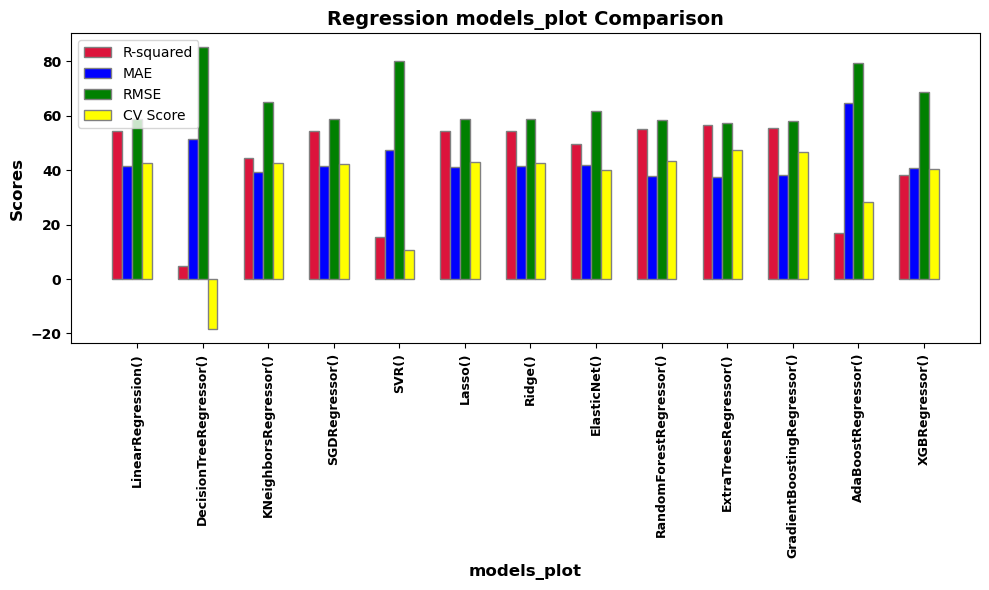

In [257]:
# Plotting all models_plot metrics
models_plot = ['LinearRegression()','DecisionTreeRegressor()','KNeighborsRegressor()','SGDRegressor()','SVR()','Lasso()','Ridge()','ElasticNet()',
          'RandomForestRegressor()','ExtraTreesRegressor()','GradientBoostingRegressor()','AdaBoostRegressor()','XGBRegressor()']

barWidth = 0.15 # set width of bars

# set heights of bars
r2_bar = Model_Score
mae_bar = MAE
RMSE_bar = RMSE
cv_bar = CV_Score

# set positions of bars on x-axis
pos1 = np.arange(len(Model_Score))
pos2 = [x + barWidth for x in pos1]
pos3 = [x + barWidth for x in pos2]
pos4 = [x + barWidth for x in pos3]

# define colors for each bar
colors = ['crimson','blue','green', 'yellow', 'magenta']

# create subplots with figsize parameter to control figure size
fig, ax = plt.subplots(figsize=(10,6))

# create bar plots with defined colors
ax.bar(pos1, r2_bar, color=colors[0], width=barWidth, edgecolor='grey', label='R-squared')
ax.bar(pos2, mae_bar, color=colors[1], width=barWidth, edgecolor='grey', label='MAE')
ax.bar(pos3, RMSE_bar, color=colors[2], width=barWidth, edgecolor='grey', label='RMSE')
ax.bar(pos4, cv_bar, color=colors[3], width=barWidth, edgecolor='grey', label='CV Score')

plt.title('Regression models_plot Comparison',fontsize=14, fontweight='bold')
plt.xticks([r + barWidth*2 for r in range(len(Model_Score))], models_plot,fontsize=9,fontweight ='bold',rotation=90)
plt.yticks(fontsize=10,fontweight ='bold')
plt.xlabel('models_plot',fontsize=12,fontweight ='bold')
plt.ylabel('Scores',fontsize=12,fontweight ='bold')
plt.legend()
plt.tight_layout()
plt.show()

### Observations: 

- **Based on the above summary, I have considered "ExtraTreesRegressor()" as the best model because the model r2_score, cross validation scores are high and also MAE, MSE and RMSE are lower compared to other regression models** 
- **Hyper parameter tuning will be performed for "ExtraTreesRegressor()"**

<span style="color:blue; font-weight:bold; font-size:22px;">Hyper Parameter Tuning</span>

In [263]:
from sklearn.model_selection import GridSearchCV

# Defining parameters for ExtraTreesRegressor

# Number of trees in Extra Tree
n_estimators = [100,200,300]
# Scoring criterion
criterion=["squared_error", "absolute_error", "friedman_mse"]
# Number of features to consider at every split
max_features = ['sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [2,4,7,10]
# Minimum number of samples required to split a node
min_samples_split = [2,5,10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [2,4,8]

# Create the random grid
parameters = {'n_estimators': n_estimators,
              'criterion':criterion,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [264]:
GCV=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5,n_jobs=-1)  # Defining instance for GridSearchCV
GCV.fit(x_train,y_train)   # Apply GridSearchCV to train the model with all combination of parameters
GCV.best_params_   # printing the best parameters

{'criterion': 'squared_error',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 100}

In [265]:
# Training the model using best parameters from GridSearchCV and checking the metrics
ht_model=ExtraTreesRegressor(n_estimators=GCV.best_params_['n_estimators'],criterion=GCV.best_params_['criterion'],
                                    max_features=GCV.best_params_['max_features'],max_depth=GCV.best_params_['max_depth'],
                                    min_samples_split=GCV.best_params_['min_samples_split'],min_samples_leaf=GCV.best_params_['min_samples_leaf'])
ht_model.fit(x_train,y_train)
pred=ht_model.predict(x_test)

print('\033[1m'+"Model : ExtraTreesRegressor Metrics"+'\033[0m\n')
print("R2 Score : ",round(r2_score(y_test,pred)*100,1))
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred))
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred)))

Model : ExtraTreesRegressor Metrics

R2 Score :  51.2
Mean Absolute Error(MAE) :  41.7306856867984
Mean Squared Error(MSE) :  3709.5203950054615
Root Mean Squared Error(RMSE) :  60.905832192044315


In [266]:
# Using best CV value and checking the cross validation score again to compare with model score
cvscores = cross_val_score(ht_model, x, y, cv=BCV)
score = cvscores.mean()
ms=r2_score(y_test,pred)

print("CV R2 scores for each fold are: ", cvscores*100)
print("Mean CV R2 score:", round(score*100,1))
print("Model R2 score:", round(ms*100,1))
print("Difference in R2 Scores:", round(ms-score,5))

CV R2 scores for each fold are:  [40.41264346 42.67869415 48.50139343]
Mean CV R2 score: 43.9
Model R2 score: 51.2
Difference in R2 Scores: 0.07288


### Observations for Hyper Parameter Tuning: 

- **Hyper Parameter Tuned model has lower R2 score and lower cross-validation scores compared to the model with default parameters for ExtraTreesRegressor, hence considered the final model with default parameters for saving**
- **Considering the ExtraTreeRegressor() model with default parameters as the best and final model for saving**
- **I wanted to try again hyper parameter tuning with increased search space of parameters but it is taking more time to run due to limited computational ability of my laptop, hence taken a decision based on the initial tested hyper parameters**
- **If I try with increased search space of parameters, then I can expect improved scores compared to the model with default parameters, however, in this project, I am saving the model with default parameters due to high R2 score, high cross validation score and low MAE, MSE and RMSE values compared to the hyper parameter tuned model**

<span style="color:blue; font-weight:bold; font-size:22px;">Model Saving - Gross Collection Prediction</span>

In [267]:
import pickle
filename='IMDb_Gross_Collection_Prediction.pkl'
pickle.dump(models[8][1], open(filename,'wb'))  # saving the Hyper Parameter Tuned ExtraTreeRegressor model

<span style="color:blue; font-weight:bold; font-size:22px;">Conclusion from Gross Collection Prediction Model</span>

In [268]:
loaded_model=pickle.load(open('IMDb_Gross_Collection_Prediction.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)
Predicted=loaded_model.predict(x_test)
Original=np.array(y_test)
Predicted_df=pd.DataFrame(data=Predicted,columns=["Predicted"])
Original_df=pd.DataFrame(data=Original,columns=["Original"])
conclusion=pd.concat([Predicted_df,Original_df],axis=1)
conclusion.head(10)

56.48593889438771


,Predicted,Original
0,34.1664,35.09
1,26.8761,32.72
2,58.9961,24.01
3,32.1492,10.02
4,22.5866,22.19
5,330.1675,424.67
6,13.6061,35.11
7,43.9255,18.21
8,16.0571,13.08
9,49.8113,45.80


 True Values Vs Predicted Values plot :


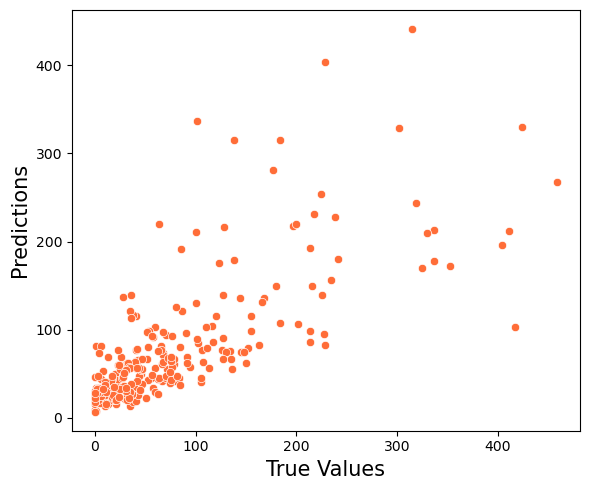

In [269]:
plt.figure(figsize=(6,5))
sns.scatterplot(y_test.round(2), Predicted)
print('\033[1m'+' True Values Vs Predicted Values plot :' +'\033[0m')
plt.xlabel('True Values' , fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()

<span style="color:brown; font-weight:bold; font-size:22px;">** Model building completed for dataframe with target variable "GROSS COLLECTION"  **</span>

<span style="color:blue; font-weight:bold; font-size:26px;">Model Building - REGRESSION - "Votes" as Target Variable</span>

- **Starting with "LinearRegression" to build the model**

In [270]:
x=xv
y=yv

<span style="color:blue; font-weight:bold; font-size:22px;">Finding Best Random State</span>

Best random state: 384, Best R2 score: 58.46


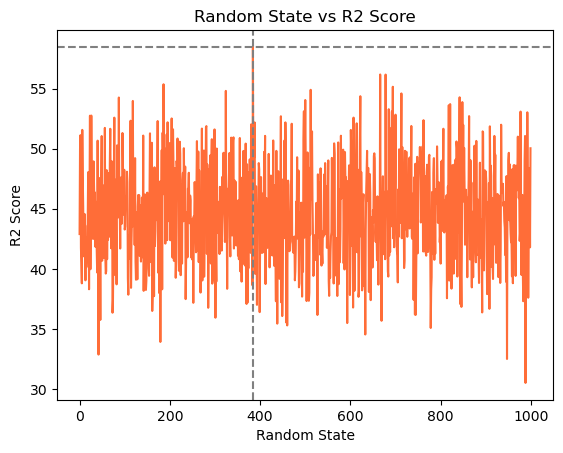

In [271]:
# Defining the required libraries

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score

lr=LinearRegression() # Defining instance for linearregression

# Initialize empty lists for storing the random state values and the performance metric scores
random_states = []
scores = []

# Split the data into train and test sets for different random states
best_score = 0
best_random_state = 0

for i in range(0,1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=i)
    lr.fit(x_train, y_train)
    y_pred = lr.predict(x_test)
    score = r2_score(y_test, y_pred)

    # Append the random state value and the performance metric score to the lists
    random_states.append(i)
    scores.append(score*100)
    if score > best_score:
        best_score = score
        best_random_state = i

print(f"Best random state: {best_random_state}, Best R2 score: {round((best_score*100),2)}")

# Plot the line chart
plt.plot(random_states, scores)
plt.xlabel('Random State')
plt.ylabel('R2 Score')
plt.title('Random State vs R2 Score')
# Add dashed lines
plt.axhline(y=max(scores), linestyle='--', color='gray')
plt.axvline(best_random_state, linestyle='--', color='gray')
plt.show()

In [272]:
# Best Random State
BRS=best_random_state
BRS

384

### Observations: 

- **From the above plot, best random state is 384 where testing R2 score is high. This random state will be used for buidling all regression models**

In [273]:
# Using the best random state and splitting the data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=BRS)

In [274]:
# Training the model and checking  metrics with the fixed random state
lr.fit(x_train,y_train)
pred_test=lr.predict(x_test)

print("Model : Linear Regression Metrics")
r2_score_lr=r2_score(y_test,pred_test)
print("R2 Score : ",round(r2_score(y_test,pred_test)*100,1))
mae_lr=mean_absolute_error(y_test,pred_test)
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred_test))
mse_lr=mean_squared_error(y_test,pred_test)
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred_test))
rmse_lr=np.sqrt(mean_squared_error(y_test,pred_test))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred_test)))

Model : Linear Regression Metrics
R2 Score :  58.5
Mean Absolute Error(MAE) :  82962.5085463213
Mean Squared Error(MSE) :  11990007035.18451
Root Mean Squared Error(RMSE) :  109498.89056599847


<span style="color:blue; font-weight:bold; font-size:22px;">Cross Validation for Linear Regression</span>

- **Finding the best no. folds where the delta is least between cross validation and model scores.**

Model score: 58.4609
CV score with 2 folds: 44.2369
CV score with 3 folds: 44.3585
CV score with 4 folds: 44.8077
CV score with 5 folds: 45.5378
CV score with 6 folds: 45.0239
CV score with 7 folds: 45.7702
CV score with 8 folds: 45.6860
CV score with 9 folds: 45.7893
CV score with 10 folds: 45.3571
CV score with 11 folds: 44.5455
CV score with 12 folds: 45.7349
CV score with 13 folds: 45.1317
CV score with 14 folds: 45.6840
CV score with 15 folds: 45.2212
CV score with 16 folds: 46.0162
CV score with 17 folds: 45.4551
CV score with 18 folds: 45.7260
CV score with 19 folds: 46.0008
CV score with 20 folds: 44.7837
Best number of folds: 16


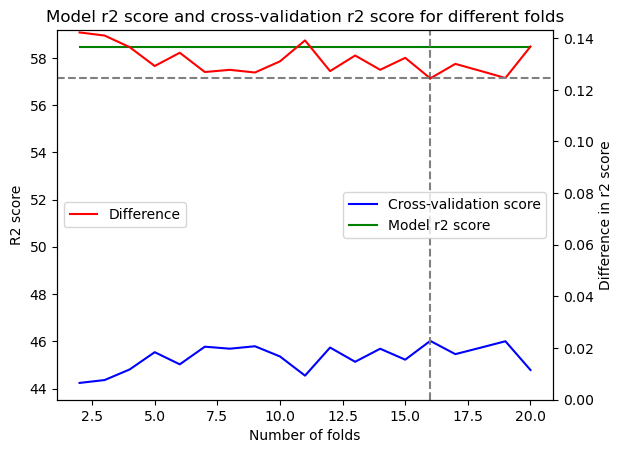

In [275]:
from sklearn.model_selection  import cross_val_score

pred_lr=lr.predict(x_test)
lss=r2_score(y_test,pred_lr)

# Finding the optimized folds from Linear Regression where the cross validation score is same as model score

No_of_Folds=[]
CV_Score=[]
Model_Score=[]
Difference=[]

folds_range = range(2, 21)

for j in folds_range:
    lsscore=cross_val_score(lr,x,y,cv=j)
    lsc=lsscore.mean()
    No_of_Folds.append(j)
    CV_Score.append(lsc*100)
    Model_Score.append(lss*100)
    Difference.append(abs(lsc-lss))

# Find the best number of folds based on smallest difference between cross-validation score and model score

best_n_folds = folds_range[np.argmin(Difference)]

# Print the results
print("Model score: {:.4f}".format(lss*100))
for n_folds, cv_score in zip(folds_range, CV_Score):
    print("CV score with {} folds: {:.4f}".format(n_folds, cv_score))
print("Best number of folds: {}".format(best_n_folds))

# plot cross-validation scores and model scores for each number of folds
fig, ax1 = plt.subplots()
ax1.plot(No_of_Folds, CV_Score, label='Cross-validation score', color='blue')
ax1.plot(No_of_Folds, Model_Score, label='Model r2 score', color='green')
ax1.set_xlabel('Number of folds')
ax1.set_ylabel('R2 score')

ax2 = ax1.twinx()
ax2.plot(No_of_Folds, Difference, label='Difference', color='red')
ax2.set_ylabel('Difference in r2 score')
ax2.set_ylim(bottom=0)

ax1.axvline(best_n_folds, linestyle='--', color='gray')
ax2.axhline(min(Difference), linestyle='--', color='gray')

plt.title('Model r2 score and cross-validation r2 score for different folds')
ax1.legend(loc='center right')
ax2.legend(loc='center')
plt.legend(['Difference'], loc='center left')
plt.show()

In [276]:
# Getting the best no. of folds where the least difference between cross validation score and model score
BCV=best_n_folds
BCV

16

### Observations: 

- **Considered the no. folds where the delta is least between cross validation and model scores. In this case, selected CV=16**

In [277]:
# Using best CV value and checking the cross validation score again to compare with model score
lsscore=cross_val_score(lr,x,y,cv=BCV)
lsscore_selected=cross_val_score(lr,x,y,cv=BCV).mean()

print("CV R2 scores for each fold are: ", lsscore*100)
print("Mean CV R2 score:", round(lsscore_selected*100,1))
print("Model R2 score:", round(lss*100,1))
print("Difference in R2 Scores:", round(lss-lsscore_selected,5))
print('-'*80)
print("Model : Linear Regression Metrics")
r2_score_lr=r2_score(y_test,pred_test)
print("R2 Score : ",round(r2_score(y_test,pred_test)*100,1))
mae_lr=mean_absolute_error(y_test,pred_test)
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred_test))
mse_lr=mean_squared_error(y_test,pred_test)
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred_test))
rmse_lr=np.sqrt(mean_squared_error(y_test,pred_test))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred_test)))

CV R2 scores for each fold are:  [44.92812634 54.80280119 55.98526353 45.1112919  33.30757297 45.74277333
 41.58103452 51.82027639 38.67879502 60.27546148 49.34269353 45.13981315
 55.04402989 42.18973228 43.51450363 28.79489754]
Mean CV R2 score: 46.0
Model R2 score: 58.5
Difference in R2 Scores: 0.12445
--------------------------------------------------------------------------------
Model : Linear Regression Metrics
R2 Score :  58.5
Mean Absolute Error(MAE) :  82962.5085463213
Mean Squared Error(MSE) :  11990007035.18451
Root Mean Squared Error(RMSE) :  109498.89056599847


<span style="color:blue; font-weight:bold; font-size:22px;">Other Regression Algorithms</span>

In [278]:
from sklearn.tree import DecisionTreeRegressor          # DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor       # KNeighborsRegressor
from sklearn.linear_model import SGDRegressor           # Gradient Descent Regressor
from sklearn.svm import SVR                             # Support Vector Regressor
from sklearn.linear_model import Lasso                  # Lasso Regressor
from sklearn.linear_model import Ridge                  # Ridge Regressor
from sklearn.linear_model import ElasticNet             # Elastic Net Regressor
from sklearn.ensemble import RandomForestRegressor      # RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor        # ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor  # GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor          # AdaBoostRegressor
from xgboost import XGBRegressor                        # XGBRegressor

# Defining the list with all Algorithms

models=[('DecisionTreeRegressor()',DecisionTreeRegressor()),('KNeighborsRegressor()',KNeighborsRegressor()),
        ('SGDRegressor()',SGDRegressor()),('SVR()',SVR()),('Lasso()',Lasso()),('Ridge()',Ridge()),
        ('ElasticNet()',ElasticNet()),('RandomForestRegressor()',RandomForestRegressor()),
        ('ExtraTreesRegressor()',ExtraTreesRegressor()),('GradientBoostingRegressor()',GradientBoostingRegressor()),
        ('AdaBoostRegressor()',AdaBoostRegressor()),('XGBRegressor()',XGBRegressor())]

# Defining empty lists
Model=[lr]
CV_Score=[round(lsscore_selected*100,1)]
Model_Score=[round(lss*100,1)]
Difference=[abs(lss-lsscore_selected)]
MAE=[mean_absolute_error(y_test,pred_lr)]
MSE=[mean_squared_error(y_test,pred_lr)]
RMSE=[np.sqrt(mean_squared_error(y_test,pred_lr))]

# Loop for all algorithms to train the model and for the cross validation
for model in models:
    model[1].fit(x_train,y_train)                             # Train the model
    pred_test=model[1].predict(x_test)                        # Predict Y values from the model using X test
    Model_Score.append(r2_score(y_test,pred_test)*100)        # Appending "R2 Score" to the list 
    MAE.append(mean_absolute_error(y_test,pred_test))         # Appending "MAE" to the list 
    MSE.append(mean_squared_error(y_test,pred_test))          # Appending "MSE" to the list 
    RMSE.append(np.sqrt(mean_squared_error(y_test,pred_test)))# Appending "RMSE" to the list 
    
    cvscore=cross_val_score(model[1],x,y,cv=BCV)               # Cross Validation score calculation for all folds
    score = cvscore.mean()                                     # Cross Validation mean score calculation             
    CV_Score.append(round(score*100,1))                                # Appending "cross validation score" to the list
    Difference.append(abs(r2_score(y_test,pred_test)-score)) # Appending "Difference b/w CV and model scores" to the list
    Model.append(model[0])                                    # Appending "Model" to the list
    
# Create a Pandas DataFrame to display the scores for each model
scores_df = pd.DataFrame({'Model': Model,
                          'Model R2 score': Model_Score,
                          'CV R2 score': CV_Score,
                          'MAE': MAE,
                          'MSE': MSE,
                          'RMSE': RMSE,
                          'Difference in R2 Scores':Difference})

print('\033[1m'+"Table with performance of the models"+'\033[0m\n')
scores_df.sort_values(by=["Model R2 score"],ascending=False)  # sorting the score table using the model score

Table with performance of the models



,Model,Model R2 score,CV R2 score,MAE,MSE,RMSE,Difference in R2 Scores
9,ExtraTreesRegressor(),65.872807,66.5,68599.808886,9.850597e+09,99250.172027,0.006056
2,KNeighborsRegressor(),64.688927,56.9,70182.366265,1.019232e+10,100957.000780,0.077506
10,GradientBoostingRegressor(),60.502505,61.7,72722.793959,1.140070e+10,106774.060074,0.011571
8,RandomForestRegressor(),59.104507,63.1,73056.424187,1.180422e+10,108647.241596,0.039823
3,SGDRegressor(),58.551636,46.1,82858.952028,1.196381e+10,109379.184416,0.124234
0,LinearRegression(),58.500000,46.0,82962.508546,1.199001e+10,109498.890566,0.124447
6,Ridge(),58.464521,46.0,82952.559426,1.198895e+10,109494.069555,0.124458
5,Lasso(),58.460876,46.0,82962.208790,1.199000e+10,109498.873703,0.124446
7,ElasticNet(),56.061747,44.3,83278.054667,1.268250e+10,112616.590657,0.117567
12,XGBRegressor(),55.689375,60.7,74111.913968,1.278998e+10,113092.791069,0.050589


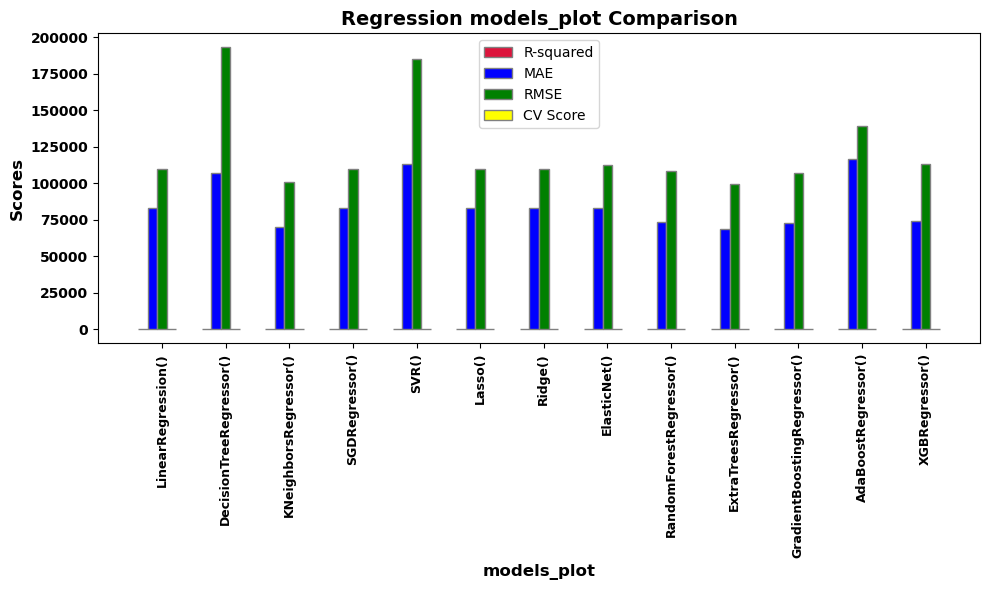

In [279]:
# Plotting all models_plot metrics
models_plot = ['LinearRegression()','DecisionTreeRegressor()','KNeighborsRegressor()','SGDRegressor()','SVR()','Lasso()','Ridge()','ElasticNet()',
          'RandomForestRegressor()','ExtraTreesRegressor()','GradientBoostingRegressor()','AdaBoostRegressor()','XGBRegressor()']

barWidth = 0.15 # set width of bars

# set heights of bars
r2_bar = Model_Score
mae_bar = MAE
RMSE_bar = RMSE
cv_bar = CV_Score

# set positions of bars on x-axis
pos1 = np.arange(len(Model_Score))
pos2 = [x + barWidth for x in pos1]
pos3 = [x + barWidth for x in pos2]
pos4 = [x + barWidth for x in pos3]

# define colors for each bar
colors = ['crimson','blue','green', 'yellow', 'magenta']

# create subplots with figsize parameter to control figure size
fig, ax = plt.subplots(figsize=(10,6))

# create bar plots with defined colors
ax.bar(pos1, r2_bar, color=colors[0], width=barWidth, edgecolor='grey', label='R-squared')
ax.bar(pos2, mae_bar, color=colors[1], width=barWidth, edgecolor='grey', label='MAE')
ax.bar(pos3, RMSE_bar, color=colors[2], width=barWidth, edgecolor='grey', label='RMSE')
ax.bar(pos4, cv_bar, color=colors[3], width=barWidth, edgecolor='grey', label='CV Score')

plt.title('Regression models_plot Comparison',fontsize=14, fontweight='bold')
plt.xticks([r + barWidth*2 for r in range(len(Model_Score))], models_plot,fontsize=9,fontweight ='bold',rotation=90)
plt.yticks(fontsize=10,fontweight ='bold')
plt.xlabel('models_plot',fontsize=12,fontweight ='bold')
plt.ylabel('Scores',fontsize=12,fontweight ='bold')
plt.legend()
plt.tight_layout()
plt.show()

### Observations: 

- **Based on the above summary, I have considered "ExtraTreesRegressor()" as the best model because the model r2_score, cross validation scores are high and also MAE, MSE and RMSE are lower compared to other regression models** 
- **Hyper parameter tuning will be performed for "ExtraTreesRegressor()"**

<span style="color:blue; font-weight:bold; font-size:22px;">Hyper Parameter Tuning</span>

In [280]:
from sklearn.model_selection import GridSearchCV

# Defining parameters for ExtraTreesRegressor

# Number of trees in Extra Tree
n_estimators = [100,200,300]
# Scoring criterion
criterion=["squared_error", "absolute_error", "friedman_mse"]
# Number of features to consider at every split
max_features = ['sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [2,4,7,10]
# Minimum number of samples required to split a node
min_samples_split = [2,5,10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [2,4,8]

# Create the random grid
parameters = {'n_estimators': n_estimators,
              'criterion':criterion,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [281]:
GCV=GridSearchCV(ExtraTreesRegressor(),parameters,cv=5,n_jobs=-1)  # Defining instance for GridSearchCV
GCV.fit(x_train,y_train)   # Apply GridSearchCV to train the model with all combination of parameters
GCV.best_params_   # printing the best parameters

{'criterion': 'friedman_mse',
 'max_depth': 10,
 'max_features': 'sqrt',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 300}

In [282]:
# Training the model using best parameters from GridSearchCV and checking the metrics
ht_model=ExtraTreesRegressor(n_estimators=GCV.best_params_['n_estimators'],criterion=GCV.best_params_['criterion'],
                                    max_features=GCV.best_params_['max_features'],max_depth=GCV.best_params_['max_depth'],
                                    min_samples_split=GCV.best_params_['min_samples_split'],min_samples_leaf=GCV.best_params_['min_samples_leaf'])
ht_model.fit(x_train,y_train)
pred=ht_model.predict(x_test)

print('\033[1m'+"Model : ExtraTreesRegressor Metrics"+'\033[0m\n')
print("R2 Score : ",round(r2_score(y_test,pred)*100,1))
print("Mean Absolute Error(MAE) : ",mean_absolute_error(y_test,pred))
print("Mean Squared Error(MSE) : ",mean_squared_error(y_test,pred))
print("Root Mean Squared Error(RMSE) : ",np.sqrt(mean_squared_error(y_test,pred)))

Model : ExtraTreesRegressor Metrics

R2 Score :  59.7
Mean Absolute Error(MAE) :  79210.02287009632
Mean Squared Error(MSE) :  11642707839.676512
Root Mean Squared Error(RMSE) :  107901.38015649527


In [283]:
# Using best CV value and checking the cross validation score again to compare with model score
cvscores = cross_val_score(ht_model, x, y, cv=BCV)
score = cvscores.mean()
ms=r2_score(y_test,pred)

print("CV R2 scores for each fold are: ", cvscores*100)
print("Mean CV R2 score:", round(score*100,1))
print("Model R2 score:", round(ms*100,1))
print("Difference in R2 Scores:", round(ms-score,5))

CV R2 scores for each fold are:  [54.07771198 62.65951104 56.2076877  48.0470849  40.28758846 55.94112672
 57.08788814 49.51936309 52.47815776 59.77786139 47.42938819 45.03106215
 56.6307378  54.42324337 47.5388112  43.63274944]
Mean CV R2 score: 51.9
Model R2 score: 59.7
Difference in R2 Scores: 0.07741


### Observations for Hyper Parameter Tuning: 

- **Hyper Parameter Tuned model has lower R2 score and lower cross-validation scores compared to the model with default parameters for ExtraTreesRegressor, hence considered the final model with default parameters for saving**
- **Considering the ExtraTreeRegressor() model with default parameters as the best and final model for saving**
- **I wanted to try again hyper parameter tuning with increased search space of parameters but it is taking more time to run due to limited computational ability of my laptop, hence taken a decision based on the initial tested hyper parameters**
- **If I try with increased search space of parameters, then I can expect improved scores compared to the model with default parameters, however, in this project, I am saving the model with default parameters due to high R2 score, high cross validation score and low MAE, MSE and RMSE values compared to the hyper parameter tuned model**

<span style="color:blue; font-weight:bold; font-size:22px;">Model Saving for Votes Prediction</span>

In [284]:
import pickle
filename='IMDb_Votes_Prediction.pkl'
pickle.dump(models[8][1], open(filename,'wb'))  # saving the Hyper Parameter Tuned ExtraTreeRegressor model

<span style="color:blue; font-weight:bold; font-size:22px;">Conclusion for Votes Prediction Model</span>

In [285]:
loaded_model=pickle.load(open('IMDb_Votes_Prediction.pkl','rb'))
result=loaded_model.score(x_test,y_test)
print(result*100)
Predicted=loaded_model.predict(x_test)
Original=np.array(y_test)
Predicted_df=pd.DataFrame(data=Predicted,columns=["Predicted"])
Original_df=pd.DataFrame(data=Original,columns=["Original"])
conclusion=pd.concat([Predicted_df,Original_df],axis=1)
conclusion.head(10)

65.87280689106372


,Predicted,Original
0,127156.51,182661.0
1,224792.60,274601.0
2,156927.99,245172.0
3,105038.56,82909.0
4,135695.45,226146.0
5,78673.22,201278.0
6,101276.19,137093.0
7,116521.74,107581.0
8,67281.59,148559.0
9,253267.00,477813.0


 True Values Vs Predicted Values plot :


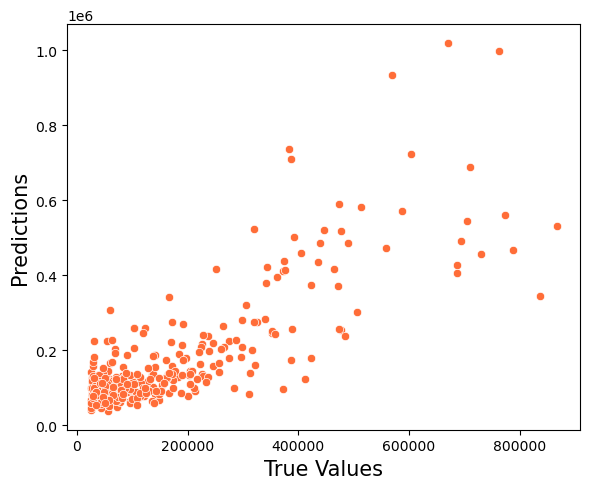

In [286]:
plt.figure(figsize=(6,5))
sns.scatterplot(y_test.round(2), Predicted)
print('\033[1m'+' True Values Vs Predicted Values plot :' +'\033[0m')
plt.xlabel('True Values' , fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()

<span style="color:brown; font-weight:bold; font-size:22px;">** Model building completed for dataframe with target variable "VOTES"  **</span>

<span style="color:blue; font-weight:bold; font-size:26px;">Overall Summary</span>


- **After web scrapping the data from IMDb website, I tried to understand the meaning of each feature/variable in the dataset and their datatypes.**


- **There are 1751 rows and 23 columns in the dataset. Out of 23 columns, there are 15 features with Object datatypes, 4 with int datatypes and rest are float datatypes**


- **There are two Target Variables as per the problem statement. 1. 'Votes' 2. 'Gross Collection'. Per problem statement, I need to develop two Regression models as target variable "Votes" is of 'int' datatype and "Gross Collection" is of float data type**


- **I have performed the data integrity check initially for finding non-interpretable values in the dataset, duplicate values, null values**


- **The original dataset after web scrapping has multiple columns with missing values, hence understood each feature/variable basis problem context and devised the imputation strategy as below**


- **<u>1. "Director 2 to Director 6":<u>** **There are many missing values in the columns "Director 2 to Director 6" with missing values percentage is more than 90%. However, I didn’t not drop these columns as the "Director" plays a key role in the film making process and plays a vital role in shaping the overall vision of the project. Instead of removing these columns, I replaced the null values with "Others" in these director columns. I didn't use "mode" imputation here as I am assuming that the missing director names can be different and not similar to the most frequent name. Replacing missing values with "Others" helped me to consider the importance of known Directors in these columns on overall "Gross-Collection" and "Votes" prediction.**


- **<u>2. "Gross (USD millions)":<u>** **There is 16% missing data for Gross Collection. This is target variable for regression model predicting "Gross Collection". Imputing missing values in the target variable is a challenging problem as it directly affects the modeling of the problem. In most cases, imputing the target variable is not recommended as it can introduce bias and reduce the accuracy of the model. It is not recommended to perform the imputation on target variable with this significant missing data (16%). Hence I dropped these 16% rows for the regression model where "Gross (USD millions)" is a target variable however I did not drop any rows in "Gross (USD millions)" for another regression model where the target variable is "Votes" as "Votes" columns don't have any missing values, hence overall I created two data frames 1. By deleting rows corresponds to missing data in "Gross (USD millions)" and use this data frame for building regression model to predict "Gross Collection" 2. By imputing the missing data in "Gross (USD millions)" as X feature and use this data frame for building regression model to predict "Votes"**


- **<u>3. "Popularity" & "Metascore":<u>** **There is 32.4% missing data for "Popularity" and 10.5% missing data for "Metascore". As there is significant missing data in these columns, I imputed them however I didn't want to consider only "simple imputer" to get the imputed dataset. Instead, I applied various imputation techniques (1. Simple Imputer 2. KNN Imputer 3. Multiple Iterative Imputer (MICE)) to impute the data for these columns.**	


- **<u>4. "Genre2" & "Genre3":<u>** **There is 0.1% missing data for "Genre2" and 8.2% missing data for "Genre3". I used "Others" to replace missing values for these two columns. I didn't use "mode" imputation here as I am assuming that the missing "Genre" categories can be different and not similar to the most frequent category. Replacing missing values with "Others" helped me to consider the importance of known "Genre" categories in these columns on overall "Gross-Collection" and "Votes" prediction. I also did feature engineering by creating another column with "No. of Genres" which helped me to consider the importance of no. of Genres considered on movie success**


- **<u>5. "Star2", "Star3" & "Star4":<u>** **There is 0.1% missing data for "Star2", "Star3" & "Star4". I used "Others" to replace missing values for these three columns. I didn't use "mode" imputation here as I am assuming that the missing "Star" names can be different and not similar to the most frequent name. Replacing missing values with "Others" helped me to consider the importance of known "Star" names in these columns on overall "Gross-Collection" and "Votes" prediction. I also did feature engineering by creating another column with "No. of Stars" which helped me to consider the importance of no. of Stars on movie success**


- **<u>6. "Certification":<u>** **There is 0.6% of missing data for "Certification". I used "mode" imputation here as the missing values are expected to have a strong tendency to occur with a particular value of different Certification categories (16+,A.,Approved,Certification,G,M,M/PG,Not Rated,Passed,PG,PG-13,R,TV-14,TV-MA,TV-PG,U,UA). Here I assumed that the missing values are likely to have the same value as the mode**

- **As mentioned in previous steps, I did feature engineering by adding three additional features "No. of Directors", "No. of Stars" and "No. of Genres" to get additional insights. I completed the imputation and also created two data frames per the above strategy** 

- **Then I have done graphical analysis 1. Univariate 2. Bi-variate and 3. Multi-variate graphical analysis and written the detailed insights from each graph**
    

- **As a part of feature selection, I used various feature selection techniques for both target variables 1. Checking coefficients of correlation 2. Checking top features using SelectKBest algorithm 3. Checking top features using feature importance with ExtraTreeRegressor. Based on all these techniques, dropped some features which are not important for target variable prediction.**
    

- **Then outliers were checked by using the box plot. % removal of outliers was checked with both z-score method and IQR method. I have chosen the data after removing the outliers from z-score method as the %of data loss was within 10% with z-score method.**
    

- **Then I have checked the multicollinearity using VIF and noticed that many features have VIF > 10 hence I decided to address this issue using PCA**
    

- **I checked skewness of the data and used various transformation techniques to check the skewness reduction and the finally have considered the data from Quantile Transformer as the skewness was reduced significantly with this transformer compared to others**

    
- **Then I used standard scaler to scale the data**
    

- **Then I have applied PCA technique to reduce the no. of features and addressed multicollinearity**
    

- **All the above EDA steps were performed for both data frames with different target variables**
    

- **As I need to develop Regression models, I started with Linear Regression to find out the best random state**
    

- **Then I determined the best no. of folds where the delta is least between cross validation and model scores**
    

- **Once I know the best random state and best no. of folds; I used them and ran multiple regression models including regularization and ensemble techniques and determined that ExtraTreeRegressor gave highest R2 score, highest cross validation score and reduced MAE, MSE and RMSE values compared to other models**
    

- **I have performed hyper parameter tuning on the best model (ExtraTreeRegressor) and tried to improve the score**
    

- **Even though I applied techniques like Hyperparameter Tuning, I could not increase the score as there was insufficient or bad data in the dataset**
    

- **Selected ExtraTree Regressor as the final model because of higher R2 score, higher cross validation score and low MAE, MSE and RMSE values compared to other models. In both regression models, noticed that ExtraTree Regressor is the best model**
    
    
- **I saved the best model after performing hyper parameter tuning and plotted actual & predicted values using the saved model**